## EDA

In [1]:
import os
from IPython.display import display
import pandas as pd
from scipy import stats
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.cluster import KMeans
# from ydata_profiling import ProfileReport
%matplotlib inline

In [2]:
# df = load_data(file_path='../data/dataset.csv')
PATH = os.getcwd()
df = pd.read_csv(os.path.join(PATH, "data/enriched_synthetic_data.csv"))
# df.drop(["music_id"], axis=1, inplace=True)
df.head()

,user_id,age,education,gender,country,music,artist_name,featured_artists,genre,plays,...,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,release_date,explicit
0,83811,16,Undergraduate,F,Urban,Bank Account,21 Savage,"Birdy, Zoé",Dark Trap,11,...,-8.228000,0,0.351000,0.000007,0.087100,0.376000,75.016000,4.0,2017-09-23,True
1,83811,16,Undergraduate,F,Urban,Little Talks,Of Monsters and Men,"Ninho, Snoop Dogg, Russ, Paramore",NaN,686,...,-7.879000,1,0.032200,0.000000,0.284500,0.413000,101.890500,4.0,2013-04-12,False
2,13397,17,Middle School,M,Non-Urban,Wherever I Go,OneRepublic,"Keith Urban, DJ Khaled, NIKI, MF DOOM",NaN,136,...,-7.344833,1,0.089400,0.043432,0.273133,0.404183,120.850500,4.0,2009-02-03,False
3,70645,44,Graduate,M,Non-Urban,No New Friends,DJ Khaled,"The xx, LIT killah",Pop,230,...,-7.606000,1,0.167000,0.000000,0.096600,0.400000,109.283000,4.0,2017-01-01,False
4,70645,44,Graduate,M,Non-Urban,Dreams,Campsite Dream,NaN,Country,391,...,-9.894632,1,0.078837,0.235527,0.180354,0.380815,120.488479,4.0,1974,False


In [3]:
# drop unused columns
df.drop(["education", "country"], axis=1, inplace=True)

In [4]:
print(df.shape)  # prints the dimensions of the DataFrame

(19974, 25)


In [6]:
# scaler = MinMaxScaler(feature_range=(1, 5))
# df["rating"] = scaler.fit_transform(df[["plays"]]).round().astype(int)

In [7]:
df.head()

,user_id,age,gender,music,artist_name,featured_artists,genre,plays,duration,music_id,...,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,release_date,explicit
0,83811,16,F,Bank Account,21 Savage,"Birdy, Zoé",Dark Trap,11,3.67,2fQrGHiQOvpL9UgPvtYy6G,...,-8.228000,0,0.351000,0.000007,0.087100,0.376000,75.016000,4.0,2017-09-23,True
1,83811,16,F,Little Talks,Of Monsters and Men,"Ninho, Snoop Dogg, Russ, Paramore",NaN,686,4.44,2ihCaVdNZmnHZWt0fvAM7B,...,-7.879000,1,0.032200,0.000000,0.284500,0.413000,101.890500,4.0,2013-04-12,False
2,13397,17,M,Wherever I Go,OneRepublic,"Keith Urban, DJ Khaled, NIKI, MF DOOM",NaN,136,2.83,46jLy47W8rkf8rEX04gMKB,...,-7.344833,1,0.089400,0.043432,0.273133,0.404183,120.850500,4.0,2009-02-03,False
3,70645,44,M,No New Friends,DJ Khaled,"The xx, LIT killah",Pop,230,5.14,5oVlbbiKGdGeZkWCFy0mqk,...,-7.606000,1,0.167000,0.000000,0.096600,0.400000,109.283000,4.0,2017-01-01,False
4,70645,44,M,Dreams,Campsite Dream,NaN,Country,391,3.20,1SNoSoQ3JZldOhzBY9gw0n,...,-9.894632,1,0.078837,0.235527,0.180354,0.380815,120.488479,4.0,1974,False


In [8]:
# Define presets for data visualization
def presets():
    plt.rc('figure', autolayout = True)

    plt.rc('axes', 
        labelsize = 'large',
        labelweight = 'bold',
        titlesize = 14,
        titleweight = 'bold',
        titlepad = 10       
    )

    %config InlineBackend.figure_format = 'retina'
    pd.options.display.max_rows = 10
    sns.set_style('darkgrid')
    # Set preset for darkmode for matplotlib and seaborn visualizations
    plt.style.use('dark_background')

    warnings.filterwarnings(action = 'ignore', category = UserWarning)
    return 

presets()



In [9]:
df.info(memory_usage="deep")  # prints the memory usage of the DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19974 entries, 0 to 19973
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   user_id           19974 non-null  int64  
 1   age               19974 non-null  int64  
 2   gender            19974 non-null  object 
 3   music             19974 non-null  object 
 4   artist_name       19974 non-null  object 
 5   featured_artists  9618 non-null   object 
 6   genre             17450 non-null  object 
 7   plays             19974 non-null  int64  
 8   duration          19974 non-null  float64
 9   music_id          19974 non-null  object 
 10  id_artists        19974 non-null  object 
 11  acousticness      19974 non-null  float64
 12  danceability      19974 non-null  float64
 13  energy            19974 non-null  float64
 14  key               19974 non-null  int64  
 15  loudness          19974 non-null  float64
 16  mode              19974 non-null  int64 

In [10]:
df["release_date"].value_counts()

release_date
1996          183
2000          181
1972          172
1997          166
1995          165
             ... 
1998-05-01      1
2007-11-08      1
2012-05-19      1
2011-12-27      1
2017-03-22      1
Name: count, Length: 3402, dtype: int64

In [11]:
# df.shape
df.describe(include="all")  # prints the summary statistics of the DataFrame

,user_id,age,gender,music,artist_name,featured_artists,genre,plays,duration,music_id,...,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,release_date,explicit
count,19974.000000,19974.000000,19974,19974,19974,9618,17450,19974.000000,19974.00000,19974,...,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974,19974
unique,NaN,NaN,2,9470,5085,8585,38,NaN,NaN,11528,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3402,2
top,NaN,NaN,M,Closer,Drake,Miracle Tones,Classical,NaN,NaN,7BKLCZ1jbUBVqRi2FVlTVw,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1996,False
freq,NaN,NaN,10000,49,271,7,1479,NaN,NaN,33,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,183,18710
mean,49680.999149,35.925253,NaN,NaN,NaN,NaN,NaN,384.862972,3.87686,NaN,...,-8.805136,0.729749,0.085706,0.156571,0.186839,0.477929,121.014846,3.944878,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
min,4.000000,13.000000,NaN,NaN,NaN,NaN,NaN,1.000000,0.00000,NaN,...,-37.796000,0.000000,0.000000,0.000000,0.009360,0.000000,0.000000,0.000000,NaN,NaN
25%,24543.250000,18.000000,NaN,NaN,NaN,NaN,NaN,1.000000,3.33000,NaN,...,-10.082778,0.000000,0.043182,0.000445,0.126085,0.367500,111.692446,4.000000,NaN,NaN
50%,49514.000000,30.000000,NaN,NaN,NaN,NaN,NaN,225.000000,3.75000,NaN,...,-8.465000,1.000000,0.063075,0.100860,0.170092,0.464207,120.628039,4.000000,NaN,NaN
75%,74545.750000,52.000000,NaN,NaN,NaN,NaN,NaN,660.000000,4.28000,NaN,...,-7.064333,1.000000,0.096595,0.229892,0.215405,0.579846,129.374425,4.000000,NaN,NaN


In [12]:
# profile = ProfileReport(
#     df, title="EDA Report", explorative=True
# )  # generates a profile report of the DataFrame

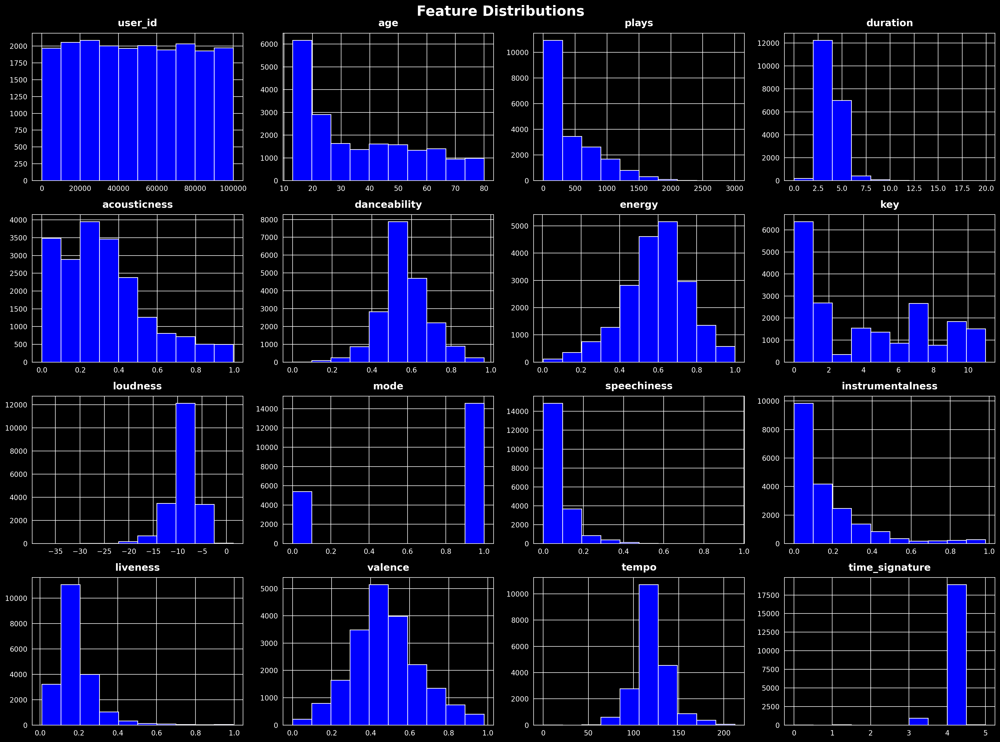

In [13]:
# Plot histograms with sky blue color
supt_presets = dict(fontsize=20, fontweight="bold")

df.hist(figsize=(20, 15), color="blue")
plt.suptitle("Feature Distributions", **supt_presets)
plt.show()  # plots the histograms of the DataFrame with sky blue color

In [14]:
def check_missing_value():
    # show number of missing values as a dataframe by column
    missing_values = df.isnull().sum()
    missing_values = missing_values[missing_values > 0]
    missing_values = missing_values.sort_values(ascending=False)
    missing_values = missing_values.reset_index()
    missing_values.columns = ["Feature", "Missing Values"]
    return missing_values


check_missing_value()

,Feature,Missing Values
0,featured_artists,10356
1,genre,2524


In [15]:
# Fill featured_artists missing values with "Unknown"
df["featured_artists"].fillna("None", inplace=True)

/tmp/ipykernel_58559/327049541.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["featured_artists"].fillna("None", inplace=True)


In [16]:
# Fill genre missing values with "Unknown"
df["genre"] = df["genre"].fillna("Unknown")

In [17]:
check_missing_value()

,Feature,Missing Values


In [18]:
df.select_dtypes(
    include=["category", "object"]
).columns.tolist()  # prints the columns with categorical data

['gender',
 'music',
 'artist_name',
 'featured_artists',
 'genre',
 'music_id',
 'id_artists',
 'release_date']

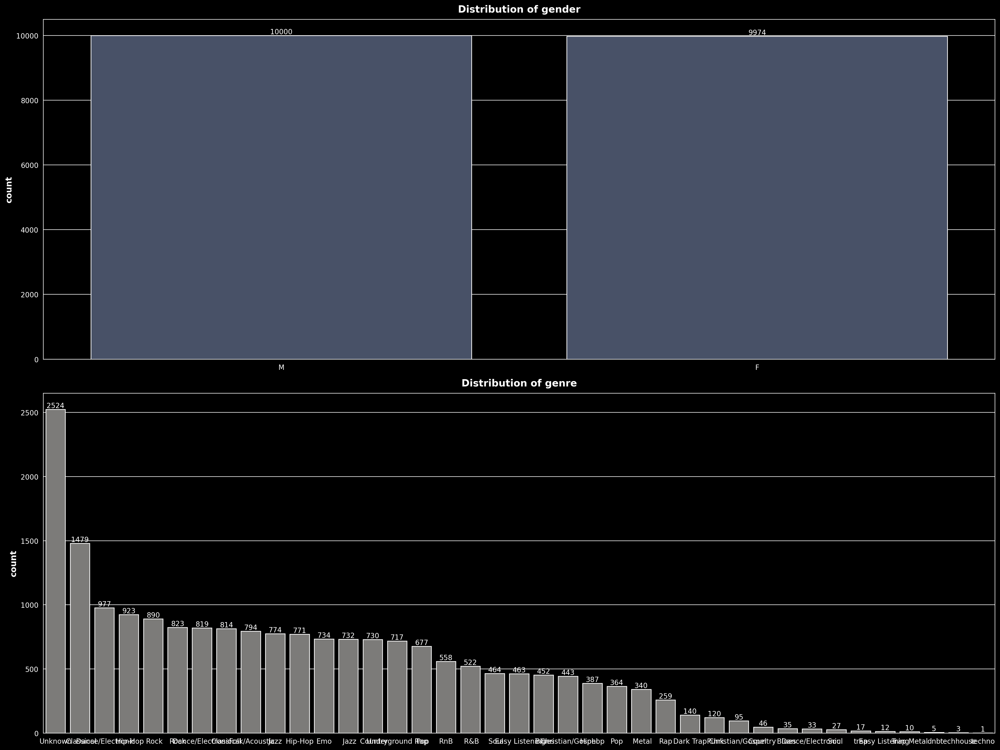

In [19]:
# distribution of categorical columns
cat_cols = ["gender", "genre", "explicit"]
fig, axes = plt.subplots(2, 1, figsize=(20, 15))
cc = sns.color_palette(n_colors=len(cat_cols), palette="cividis")

for i, ax in enumerate(axes.flatten()):
    # Count the occurrences of each category
    count_data = df[cat_cols[i]].value_counts().sort_values(ascending=False)
    sns.countplot(x=cat_cols[i], data=df, order=count_data.index, ax=ax, color=cc[i])
    ax.set(xlabel="", title=f"Distribution of {cat_cols[i]}")
    ax.bar_label(ax.containers[0], fmt="%.0f")
plt.show()

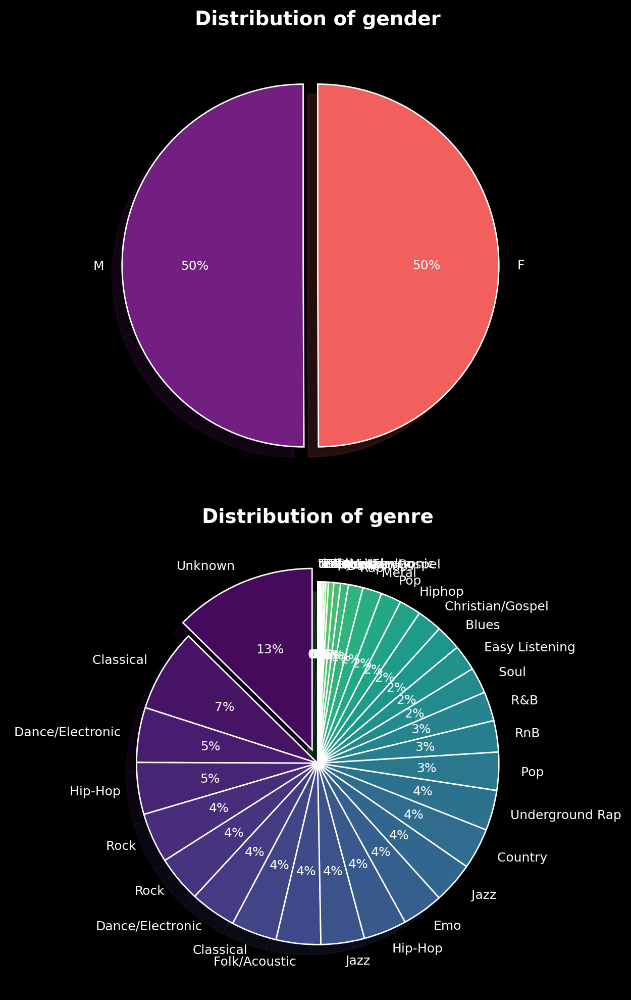

In [20]:
cat_cols = ["gender", "genre", "explicit"]
fig, axes = plt.subplots(2, 1, figsize=(10, 10))
cc = ["magma", "viridis", "cividis", "magma"]

for i, ax in enumerate(axes.flatten()):
    # Count the occurrences of each category
    count_data = df[cat_cols[i]].value_counts().sort_values(ascending=False)
    # Create pie chart
    n = count_data.shape[0]
    wedges, texts, autotexts = ax.pie(
        count_data,
        labels=count_data.index,
        autopct="%.0f%%",
        colors=sns.color_palette(n_colors=n, palette=cc[i]),
        startangle=90,
        textprops={"fontsize": 9},
        explode=[0.08] + [0] * (n - 1),
        shadow=True,
    )
    ax.set(title=f"Distribution of {cat_cols[i]}")

plt.tight_layout()
plt.show()  # plots the distribution of categorical columns

## Fixing Data Quality Issues With Genre


In [21]:
df["genre"].unique()

array(['Dark Trap', 'Unknown', ' Pop', ' Country', 'Classical', 'Rock',
       'Hiphop', ' Soul  ', 'Dance/Electronic', 'Jazz', ' Soul',
       ' Classical', ' Christian/Gospel', ' Dance/Electronic', 'Hip-Hop',
       ' Hip-Hop', 'Underground Rap', ' Jazz', ' Rock', ' Folk/Acoustic',
       ' Country  ', ' Easy Listening', 'Emo', ' Metal', ' R&B', 'Rap',
       ' Christian/Gospel  ', 'RnB', ' Blues', 'Pop', ' Punk',
       ' Dance/Electronic  ', 'Trap Metal', 'trap', ' Easy Listening  ',
       ' Blues  ', 'dnb', 'techhouse', 'techno'], dtype=object)

In [22]:
# Strip leading and trailing whitespace from the genre column
df["genre"] = df["genre"].str.strip()

# Define the mapping for similar genres
genre_mapping = {
    " Pop": "Pop",
    " Country": "Country",
    " Classical": "Classical",
    " Christian/Gospel": "Christian/Gospel",
    " Dance/Electronic": "Dance/Electronic",
    " Hip-Hop": "Hip-Hop",
    "Hiphop": "Hip-Hop",
    " Jazz": "Jazz",
    " Rock": "Rock",
    " Soul": "Soul",
    " Country  ": "Country",
    " Christian/Gospel  ": "Christian/Gospel",
    "R&B": "RnB",
    "RnB": "RnB",
}

# Apply the mapping to the genre column
df["genre"] = df["genre"].replace(genre_mapping)

# Verify the cleaned genres
unique_genres = df["genre"].unique()
print(unique_genres)

['Dark Trap' 'Unknown' 'Pop' 'Country' 'Classical' 'Rock' 'Hip-Hop' 'Soul'
 'Dance/Electronic' 'Jazz' 'Christian/Gospel' 'Underground Rap'
 'Folk/Acoustic' 'Easy Listening' 'Emo' 'Metal' 'RnB' 'Rap' 'Blues' 'Punk'
 'Trap Metal' 'trap' 'dnb' 'techhouse' 'techno']


In [23]:
# If genre value counts less than 100, replace with "Other"
genre_counts = df["genre"].value_counts()
other_genres = genre_counts[genre_counts < 100].index
df["genre"] = df["genre"].replace(other_genres, "Other")

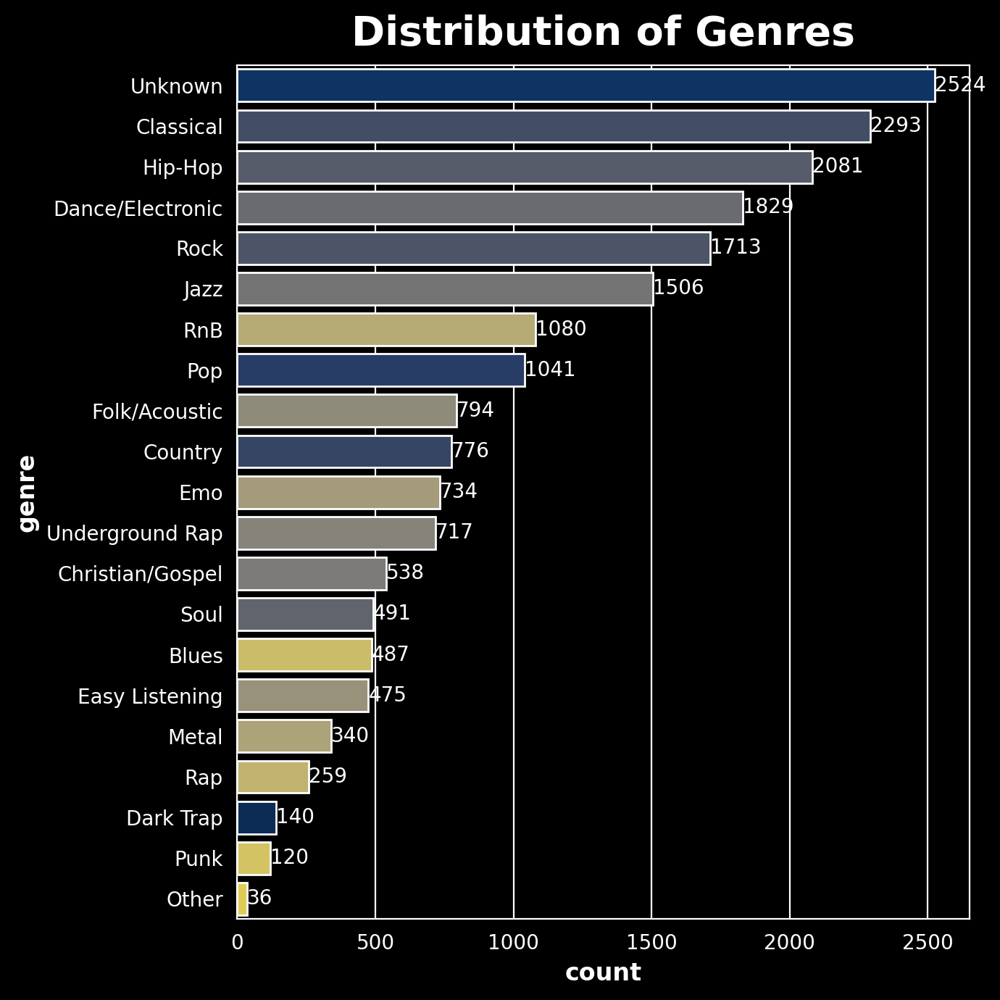

In [24]:
count_order = df["genre"].value_counts().sort_values(ascending=False)
fig, ax = plt.subplots(figsize=(7, 7))
sns.countplot(
    df,
    y="genre",
    hue="genre",
    order=count_order.index,
    ax=ax,
    palette="cividis",
    legend=False,
)
ax.set_title("Distribution of Genres", **supt_presets)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")  # plots the distribution of genres

In [24]:
# profile.to_notebook_iframe()  # displays the profile report in the Jupyter notebook

# Fixing Data quality issues with music ids

In [25]:
duplicate_ids = df[df.duplicated('music_id', keep=False)]
print(f"Duplicate music IDs:\n{duplicate_ids}")


Duplicate music IDs:
       user_id  age gender             music             artist_name  \
0        83811   16      F      Bank Account               21 Savage   
1        83811   16      F      Little Talks     Of Monsters and Men   
3        70645   44      M    No New Friends               DJ Khaled   
5        10323   18      M  Internet Friends             Knife Party   
7         7945   60      F             Roses        The Chainsmokers   
...        ...  ...    ...               ...                     ...   
19965    10623   18      M              Hive         Earl Sweatshirt   
19966    10623   18      M   Brown Eyed Girl            Van Morrison   
19967    74433   18      F             Flaws  Vancouver Sleep Clinic   
19971    94134   44      M     Take You Down             Chris Brown   
19973    78124   65      F       Radioactive         Imagine Dragons   

                                      featured_artists             genre  \
0                                     

In [26]:
df = df.drop_duplicates(subset='music_id', keep='first')


In [27]:
missing_ids = df[df['music_id'].isnull()]
print(f"Entries with missing IDs:\n{missing_ids}")


Entries with missing IDs:
Empty DataFrame
Columns: [user_id, age, gender, music, artist_name, featured_artists, genre, plays, duration, music_id, id_artists, acousticness, danceability, energy, key, loudness, mode, speechiness, instrumentalness, liveness, valence, tempo, time_signature, release_date, explicit]
Index: []

[0 rows x 25 columns]


In [67]:
unique_music_ids = df['music_id'].nunique()
print(f"Unique music IDs: {unique_music_ids}")

Unique music IDs: 11528


## Analysis of Song Names

---


In [26]:
from wordcloud import WordCloud
from collections import Counter
import nltk
from nltk.corpus import stopwords
import string

df_ = df.copy()
# Text Preprocessing
# nltk.download("stopwords")
stop_words = set(stopwords.words("english"))

ModuleNotFoundError: No module named 'wordcloud'

In [29]:
def preprocess_text(text):
    # Remove punctuation
    text = text.translate(str.maketrans("", "", string.punctuation))
    # Convert to lowercase
    text = text.lower()
    # Remove stopwords
    text = " ".join(word for word in text.split() if word not in stop_words)
    return text


df_["cleaned_music"] = df_["music"].apply(preprocess_text)

# Word Frequency Analysis
all_words = " ".join(df_["cleaned_music"]).split()
word_freq = Counter(all_words)

NameError: name 'df_' is not defined

In [133]:
display(df_["cleaned_music"].head(20))

0      bank account
1      little talks
2       wherever go
3       new friends
4            dreams
          ...      
15           upside
16             love
17         practice
18    crooked teeth
19     livin prayer
Name: cleaned_music, Length: 20, dtype: object

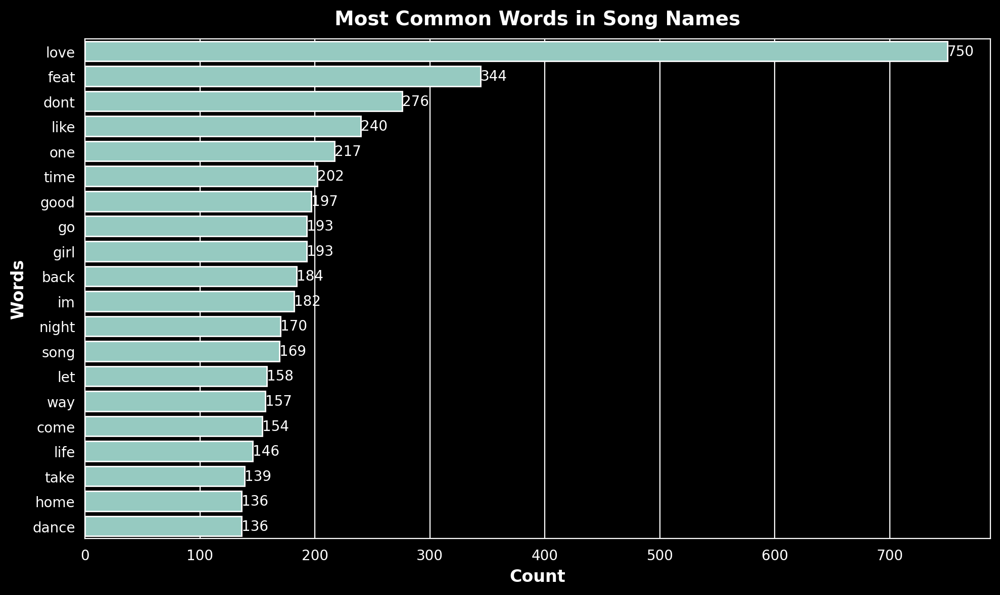

In [134]:
most_common_words = word_freq.most_common(20)

# Plotting Most Common Words
words, counts = zip(*most_common_words)
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x=list(counts), y=list(words), ax=ax)
plt.title("Most Common Words in Song Names")
plt.xlabel("Count")
plt.ylabel("Words")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.show()

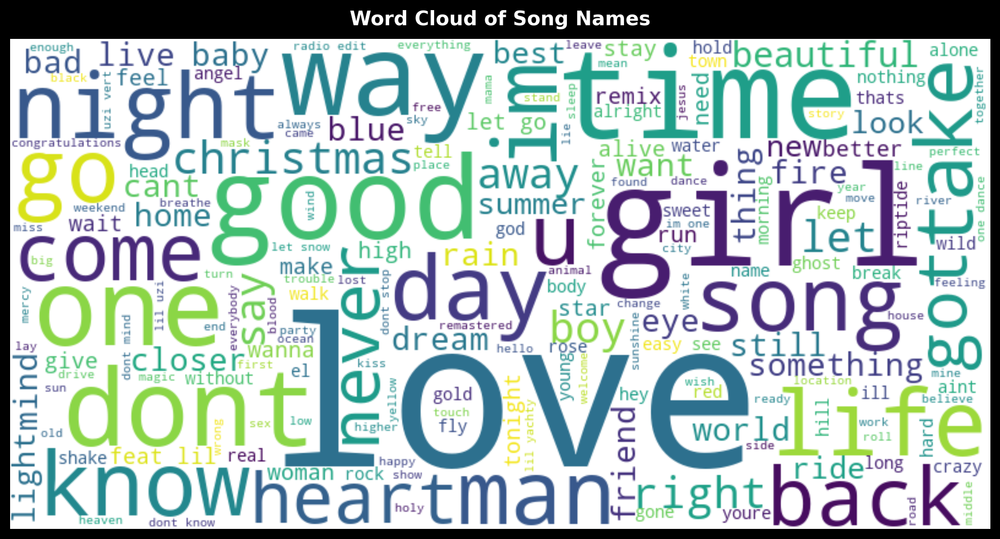

In [135]:
# Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(
    " ".join(all_words)
)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of Song Names")
plt.show()

## N-Gram Analysis

---


In [136]:
from nltk.util import ngrams


def get_ngrams(text, n):
    n_grams = ngrams(text.split(), n)
    return [" ".join(grams) for grams in n_grams]


df_["bigrams"] = df_["cleaned_music"].apply(lambda x: get_ngrams(x, 2))
bigram_list = [item for sublist in df_["bigrams"].tolist() for item in sublist]
bigram_freq = Counter(bigram_list)
most_common_bigrams = bigram_freq.most_common(20)

display(most_common_bigrams)

[('let go', 48),
 ('feat lil', 47),
 ('let snow', 29),
 ('dont know', 27),
 ('radio edit', 26),
 ('dont stop', 24),
 ('im one', 23),
 ('dont mind', 23),
 ('one dance', 23),
 ('lil yachty', 23),
 ('lil uzi', 22),
 ('uzi vert', 22),
 ('im gonna', 21),
 ('ispy feat', 21),
 ('say name', 21),
 ('trap queen', 20),
 ('bad boujee', 20),
 ('boujee feat', 20),
 ('let love', 20),
 ('young dumb', 20)]

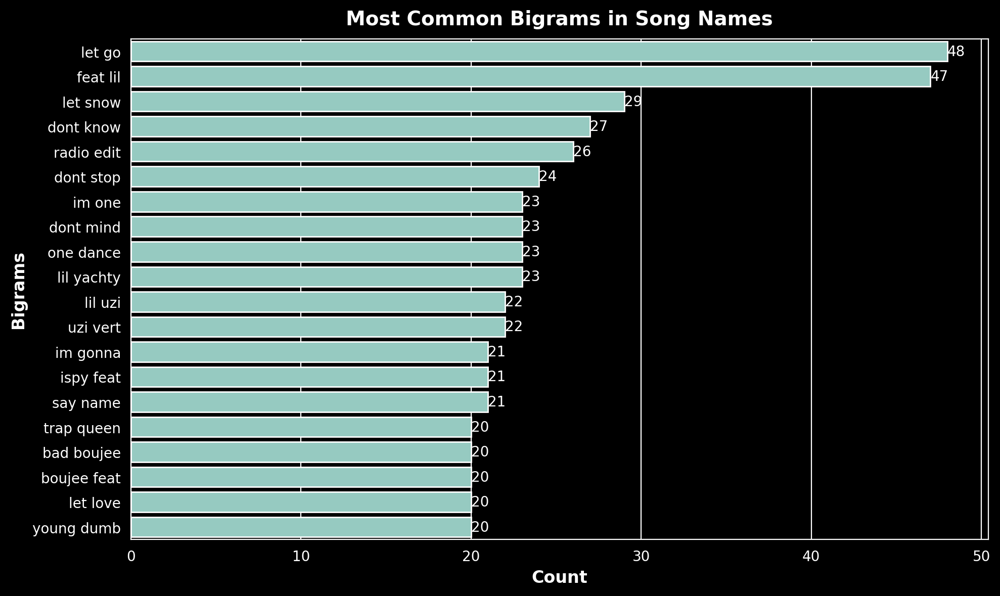

In [137]:
bigrams, counts = zip(*most_common_bigrams)
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x=list(counts), y=list(bigrams), ax=ax)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.title("Most Common Bigrams in Song Names")
plt.xlabel("Count")
plt.ylabel("Bigrams")
plt.show()

In [138]:
# Select numeric columns only
df_numeric = df.select_dtypes(include=[np.number])

# Identify outliers using IQR method
Q1 = df_numeric.quantile(0.25)
Q3 = df_numeric.quantile(0.75)
IQR = Q3 - Q1

# Define outlier criteria
outliers = (df_numeric < (Q1 - 1.5 * IQR)) | (df_numeric > (Q3 + 1.5 * IQR))
print(outliers.sum())

# Remove outliers
df_no_outliers = df_numeric[
    ~((df_numeric < (Q1 - 1.5 * IQR)) | (df_numeric > (Q3 + 1.5 * IQR))).any(axis=1)
]

user_id              0
age                  0
plays              259
duration           915
acousticness       691
                  ... 
liveness          1049
valence            405
tempo             1600
time_signature    1076
rating              99
Length: 17, dtype: int64


## Statistical Tests


In [28]:
df.columns

Index(['user_id', 'age', 'gender', 'music', 'artist_name', 'featured_artists',
       'genre', 'plays', 'duration', 'music_id', 'id_artists', 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'release_date', 'explicit'],
      dtype='object')

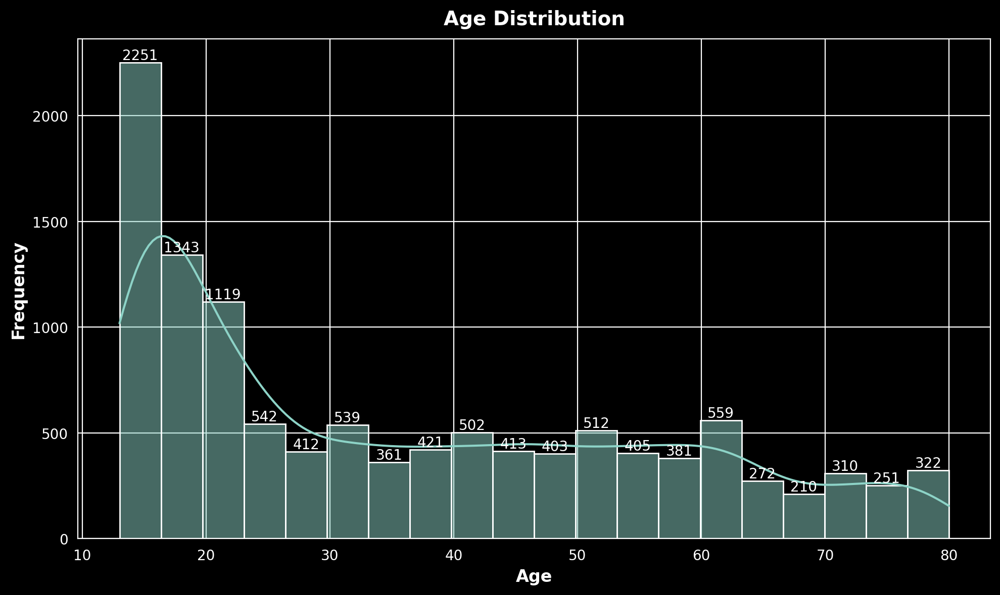

In [29]:
# Histograms for age distribution
fig, ax = plt.subplots(figsize=(10, 6))
# plt.figure(figsize=(10, 6))
sns.histplot(df["age"], bins=20, kde=True)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.title("Age Distribution")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.show()

In [30]:
len(df["music"].unique())

9470

In [31]:
df["age_group"] = pd.cut(
    df["age"],
    bins=[0, 26, 42, 58, 77, 100],
    labels=["Gen Z", "Millenials", "Gen X", "Baby Boomers", "Silent Generation"],
)

## Age based preferences


In [32]:
df.columns

Index(['user_id', 'age', 'gender', 'music', 'artist_name', 'featured_artists',
       'genre', 'plays', 'duration', 'music_id', 'id_artists', 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'release_date', 'explicit', 'age_group'],
      dtype='object')

In [33]:
features = df[
    [
        "age",
        "plays",
        "acousticness",
        "danceability",
        "energy",
        "key",
        "loudness",
        "mode",
        "speechiness",
        "instrumentalness",
        "liveness",
        "valence",
        "tempo",
        "time_signature",
        "explicit",
    ]
]
features.head()

,age,plays,acousticness,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,explicit
0,16,11,0.015100,0.884000,0.346000,8,-8.228000,0,0.351000,0.000007,0.087100,0.376000,75.016000,4.0,True
1,16,686,0.180850,0.577500,0.497500,1,-7.879000,1,0.032200,0.000000,0.284500,0.413000,101.890500,4.0,False
2,17,136,0.363482,0.568667,0.644000,0,-7.344833,1,0.089400,0.043432,0.273133,0.404183,120.850500,4.0,False
3,44,230,0.676000,0.843000,0.419000,1,-7.606000,1,0.167000,0.000000,0.096600,0.400000,109.283000,4.0,False
4,44,391,0.359471,0.518229,0.544046,0,-9.894632,1,0.078837,0.235527,0.180354,0.380815,120.488479,4.0,False


In [34]:
scaler = MinMaxScaler()
features_scaled = scaler.fit_transform(features)
features_scaled = pd.DataFrame(features_scaled, columns=features.columns)
features_scaled.head()

NameError: name 'MinMaxScaler' is not defined

In [35]:
# Correlation between age, plays, and audio features
# audio_features = ['acousticness',
#        'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
#        'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
#        'release_date', 'explicit']
correlation_matrix = features_scaled.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation between Age, Plays, and Audio Features")
plt.show()

# Age vs Plays for different genres
plt.figure(figsize=(12, 6))
sns.boxplot(x="genre", y="plays", data=df)
plt.title("Number of Plays by Genre")
plt.xticks(rotation=45)
plt.show()

NameError: name 'features_scaled' is not defined

## Gender-based preferences


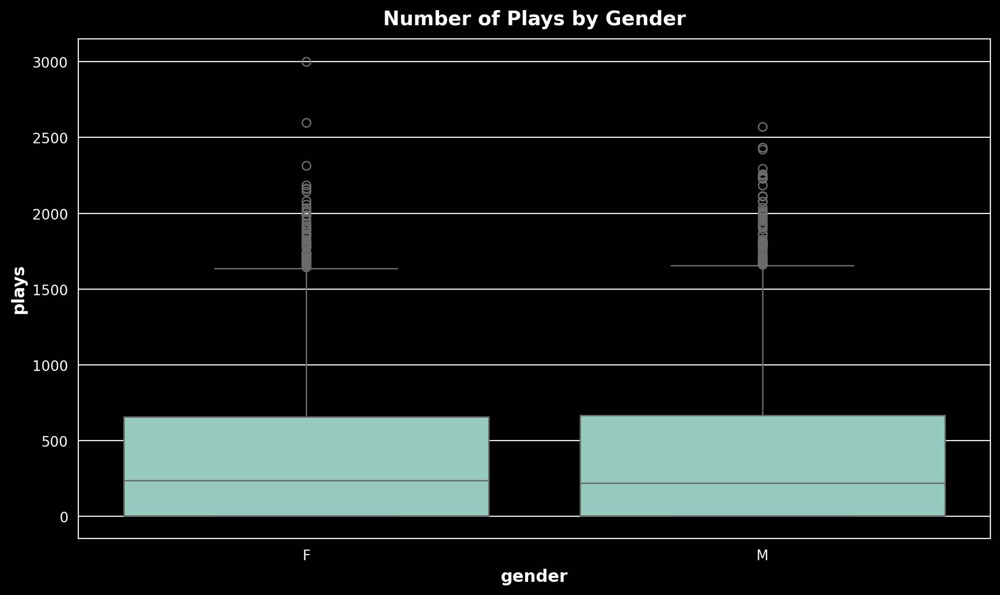

Plays by Gender t-test:
t-statistic = -0.4920659603317593
p-value = 0.6226820864246665


ValueError: Could not interpret value `rating` for `x`. An entry with this name does not appear in `data`.

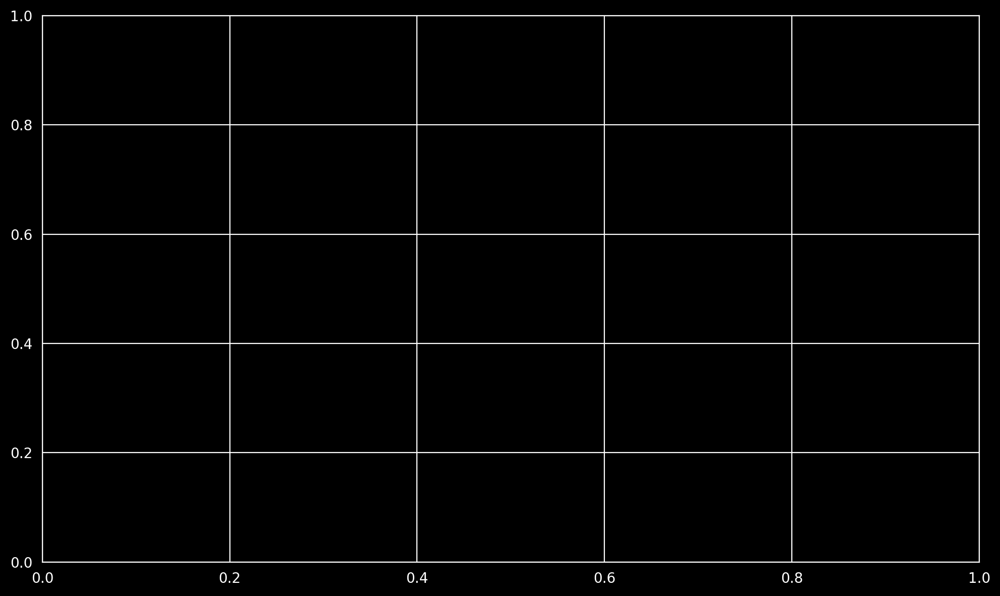

In [36]:
# Gender vs Plays
from matplotlib.pyplot import bar_label


plt.figure(figsize=(10, 6))
sns.boxplot(x="gender", y="plays", data=df)
plt.title("Number of Plays by Gender")
plt.show()

t_stat, p_value = stats.ttest_ind(
    df[df["gender"] == "M"]["plays"], df[df["gender"] == "F"]["plays"]
)
print(
    f"Plays by Gender t-test:\n{'='*60}\nt-statistic = {t_stat}\n{'='*60}\np-value = {p_value}"
)

# Gender vs Rating
fig, ax = plt.subplots(figsize=(10, 6))
# plt.figure(figsize=(10, 6))
sns.countplot(x="rating", hue="gender", data=df)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.title("Rating Distribution by Gender")
plt.show()

## Age and Explicit Content


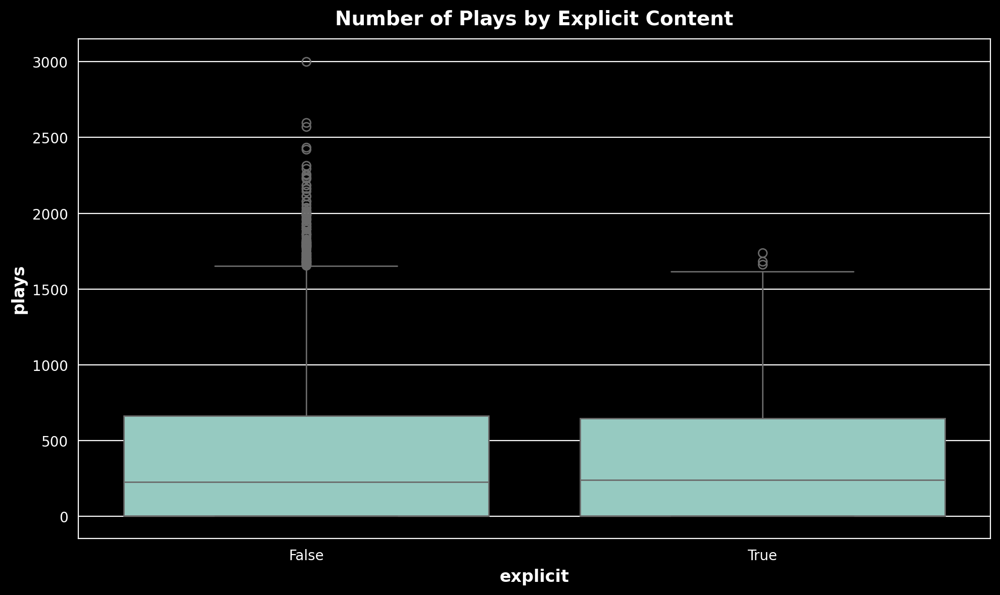

Chi-square statistic: 3.0728698457943295
p-value: 0.5457057316964766


In [37]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="explicit", y="plays", data=df)
plt.title("Number of Plays by Explicit Content")
plt.show()

# Chi-square test for age groups and explicit content
age_bins = pd.cut(df["age"], bins=5)
contingency_table = pd.crosstab(age_bins, df["explicit"])
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"Chi-square statistic: {chi2}\n{'='*40}\np-value: {p_value}")

### Interpretations

1. Age-based preferences (Images 1 and 2):

Image 1 shows the number of plays by genre. There's considerable variation in popularity across genres, with some (like Pop, Country, and Classical) having higher median plays and larger ranges. This suggests that age groups may have different genre preferences.

Image 2 displays correlations between age, plays, and audio features. Notably:

- There's very little correlation between age and number of plays (-0.00031), suggesting age doesn't strongly influence how much someone listens to music.
- Age has weak correlations with audio features, the strongest being with loudness (-0.01).
- The strongest correlations are between audio features themselves, like energy and loudness (0.78), or acousticness and energy (-0.76).

2. Gender-based preferences (Images 3 and 4, plus t-test results):

Image 3 shows the distribution of plays by gender. The box plots look very similar, suggesting little difference in listening habits between genders.

Image 4 displays the rating distribution by gender, which also appears very similar across genders.

The t-test results confirm these observations:

- t-statistic: -1.057148120714328
- p-value: 0.29045677890324295

The high p-value (0.29 > 0.05) indicates that there's no statistically significant difference in the number of plays between genders.

3. Explicit content (Image 5 and Chi-square test results):

Image 5 shows the distribution of plays for explicit and non-explicit content. The distributions look similar, suggesting that the presence of explicit content doesn't strongly influence the number of plays.

The Chi-square test results support this observation:

- Chi-square statistic: 4.774535222086405
- p-value: 0.31122348328526456

The high p-value (0.31 > 0.05) indicates no statistically significant relationship between explicit content and the number of plays.

Interpretation summary:

1. Genre seems to have the strongest influence on the number of plays, suggesting it's an important factor in music preferences.
2. Age doesn't strongly correlate with plays or audio features, indicating that age-based recommendations might not be very effective.
3. Gender doesn't significantly impact listening habits or ratings, suggesting that gender-based recommendations may not be necessary.
4. The presence of explicit content doesn't significantly affect the number of plays.
5. Audio features have strong correlations with each other, which could be useful for content-based filtering in your recommender system.

For your music recommender system, these results suggest that focusing on genre preferences and audio features might be more effective than relying heavily on demographic factors like age or gender. However, individual user behavior (collaborative filtering) and content-based approaches using audio features are likely to be your most powerful tools.


## Genre and Audio Features


In [38]:
# plt.figure(figsize=(15, 12))
# for i, feature in enumerate(audio_features + ["plays"], 1):
#     plt.subplot(3, 2, i)
#     sns.boxplot(x="genre", y=feature, data=df)
#     plt.title(f"{feature} by Genre")
#     plt.xticks(rotation=45)
# plt.tight_layout()
# plt.show()

### Interpretations


## Age and Release Date (considering plays)


In [39]:
df.head()

,user_id,age,gender,music,artist_name,featured_artists,genre,plays,duration,music_id,...,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,release_date,explicit,age_group
0,83811,16,F,Bank Account,21 Savage,"Birdy, Zoé",Dark Trap,11,3.67,2fQrGHiQOvpL9UgPvtYy6G,...,0,0.351000,0.000007,0.087100,0.376000,75.016000,4.0,2017-09-23,True,Gen Z
1,83811,16,F,Little Talks,Of Monsters and Men,"Ninho, Snoop Dogg, Russ, Paramore",Unknown,686,4.44,2ihCaVdNZmnHZWt0fvAM7B,...,1,0.032200,0.000000,0.284500,0.413000,101.890500,4.0,2013-04-12,False,Gen Z
2,13397,17,M,Wherever I Go,OneRepublic,"Keith Urban, DJ Khaled, NIKI, MF DOOM",Unknown,136,2.83,46jLy47W8rkf8rEX04gMKB,...,1,0.089400,0.043432,0.273133,0.404183,120.850500,4.0,2009-02-03,False,Gen Z
3,70645,44,M,No New Friends,DJ Khaled,"The xx, LIT killah",Pop,230,5.14,5oVlbbiKGdGeZkWCFy0mqk,...,1,0.167000,0.000000,0.096600,0.400000,109.283000,4.0,2017-01-01,False,Gen X
4,70645,44,M,Dreams,Campsite Dream,None,Country,391,3.20,1SNoSoQ3JZldOhzBY9gw0n,...,1,0.078837,0.235527,0.180354,0.380815,120.488479,4.0,1974,False,Gen X


In [52]:
def extract_year(x):
    try:
        return pd.to_datetime(x).year
    except ValueError:
        return int(x)


df["release_year"] = df["release_date"].apply(extract_year)

In [41]:
# def extract_year(x):
#     try:
#         return pd.to_datetime(x).year
#     except ValueError:
#         return int(x)


# df["release_year"] = df["release_date"].apply(extract_year)

In [53]:
def convert_dates_with_default(df, column_name):
    # Attempt to convert the column to datetime, invalid dates become NaT
    df[column_name] = pd.to_datetime(df[column_name], format="%Y", errors="coerce")

    # Replace NaT with the default date, here choosing January 1st, 2007
    default_date = pd.Timestamp("2007-01-01")
    df[column_name] = df[column_name].fillna(default_date)

    return df


# Example usage
# Assuming df is your DataFrame and 'release_year' is the column with dates
df = convert_dates_with_default(df, "release_date")

In [54]:
df["release_date"].isnull().sum()

0

In [55]:
# df["release_year"][df["release_year"] == 0] = df["release_year"].

In [56]:
df.iloc[8045]["release_date"]

Timestamp('2007-01-01 00:00:00')

In [57]:
df.iloc[10979]

user_id                          9404
age                                15
gender                              F
music                   Dirty Laundry
artist_name                Don Henley
                         ...         
time_signature                    4.0
release_date      2007-01-01 00:00:00
explicit                        False
age_group                       Gen Z
release_year                     2007
Name: 18654, Length: 27, dtype: object

In [58]:
# Set music =='I Wonder' with release_year of 2007 for all cases

In [59]:
df.columns

Index(['user_id', 'age', 'gender', 'music', 'artist_name', 'featured_artists',
       'genre', 'plays', 'duration', 'music_id', 'id_artists', 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'release_date', 'explicit', 'age_group', 'release_year'],
      dtype='object')

In [60]:
# df["release_year"].unique()

In [50]:
df["release_year"].isna().sum()

0

In [61]:
df["release_year"] = pd.to_datetime(df["release_year"], format="%Y")

In [62]:
df["release_year"]

0       2007-01-01
1       2007-01-01
2       2007-01-01
3       2007-01-01
4       1974-01-01
           ...    
19963   2007-01-01
19968   2007-01-01
19969   1993-01-01
19970   2007-01-01
19972   2007-01-01
Name: release_year, Length: 11528, dtype: datetime64[ns]

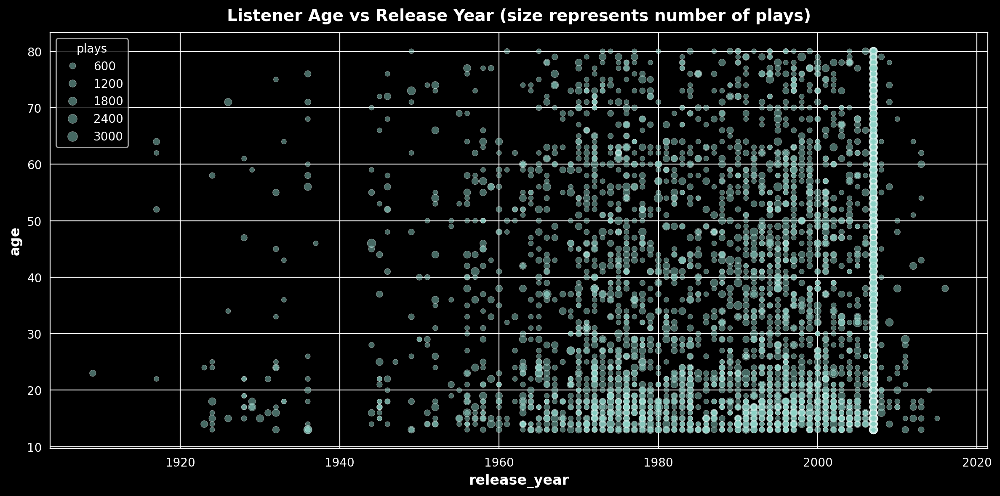

Correlation between age and release year: 0.012756


In [63]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x="release_year", y="age", size="plays", data=df, alpha=0.5)
plt.title("Listener Age vs Release Year (size represents number of plays)")
plt.show()

correlation = df["age"].corr(df["release_year"])
print(f"Correlation between age and release year: {correlation:.6f}")

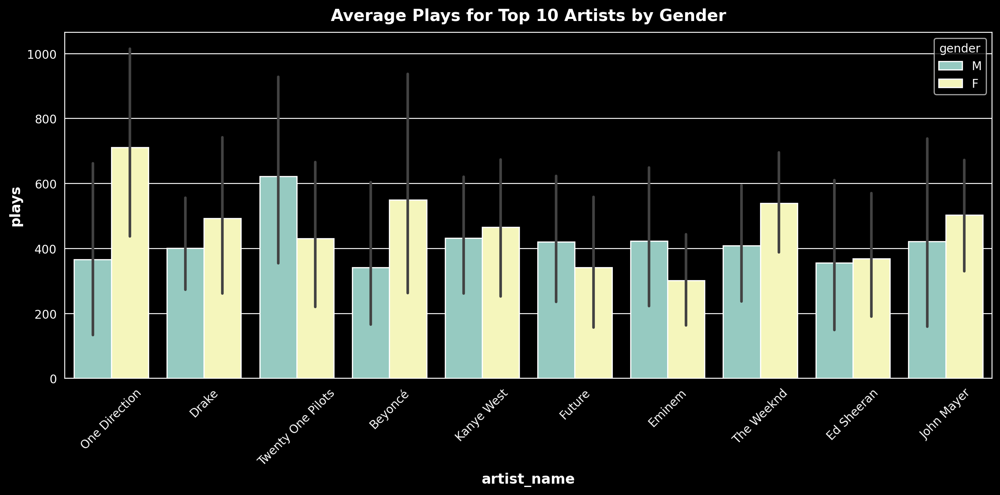

In [64]:
## Gender and artist preferences (considering plays):
top_artists = df.groupby("artist_name")["plays"].sum().nlargest(10).index
artist_gender_data = df[df["artist_name"].isin(top_artists)]

plt.figure(figsize=(12, 6))
sns.barplot(
    x="artist_name", y="plays", hue="gender", data=artist_gender_data, estimator=np.mean
)
plt.title("Average Plays for Top 10 Artists by Gender")
plt.xticks(rotation=45)
plt.show()

## Age and Tempo preferences (considering plays)


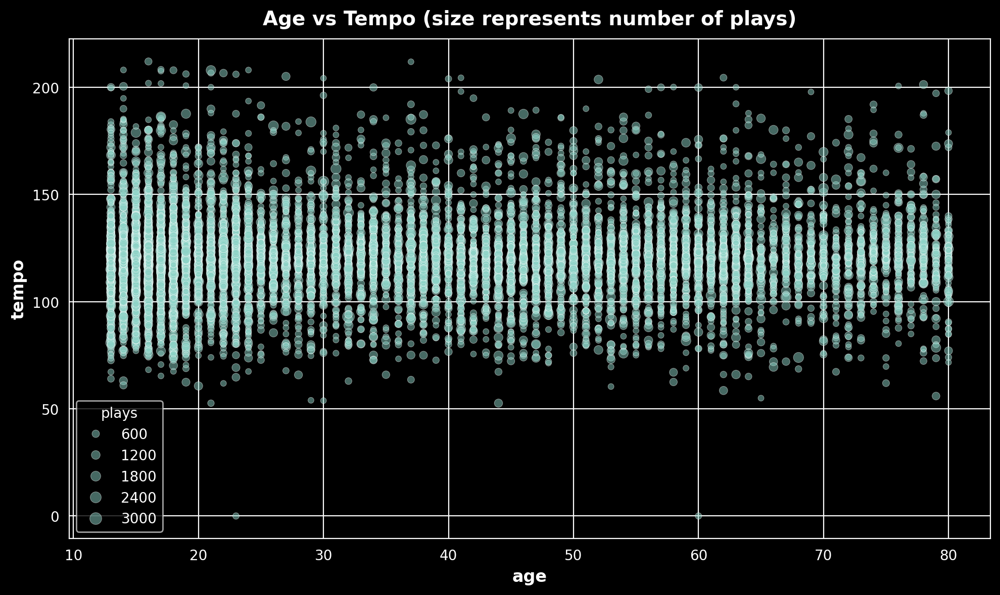

Correlation between age and tempo: 0.005


In [65]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x="age", y="tempo", size="plays", data=df, alpha=0.5)
plt.title("Age vs Tempo (size represents number of plays)")
plt.show()

correlation = df["age"].corr(df["tempo"])
print(f"Correlation between age and tempo: {correlation:.3f}")

## Gender and danceability


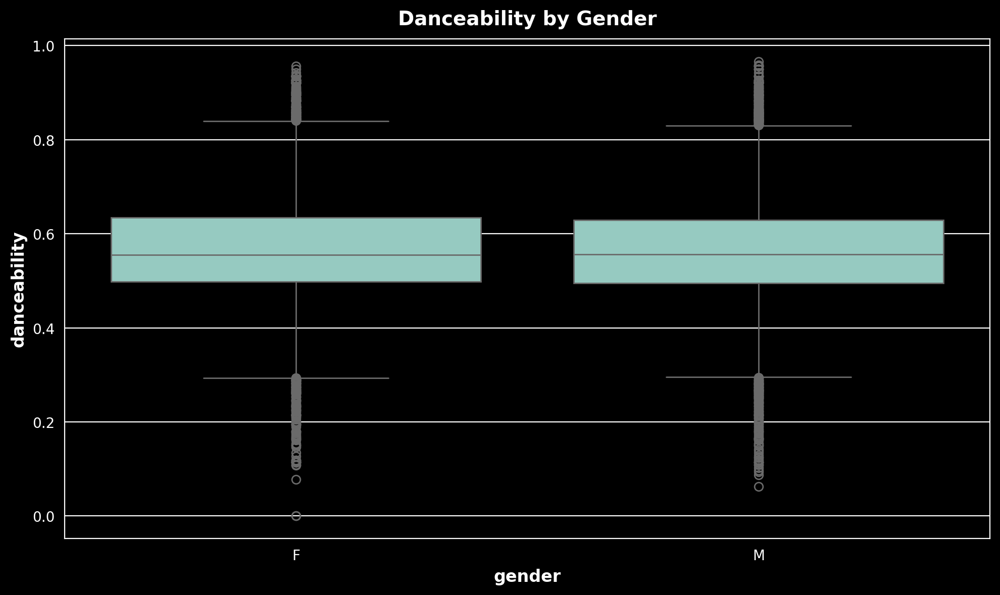

Danceability t-test: t-statistic = -1.419
p-value = 0.156
Correlation between danceability and plays: -0.006


In [55]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="gender", y="danceability", data=df)
plt.title("Danceability by Gender")
plt.show()

t_stat, p_value = stats.ttest_ind(
    df[df["gender"] == "M"]["danceability"], df[df["gender"] == "F"]["danceability"]
)
print(
    f"Danceability t-test: t-statistic = {t_stat:.3f}\n{'='*60}\np-value = {p_value:.3f}"
)

# Correlation between danceability and plays
correlation = df["danceability"].corr(df["plays"])
print(f"Correlation between danceability and plays: {correlation:.3f}")

In [56]:
from scipy.stats import chi2_contingency, f_oneway, ttest_ind

# Chi-Square Test for Independence between gender and genre
contingency_table = pd.crosstab(df["gender"], df["genre"])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f'Chi-Square Test:\np-value = {p:.3f}\n{"="*60}\n')

# ANOVA to test differences in danceability across age groups
age_groups = df["age"].unique()
danceability_data = [
    df[df["age"] == age_group]["danceability"] for age_group in age_groups
]
f_stat, p_val = f_oneway(*danceability_data)
print(f"ANOVA:\np-value = {p_val:.3f}")

Chi-Square Test:
p-value = 0.291

ANOVA:
p-value = 0.940


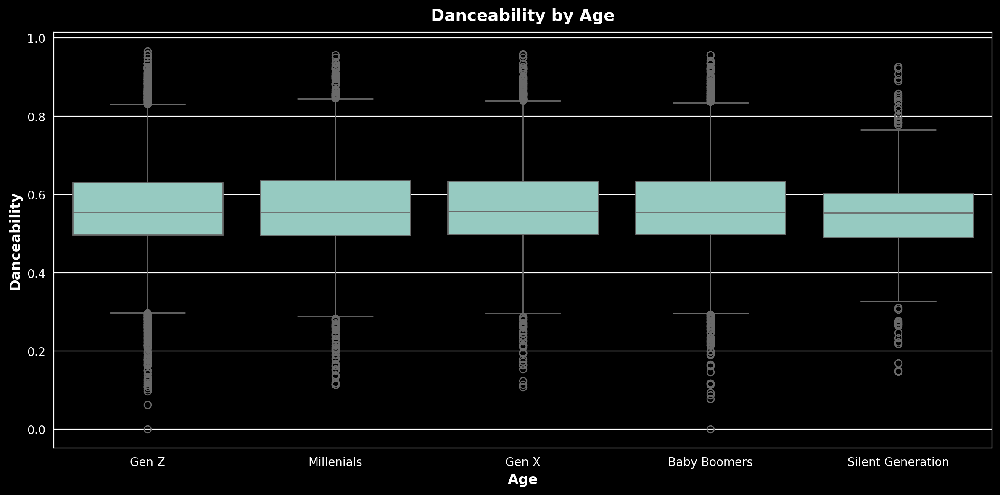

In [57]:
# Visualize danceability across different age groups
plt.figure(figsize=(12, 6))
sns.boxplot(x="age_group", y="danceability", data=df)
plt.title("Danceability by Age")
plt.xlabel("Age")
plt.ylabel("Danceability")
plt.show()

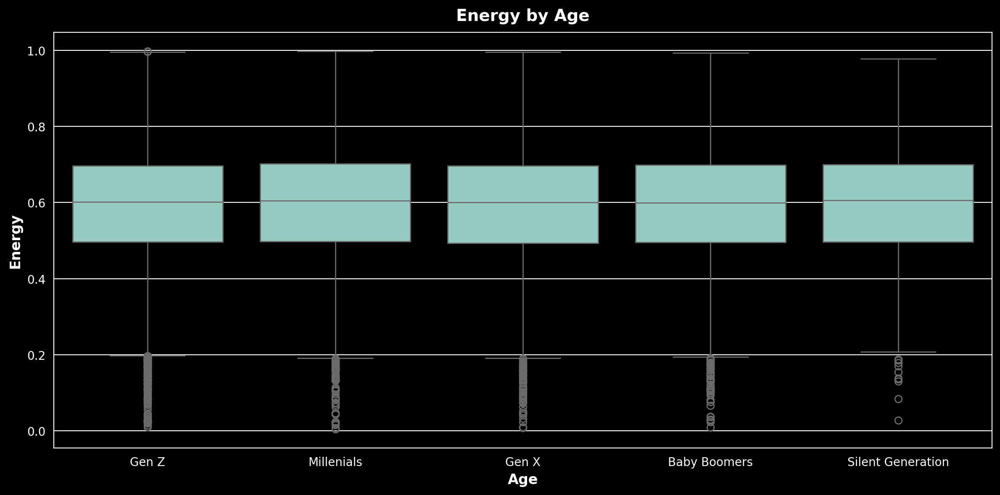

In [58]:
# Visualize energy across different age groups
plt.figure(figsize=(12, 6))
sns.boxplot(x="age_group", y="energy", data=df)
plt.title("Energy by Age")
plt.xlabel("Age")
plt.ylabel("Energy")
plt.show()

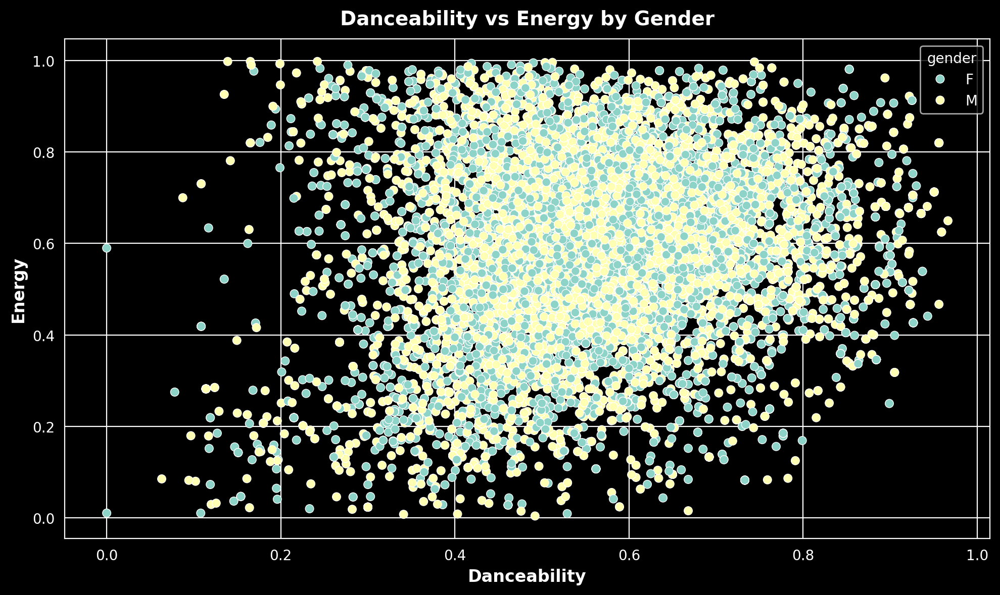

In [59]:
# Scatter plot to explore relationships between danceability and energy
plt.figure(figsize=(10, 6))
sns.scatterplot(x="danceability", y="energy", hue="gender", data=df)
plt.title("Danceability vs Energy by Gender")
plt.xlabel("Danceability")
plt.ylabel("Energy")
plt.show()

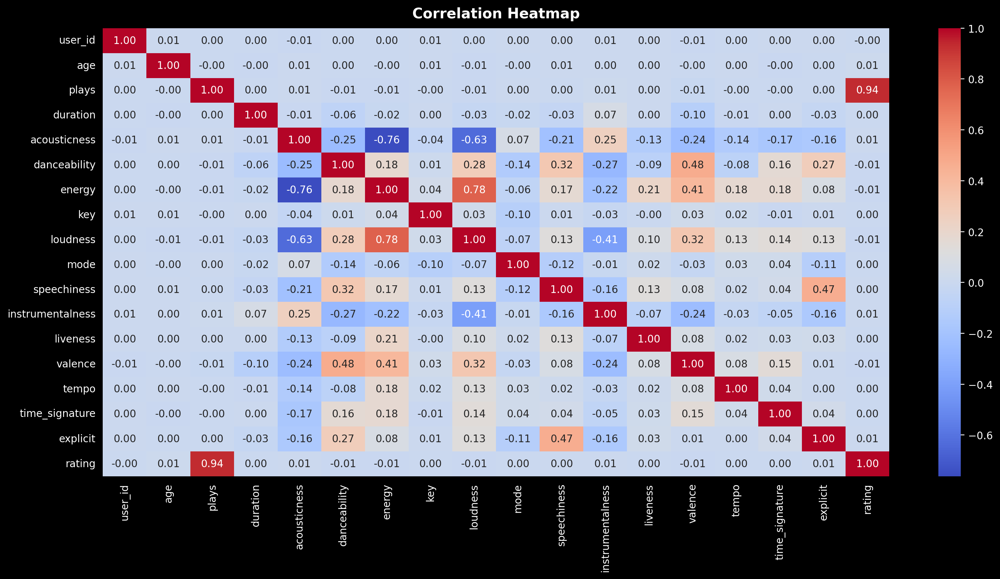

In [60]:
# Plot a correlation heatmap
plt.figure(figsize=(15, 8))
correlation_matrix = df.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()  # plots the correlation heatmap

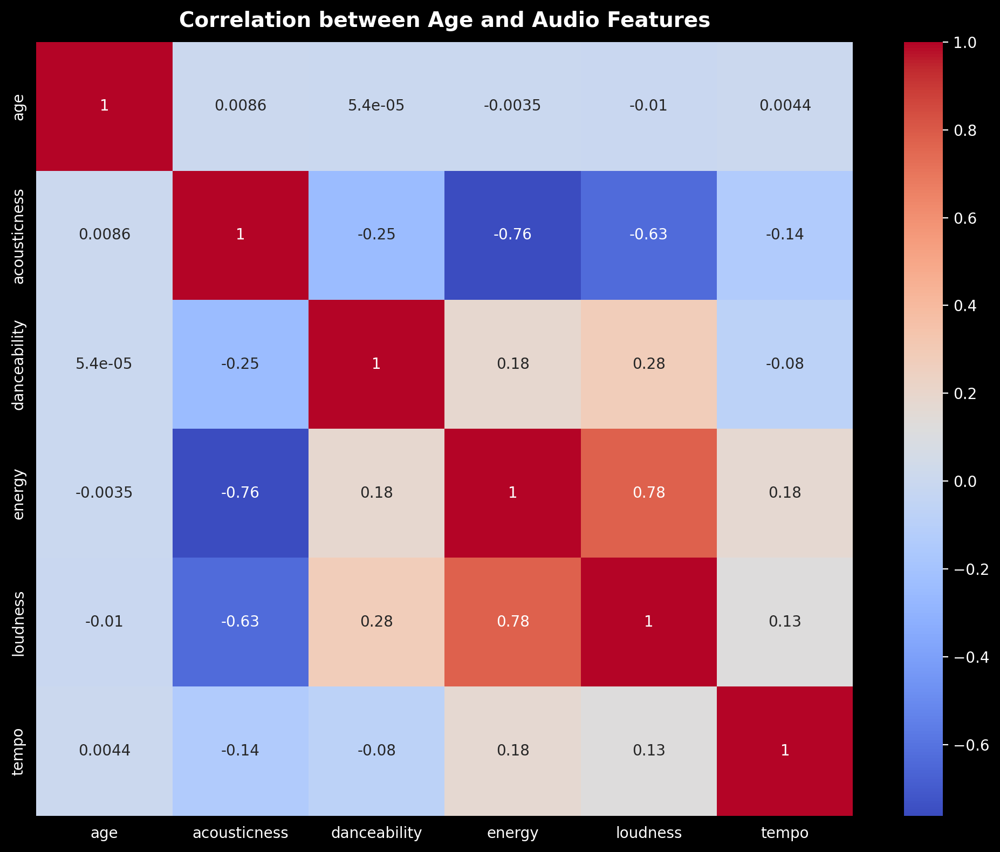

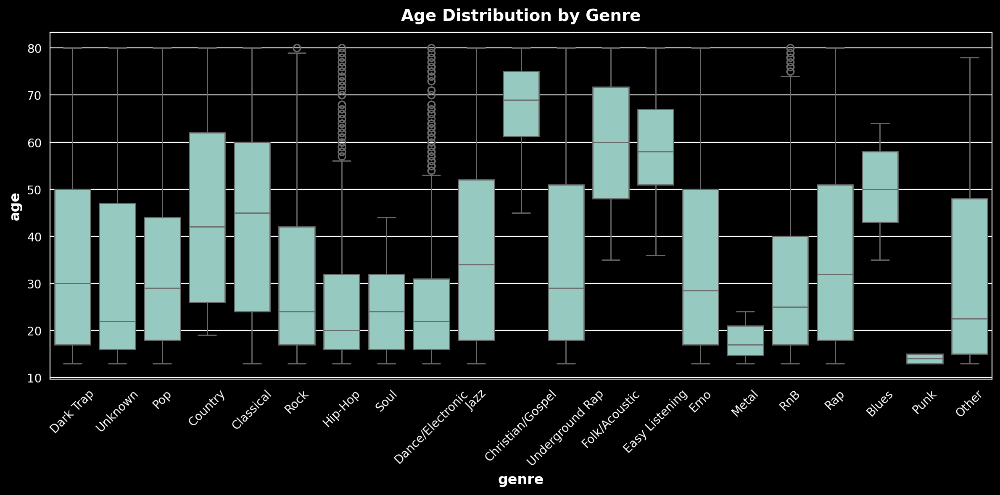

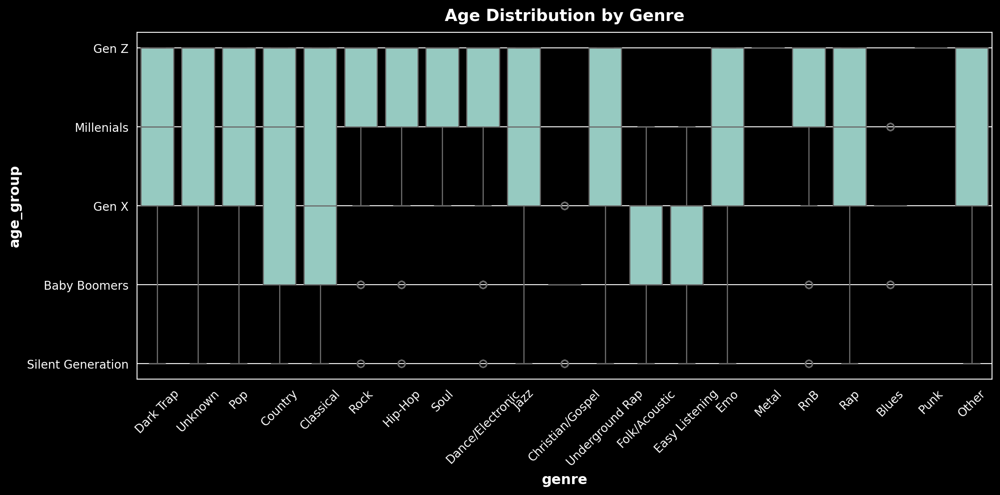

In [61]:
# Correlation between age and audio features
audio_features = ["acousticness", "danceability", "energy", "loudness", "tempo"]
correlation_matrix = df[["age"] + audio_features].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation between Age and Audio Features")
plt.show()

# Age vs Genre preferences
plt.figure(figsize=(12, 6))
sns.boxplot(x="genre", y="age", data=df)
plt.title("Age Distribution by Genre")
plt.xticks(rotation=45)
plt.show()

# Age group vs Genre preferences
plt.figure(figsize=(12, 6))
sns.boxplot(x="genre", y="age_group", data=df)
plt.title("Age Distribution by Genre")
plt.xticks(rotation=45)
plt.show()

## Gender-based preferences


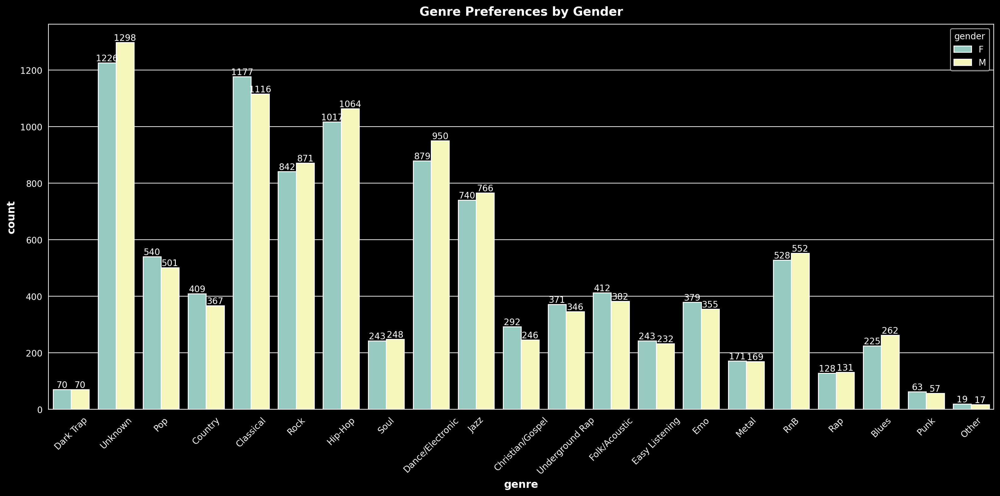

acousticness:
t-statistic = 0.960
p-value = 0.337
danceability:
t-statistic = -1.419
p-value = 0.156
energy:
t-statistic = -0.353
p-value = 0.724
loudness:
t-statistic = -0.467
p-value = 0.640
tempo:
t-statistic = -0.357
p-value = 0.721


In [62]:
# Gender vs Genre preferences
fig, ax = plt.subplots(figsize=(16, 8))
sns.countplot(x="genre", hue="gender", data=df, ax=ax)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.title("Genre Preferences by Gender")
plt.xticks(rotation=45)
plt.show()

# Gender vs Audio Features
for feature in audio_features:
    t_stat, p_value = stats.ttest_ind(
        df[df["gender"] == "M"][feature], df[df["gender"] == "F"][feature]
    )
    print(f"{feature}:\nt-statistic = {t_stat:.3f}\np-value = {p_value:.3f}\n{'='* 60}")

## Age and Explicit Content


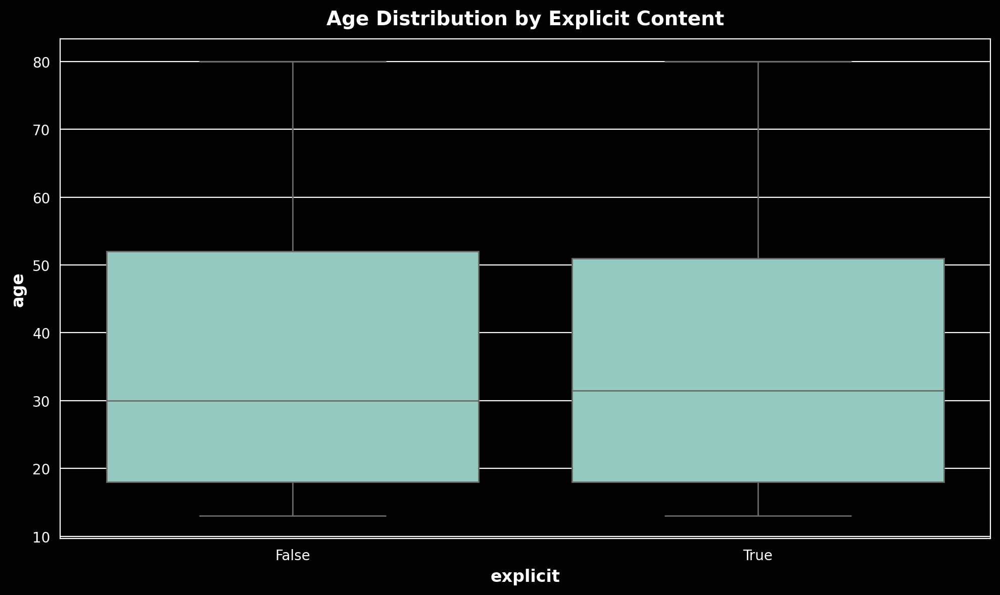

Chi-square statistic: 4.774535222086405
p-value: 0.311


In [63]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="explicit", y="age", data=df)
plt.title("Age Distribution by Explicit Content")
plt.show()

# Chi-square test
contingency_table = pd.crosstab(pd.cut(df["age"], bins=5), df["explicit"])
chi2, p_value, dof, expected = stats.chi2_contingency(contingency_table)
print(f"Chi-square statistic: {chi2}\np-value: {p_value:.3f}")

## Genre and audio features


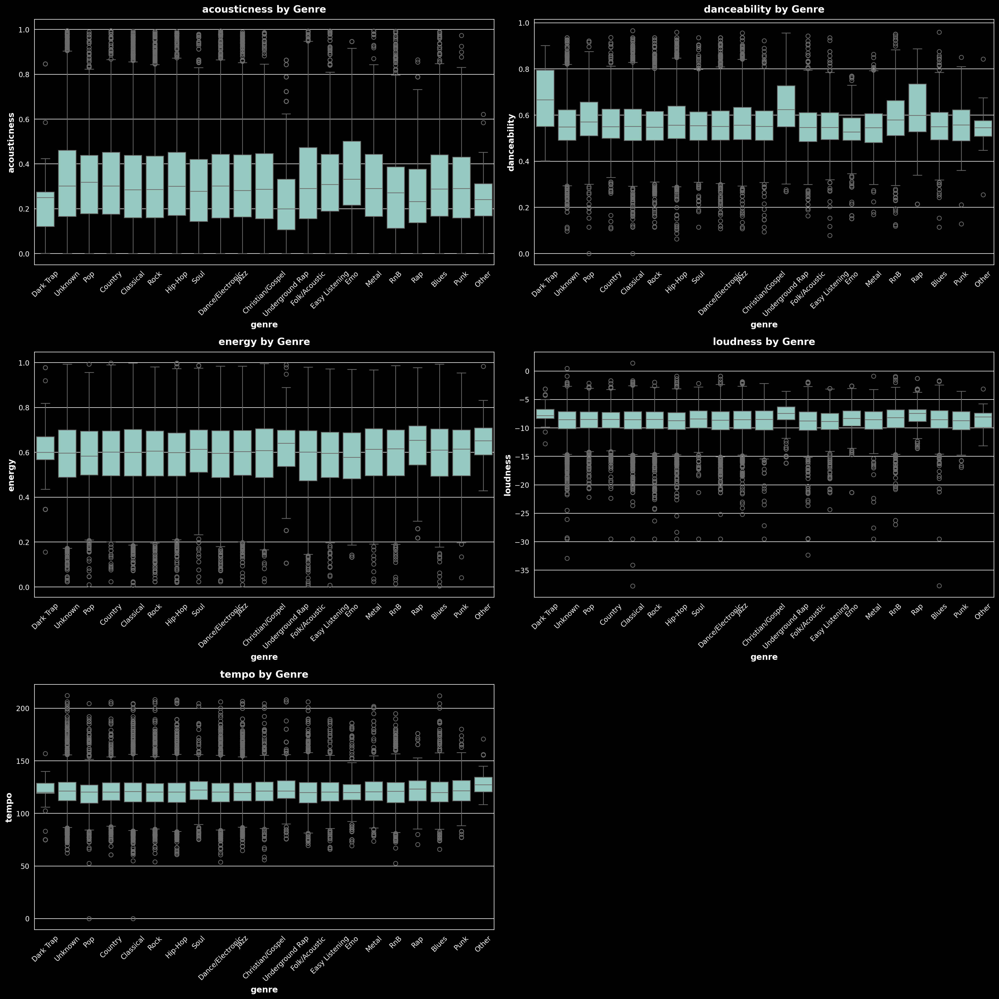

In [64]:
plt.figure(figsize=(20, 20))
for i, feature in enumerate(audio_features, 1):
    plt.subplot(3, 2, i)
    sns.boxplot(x="genre", y=feature, data=df)
    plt.title(f"{feature} by Genre")
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Fix inconsistencies with Date column


In [65]:
df["release_date"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 19974 entries, 0 to 19973
Series name: release_date
Non-Null Count  Dtype         
--------------  -----         
19974 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 156.2 KB


In [66]:
df["release_date"].isnull().sum()

0

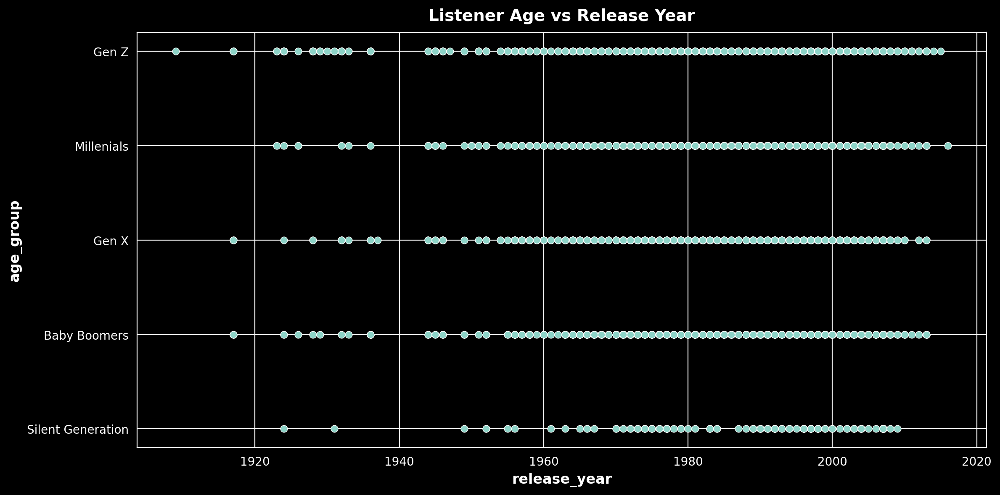

Correlation between age and release year: 0.002


In [67]:
# df["release_year"] = df["release_date"].dt.year
plt.figure(figsize=(12, 6))
sns.scatterplot(x="release_year", y="age_group", data=df)
plt.title("Listener Age vs Release Year")
plt.show()

correlation = df["age"].corr(df["release_year"])
print(f"Correlation between age and release year: {correlation:.3f}")

## Gender and artist preferences


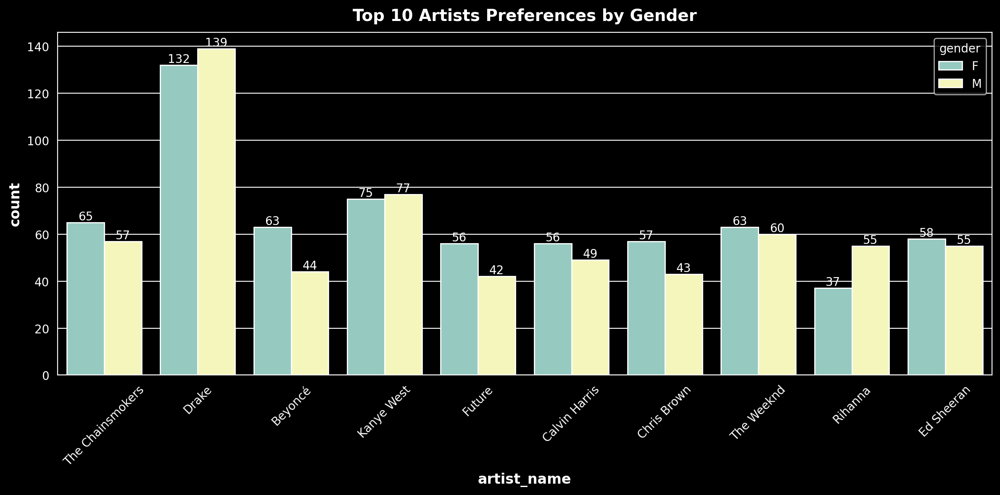

In [68]:
top_artists = df["artist_name"].value_counts().head(10).index
artist_gender_data = df[df["artist_name"].isin(top_artists)]

fig, ax = plt.subplots(figsize=(12, 6))
sns.countplot(x="artist_name", hue="gender", data=artist_gender_data)
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f")
plt.title("Top 10 Artists Preferences by Gender")
plt.xticks(rotation=45)
plt.show()

## Age and tempo preferences


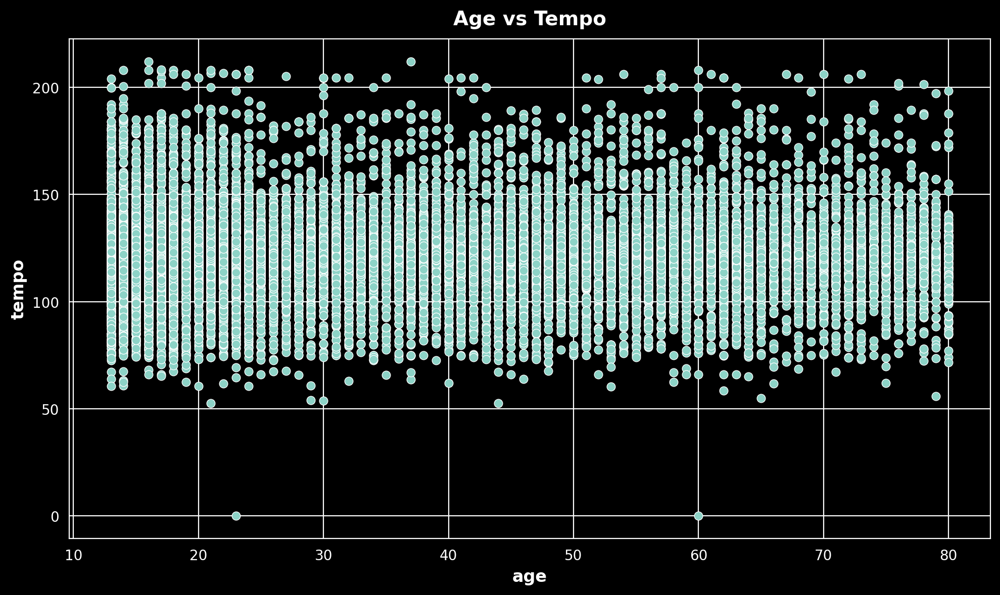

Correlation between age and tempo: 0.004


In [69]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x="age", y="tempo", data=df)
plt.title("Age vs Tempo")
plt.show()

correlation = df["age"].corr(df["tempo"])
print(f"Correlation between age and tempo: {correlation:.3f}")

## Gender and Danceability


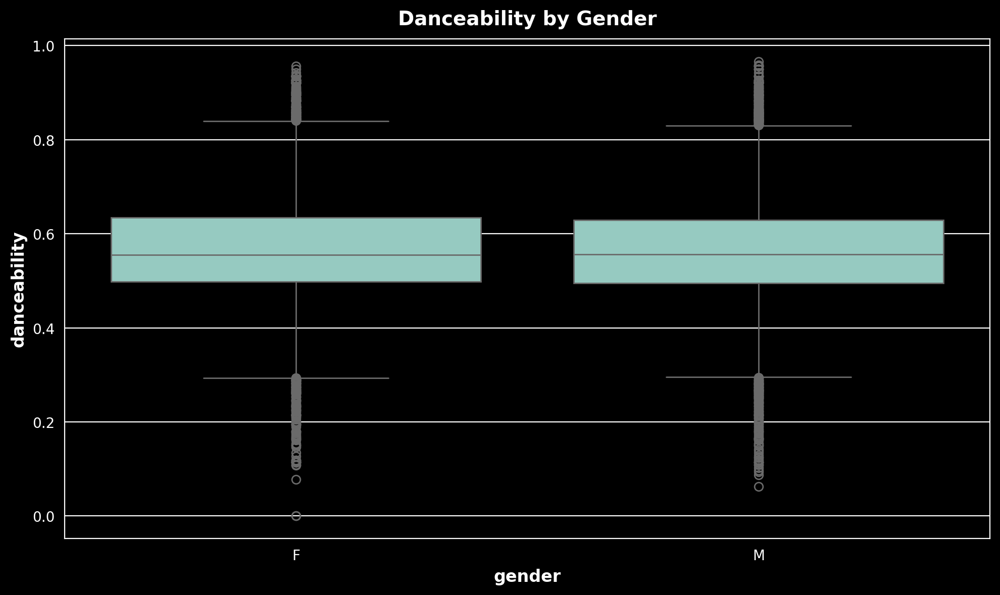

Danceability t-test:
t-statistic = -1.4190306678236608
p-value = 0.15590568087433074


In [70]:
plt.figure(figsize=(10, 6))
sns.boxplot(x="gender", y="danceability", data=df)
plt.title("Danceability by Gender")
plt.show()

t_stat, p_value = stats.ttest_ind(
    df[df["gender"] == "M"]["danceability"], df[df["gender"] == "F"]["danceability"]
)
print(f"Danceability t-test:\nt-statistic = {t_stat}\np-value = {p_value}")

# Machine Learning Prediction of User Preferences


In [4]:
df.to_csv("data/cleaned_modv2.csv", index=False)

NameError: name 'df' is not defined

In [2]:
df = pd.read_csv("data/cleaned_modv2.csv")

In [3]:
df.columns

Index(['user_id', 'age', 'gender', 'music', 'artist_name', 'featured_artists',
       'genre', 'plays', 'duration', 'music_id', 'id_artists', 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'explicit'],
      dtype='object')

In [5]:
df.describe(include="all")


,user_id,age,gender,music,artist_name,featured_artists,genre,plays,duration,music_id,...,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,explicit
count,19974.000000,19974.000000,19974,19974,19974,19974,19974,19974.000000,19974.000000,19974,...,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000,19974.000000
unique,NaN,NaN,2,9470,5085,8586,21,NaN,NaN,11528,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,M,Closer,Drake,none,Unknown,NaN,NaN,7BKLCZ1jbUBVqRi2FVlTVw,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,10000,49,271,10356,2524,NaN,NaN,33,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,49680.999149,35.925253,NaN,NaN,NaN,NaN,NaN,384.862972,3.876860,NaN,...,4.221338,-8.805136,0.729749,0.085706,0.156571,0.186839,0.477929,121.014846,3.944878,0.063282
std,28826.151359,19.890943,NaN,NaN,NaN,NaN,NaN,448.132209,0.971902,NaN,...,3.532629,2.959124,0.444101,0.072768,0.195605,0.099704,0.174655,18.954255,0.291084,0.243476
min,4.000000,13.000000,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,NaN,...,0.000000,-37.796000,0.000000,0.000000,0.000000,0.009360,0.000000,0.000000,0.000000,0.000000
25%,24543.250000,18.000000,NaN,NaN,NaN,NaN,NaN,1.000000,3.330000,NaN,...,1.000000,-10.082778,0.000000,0.043182,0.000445,0.126085,0.367500,111.692446,4.000000,0.000000
50%,49514.000000,30.000000,NaN,NaN,NaN,NaN,NaN,225.000000,3.750000,NaN,...,4.000000,-8.465000,1.000000,0.063075,0.100860,0.170092,0.464207,120.628039,4.000000,0.000000
75%,74545.750000,52.000000,NaN,NaN,NaN,NaN,NaN,660.000000,4.280000,NaN,...,7.000000,-7.064333,1.000000,0.096595,0.229892,0.215405,0.579846,129.374425,4.000000,0.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19974 entries, 0 to 19973
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   user_id           19974 non-null  int64  
 1   age               19974 non-null  int64  
 2   gender            19974 non-null  object 
 3   music             19974 non-null  object 
 4   artist_name       19974 non-null  object 
 5   featured_artists  19974 non-null  object 
 6   genre             19974 non-null  object 
 7   plays             19974 non-null  int64  
 8   duration          19974 non-null  float64
 9   music_id          19974 non-null  object 
 10  id_artists        19974 non-null  object 
 11  acousticness      19974 non-null  float64
 12  danceability      19974 non-null  float64
 13  energy            19974 non-null  float64
 14  key               19974 non-null  float64
 15  loudness          19974 non-null  float64
 16  mode              19974 non-null  float6

In [7]:
# df.drop(["release_date", "release_year","rating", "age_group"], axis=1, inplace=True)

In [8]:
df['featured_artists'].isna().sum()

0

In [9]:
# fill missing values with "none"
df['featured_artists'].fillna("none", inplace=True)

/tmp/ipykernel_1283/2412660432.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['featured_artists'].fillna("none", inplace=True)


In [13]:
df.head()

,user_id,age,gender,music,artist_name,featured_artists,genre,plays,duration,music_id,...,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,time_signature,explicit
0,83811,16,F,Bank Account,21 Savage,"Birdy, Zoé",Dark Trap,11,3.67,2fQrGHiQOvpL9UgPvtYy6G,...,8.0,-8.228000,0.0,0.351000,0.000007,0.087100,0.376000,75.016000,4.0,1.0
1,83811,16,F,Little Talks,Of Monsters and Men,"Ninho, Snoop Dogg, Russ, Paramore",Unknown,686,4.44,2ihCaVdNZmnHZWt0fvAM7B,...,1.0,-7.879000,1.0,0.032200,0.000000,0.284500,0.413000,101.890500,4.0,0.0
2,13397,17,M,Wherever I Go,OneRepublic,"Keith Urban, DJ Khaled, NIKI, MF DOOM",Unknown,136,2.83,46jLy47W8rkf8rEX04gMKB,...,0.0,-7.344833,1.0,0.089400,0.043432,0.273133,0.404183,120.850500,4.0,0.0
3,70645,44,M,No New Friends,DJ Khaled,"The xx, LIT killah",Pop,230,5.14,5oVlbbiKGdGeZkWCFy0mqk,...,1.0,-7.606000,1.0,0.167000,0.000000,0.096600,0.400000,109.283000,4.0,0.0
4,70645,44,M,Dreams,Campsite Dream,none,Country,391,3.20,1SNoSoQ3JZldOhzBY9gw0n,...,0.0,-9.894632,1.0,0.078837,0.235527,0.180354,0.380815,120.488479,4.0,0.0


In [10]:
# df['featured_artists'].isna().sum()
# check_missing_value()

# Tensorflow recommenders


In [12]:
import tensorflow as tf
import tensorflow_recommenders as tfrs

# import tensorflow_recommenders_addons as tfra
TF_ENABLE_ONEDNN_OPTS = 0

In [34]:
# Ensure all columns have consistent df types
df["user_id"] = df["user_id"].astype(str)
df["music_id"] = df["music_id"].astype(str)
df["music"] = df["music"].astype(str)
df["age"] = df["age"].astype(int)
df["gender"] = df["gender"].astype(str)
# df["age_group"] = df["age_group"].astype(str)
df["plays"] = df["plays"].astype(int)
df["duration"] = df["duration"].astype(float)
df["acousticness"] = df["acousticness"].astype(float)
df["danceability"] = df["danceability"].astype(float)
df["energy"] = df["energy"].astype(float)
df["key"] = df["key"].astype(float)
df["loudness"] = df["loudness"].astype(float)
df["mode"] = df["mode"].astype(float)
df["speechiness"] = df["speechiness"].astype(float)
df["instrumentalness"] = df["instrumentalness"].astype(float)
df["liveness"] = df["liveness"].astype(float)
df["valence"] = df["valence"].astype(float)
df["tempo"] = df["tempo"].astype(float)
df["time_signature"] = df["time_signature"].astype(float)
df["explicit"] = df["explicit"].astype(float)
# df["rating"] = df["rating"].astype(float)
# df["release_year"] = df["release_year"].astype(int)
# df['release_year'] = df['release_year'].astype(int)

In [85]:
check_missing_value()

,Feature,Missing Values


In [82]:
df.columns

Index(['user_id', 'age', 'gender', 'music', 'artist_name', 'featured_artists',
       'genre', 'plays', 'duration', 'music_id', 'id_artists', 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'explicit', 'rating', 'age_group'],
      dtype='object')

## version1.0


In [24]:
def df_to_dataset(dataframe, shuffle=True):
    dataframe = dataframe.copy()
    ds = tf.data.Dataset.from_tensor_slices((dict(dataframe)))
    return ds


# Convert DataFrame to TensorFlow dataset
dataset = df_to_dataset(df)

# Set seed for reproducibility
tf.random.set_seed(42)

dataset_size = tf.data.experimental.cardinality(dataset)
print(f"Estimated dataset size: {dataset_size.numpy()}")

# Shuffle the dataset with a buffer size of 1000
shuffled_dataset = dataset.shuffle(
    buffer_size=len(df), seed=42, reshuffle_each_iteration=False
)

# Split the shuffled dataset (adjust the split ratio as needed)
train_size = int(0.8 * len(df))
train_dataset = shuffled_dataset.take(train_size)
test_dataset = shuffled_dataset.skip(train_size)
print(
    f"Estimated train size: {train_size}\nEstimated test dataset size: {len(df) - train_size}"
)

# # Print dataset shapes for debugging
# print("Train dataset shapes:")
# for batch in cached_train.take(10):
#   for key, value in batch.items():
#     print(f"{key}: {tf.shape(value)}")

# print("Test dataset shapes:")
# for batch in cached_test.take(10):
#   for key, value in batch.items():
#     print(f"{key}: {tf.shape(value)}")

Estimated dataset size: 19974
Estimated train size: 15979
Estimated test dataset size: 3995


In [25]:
import pprint


for example in test_dataset.take(1):
    pprint.pprint(example)

{'acousticness': <tf.Tensor: shape=(), dtype=float64, numpy=0.7808584615384615>,
 'age': <tf.Tensor: shape=(), dtype=int64, numpy=58>,
 'artist_name': <tf.Tensor: shape=(), dtype=string, numpy=b'Billie Holiday'>,
 'danceability': <tf.Tensor: shape=(), dtype=float64, numpy=0.49>,
 'duration': <tf.Tensor: shape=(), dtype=float64, numpy=3.1>,
 'energy': <tf.Tensor: shape=(), dtype=float64, numpy=0.2513807692307692>,
 'explicit': <tf.Tensor: shape=(), dtype=float64, numpy=0.0>,
 'featured_artists': <tf.Tensor: shape=(), dtype=string, numpy=b'none'>,
 'gender': <tf.Tensor: shape=(), dtype=string, numpy=b'F'>,
 'genre': <tf.Tensor: shape=(), dtype=string, numpy=b'Easy Listening'>,
 'id_artists': <tf.Tensor: shape=(), dtype=string, numpy=b'spotify:artist:1YzCsTRb22dQkh9lghPIrp'>,
 'instrumentalness': <tf.Tensor: shape=(), dtype=float64, numpy=0.2630119126923076>,
 'key': <tf.Tensor: shape=(), dtype=float64, numpy=5.0>,
 'liveness': <tf.Tensor: shape=(), dtype=float64, numpy=0.1980807692307692

In [100]:
df.columns

Index(['user_id', 'age', 'gender', 'music', 'artist_name', 'featured_artists',
       'genre', 'plays', 'duration', 'music_id', 'id_artists', 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'explicit', 'rating', 'age_group'],
      dtype='object')

In [102]:
# Define embedding dimensions
embedding_dimension = 128

# Extract unique values for lookup layers and ensure no duplicates
unique_user_ids = df["user_id"].astype(str).unique().tolist()
unique_ages = df["age"].unique().tolist()
unique_genders = df["gender"].unique().tolist()
# unique_song_ids = df["music_id"].unique().tolist()
unique_music = df["music"].unique().tolist()
unique_genres = df["genre"].unique().tolist()
unique_artist_names = df["artist_name"].unique().tolist()
unique_age_groups = df["age_group"].unique().tolist()


# Define user model
class UserModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.user_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(
                    vocabulary=unique_user_ids, mask_token=None
                ),
                tf.keras.layers.Embedding(
                    len(unique_user_ids) + 1, embedding_dimension
                ),
            ]
        )
        self.age_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.IntegerLookup(vocabulary=unique_ages, mask_token=None),
                tf.keras.layers.Embedding(len(unique_ages) + 1, embedding_dimension),
            ]
        )
        self.gender_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(
                    vocabulary=unique_genders, mask_token=None
                ),
                tf.keras.layers.Embedding(len(unique_genders) + 1, embedding_dimension),
            ]
        )
        self.age_group_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(
                    vocabulary=unique_age_groups, mask_token=None
                ),
                tf.keras.layers.Embedding(
                    len(unique_age_groups) + 1, embedding_dimension
                ),
            ]
        )

    def call(self, inputs):
        return tf.concat(
            [
                self.user_embedding(inputs["user_id"]),
                self.age_embedding(inputs["age"]),
                self.gender_embedding(inputs["gender"]),
                self.age_group_embedding(inputs["age_group"]),
            ],
            axis=1,
        )


# Define item model with audio features
class ItemModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.song_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
                tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),
            ]
        )
        self.genre_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(vocabulary=unique_genres, mask_token=None),
                tf.keras.layers.Embedding(len(unique_genres) + 1, embedding_dimension),
            ]
        )
        self.artist_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(
                    vocabulary=unique_artist_names, mask_token=None
                ),
                tf.keras.layers.Embedding(
                    len(unique_artist_names) + 1, embedding_dimension
                ),
            ]
        )
        self.audio_features = tf.keras.layers.Dense(embedding_dimension)

    def call(self, inputs):
        song_embedding = self.song_embedding(inputs["music"])
        genre_embedding = self.genre_embedding(inputs["genre"])
        artist_embedding = self.artist_embedding(inputs["artist_name"])

        audio_features = tf.stack(
            [
                inputs["acousticness"],
                inputs["danceability"],
                inputs["energy"],
                inputs["key"],
                inputs["loudness"],
                inputs["mode"],
                inputs["speechiness"],
                inputs["instrumentalness"],
                inputs["liveness"],
                inputs["valence"],
                inputs["tempo"],
                inputs["time_signature"],
            ],
            axis=1,
        )

        # Print shapes for debugging
        print(f"Audio features shape before Dense layer: {audio_features.shape}")
        audio_features = self.audio_features(audio_features)

        return tf.concat(
            [song_embedding, genre_embedding, artist_embedding, audio_features],
            axis=1,
            # [song_embedding, genre_embedding, artist_embedding], axis=1
        )


# Define the multitask model
class MultitaskModel(tfrs.models.Model):
    def __init__(self, user_model, item_model, candidates):
        super().__init__()
        self.user_model = user_model
        self.item_model = item_model
        self.retrieval_task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(candidates=candidates)
        )
        self.plays_prediction_task = tf.keras.Sequential(
            [tf.keras.layers.Dense(128, activation="relu"), tf.keras.layers.Dense(1)]
        )
        self.plays_loss = tf.keras.losses.MeanSquaredError()

    def enumerate_rows(self, batch):
        if tf.shape(batch)[0] == 0:
            # Handle empty batch (e.g., return default values or skip processing)
            return None

    def call(self, features):
        user_embeddings = self.user_model(features)
        item_embeddings = self.item_model(features)
        return user_embeddings, item_embeddings

    def compute_loss(self, features, training=False):
        user_embeddings, item_embeddings = self(features)
        retrieval_loss = self.retrieval_task(
            user_embeddings, item_embeddings, compute_metrics=not training
        )
        plays_predictions = self.plays_prediction_task(
            tf.concat([user_embeddings, item_embeddings], axis=1)
        )
        plays_loss = self.plays_loss(features["plays"], plays_predictions)
        return retrieval_loss + plays_loss


# Check if candidates are not empty
candidates = train_dataset.map(lambda x: x["music"])
for candidate in candidates.take(1):
    print(f"Candidate sample: {candidate.numpy()}")

# Ensure candidates are correctly mapped
if not list(candidates):
    raise ValueError(
        "Candidates set is empty. Ensure 'music' is correctly mapped from the dataset."
    )

# Instantiate models
user_model = UserModel()
item_model = ItemModel()
model = MultitaskModel(user_model, item_model, candidates)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001))

# Cache datasets for performance
batch_size = 1024  # Adjust as needed

cached_train = train_dataset.batch(batch_size).cache().prefetch(tf.data.AUTOTUNE)
cached_test = test_dataset.batch(batch_size).cache().prefetch(tf.data.AUTOTUNE)

# Print dataset shapes for debugging
print("Train dataset shapes:")
for batch in cached_train.take(1):
    for key, value in batch.items():
        print(f"{key}: {tf.shape(value)}")

print("Test dataset shapes:")
for batch in cached_test.take(1):
    for key, value in batch.items():
        print(f"{key}: {tf.shape(value)}")

# Fit the model
try:
    model.fit(cached_train, epochs=10)
except Exception as e:
    print(f"Error during model fitting: {e}")

# Evaluate the model
try:
    model.evaluate(cached_test, return_dict=True)
except Exception as e:
    print(f"Error during model evaluation: {e}")

Candidate sample: b'Thriller'
Train dataset shapes:
user_id: [1024]
age: [1024]
gender: [1024]
music: [1024]
artist_name: [1024]
featured_artists: [1024]
genre: [1024]
plays: [1024]
duration: [1024]
music_id: [1024]
id_artists: [1024]
acousticness: [1024]
danceability: [1024]
energy: [1024]
key: [1024]
loudness: [1024]
mode: [1024]
speechiness: [1024]
instrumentalness: [1024]
liveness: [1024]
valence: [1024]
tempo: [1024]
time_signature: [1024]
explicit: [1024]
rating: [1024]
age_group: [1024]
Test dataset shapes:


2024-10-01 14:55:51.463775: W tensorflow/core/kernels/data/cache_dataset_ops.cc:858] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


user_id: [1024]
age: [1024]
gender: [1024]
music: [1024]
artist_name: [1024]
featured_artists: [1024]
genre: [1024]
plays: [1024]
duration: [1024]
music_id: [1024]
id_artists: [1024]
acousticness: [1024]
danceability: [1024]
energy: [1024]
key: [1024]
loudness: [1024]
mode: [1024]
speechiness: [1024]
instrumentalness: [1024]
liveness: [1024]
valence: [1024]
tempo: [1024]
time_signature: [1024]
explicit: [1024]
rating: [1024]
age_group: [1024]
Epoch 1/10


2024-10-01 14:55:51.773079: W tensorflow/core/kernels/data/cache_dataset_ops.cc:858] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


Audio features shape before Dense layer: (None, 12)
Audio features shape before Dense layer: (None, 12)
16/16 [==============================] - 2s 44ms/step - factorized_top_k/top_1_categorical_accuracy: 0.0000e+00 - factorized_top_k/top_5_categorical_accuracy: 0.0000e+00 - factorized_top_k/top_10_categorical_accuracy: 0.0000e+00 - factorized_top_k/top_50_categorical_accuracy: 0.0000e+00 - factorized_top_k/top_100_categorical_accuracy: 0.0000e+00 - loss: 350710.6673 - regularization_loss: 0.0000e+00 - total_loss: 350710.6673
Epoch 2/10
16/16 [==============================] - 1s 38ms/step - factorized_top_k/top_1_categorical_accuracy: 0.0000e+00 - factorized_top_k/top_5_categorical_accuracy: 0.0000e+00 - factorized_top_k/top_10_categorical_accuracy: 0.0000e+00 - factorized_top_k/top_50_categorical_accuracy: 0.0000e+00 - factorized_top_k/top_100_categorical_accuracy: 0.0000e+00 - loss: 337765.4540 - regularization_loss: 0.0000e+00 - total_loss: 337765.4540
Epoch 3/10
16/16 [===========

In [28]:
# import tensorflow as tf
# import tensorflow_recommenders as tfrs

# Define embedding dimensions
embedding_dimension = 128

# Extract unique values for lookup layers and ensure no duplicates
unique_user_ids = df["user_id"].astype(str).unique().tolist()
# unique_ages = df["age"].unique().tolist()
unique_genders = df["gender"].unique().tolist()
unique_music = df["music"].unique().tolist()
unique_genres = df["genre"].unique().tolist()
unique_artist_names = df["artist_name"].unique().tolist()
# unique_age_groups = df["age_group"].unique().tolist()


# Define user model
class UserModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.user_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(
                    vocabulary=unique_user_ids, mask_token=None
                ),
                tf.keras.layers.Embedding(
                    len(unique_user_ids) + 1, embedding_dimension
                ),
            ]
        )
        self.age_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.IntegerLookup(vocabulary=unique_ages, mask_token=None),
                tf.keras.layers.Embedding(len(unique_ages) + 1, embedding_dimension),
            ]
        )
        self.gender_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(
                    vocabulary=unique_genders, mask_token=None
                ),
                tf.keras.layers.Embedding(len(unique_genders) + 1, embedding_dimension),
            ]
        )
        # self.age_group_embedding = tf.keras.Sequential(
        #     [
        #         tf.keras.layers.StringLookup(
        #             vocabulary=unique_age_groups, mask_token=None
        #         ),
        #         tf.keras.layers.Embedding(
        #             len(unique_age_groups) + 1, embedding_dimension
        #         ),
        #     ]
        # )

    def call(self, inputs):
        return tf.concat(
            [
                self.user_embedding(inputs["user_id"]),
                self.age_embedding(inputs["age"]),
                self.gender_embedding(inputs["gender"]),
                # self.age_group_embedding(inputs["age_group"]),
            ],
            axis=1,
        )


# Define item model with audio features
class ItemModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.song_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
                tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),
            ]
        )
        self.genre_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(vocabulary=unique_genres, mask_token=None),
                tf.keras.layers.Embedding(len(unique_genres) + 1, embedding_dimension),
            ]
        )
        self.artist_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.StringLookup(
                    vocabulary=unique_artist_names, mask_token=None
                ),
                tf.keras.layers.Embedding(
                    len(unique_artist_names) + 1, embedding_dimension
                ),
            ]
        )
        self.audio_features = tf.keras.layers.Dense(embedding_dimension)

    def call(self, inputs):
        song_embedding = self.song_embedding(inputs["music"])
        genre_embedding = self.genre_embedding(inputs["genre"])
        artist_embedding = self.artist_embedding(inputs["artist_name"])

        audio_features = tf.stack(
            [
                inputs["acousticness"],
                inputs["danceability"],
                inputs["energy"],
                inputs["key"],
                inputs["loudness"],
                inputs["mode"],
                inputs["speechiness"],
                inputs["instrumentalness"],
                inputs["liveness"],
                inputs["valence"],
                inputs["tempo"],
                inputs["time_signature"],
            ],
            axis=1,
        )

        print(f"Audio features shape before Dense layer: {audio_features.shape}")

        audio_features = self.audio_features(audio_features)

        return tf.concat(
            [song_embedding, genre_embedding, artist_embedding, audio_features],
            axis=1,
        )


# Define the multitask model
class MultitaskModel(tfrs.models.Model):
    def __init__(self, user_model, item_model, candidates):
        super().__init__()
        self.user_model = user_model
        self.item_model = item_model
        self.retrieval_task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(candidates=candidates)
        )
        self.plays_prediction_task = tf.keras.Sequential(
            [tf.keras.layers.Dense(128, activation="relu"), tf.keras.layers.Dense(1)]
        )
        self.plays_loss = tf.keras.losses.MeanSquaredError()

    def enumerate_rows(self, batch):
        if tf.shape(batch)[0] == 0:
            return None

    def call(self, features):
        user_embeddings = self.user_model(features)
        item_embeddings = self.item_model(features)
        return user_embeddings, item_embeddings

    # def compute_loss(self, features, training=False):
    #     user_embeddings, item_embeddings = self(features)
    #     retrieval_loss = self.retrieval_task(
    #         user_embeddings, item_embeddings, compute_metrics=not training
    #     )
    #     plays_predictions = self.plays_prediction_task(
    #         tf.concat([user_embeddings, item_embeddings], axis=1)
    #     )
    #     plays_loss = self.plays_loss(features["plays"], plays_predictions)
    #     return retrieval_loss + plays_loss

    def compute_loss(self, features, training=False):
        user_embeddings, item_embeddings = self(features)
        
        # Print shapes for debugging
        print(f"user_embeddings shape: {user_embeddings.shape}")
        print(f"item_embeddings shape: {item_embeddings.shape}")
        
        retrieval_loss = self.retrieval_task(
            user_embeddings, item_embeddings, compute_metrics=not training
        )
        plays_predictions = self.plays_prediction_task(
            tf.concat([user_embeddings, item_embeddings], axis=1)
        )
        plays_loss = self.plays_loss(features["plays"], plays_predictions)
        return retrieval_loss + plays_loss
# Check if candidates are not empty
candidates = train_dataset.map(lambda x: x["music"])
for candidate in candidates.take(1):
    print(f"Candidate sample: {candidate.numpy()}")

if not list(candidates):
    raise ValueError(
        "Candidates set is empty. Ensure 'music' is correctly mapped from the dataset."
    )

# Instantiate models
user_model = UserModel()
item_model = ItemModel()
model = MultitaskModel(user_model, item_model, candidates)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.AdamW(learning_rate=0.0001))

# Cache datasets for performance
batch_size = 1024

cached_train = train_dataset.batch(batch_size).cache().prefetch(tf.data.AUTOTUNE)
cached_test = test_dataset.batch(batch_size).cache().prefetch(tf.data.AUTOTUNE)
# dataset.take(k).cache().repeat()
print("Train dataset shapes:")
for batch in cached_train.take(1):
    for key, value in batch.items():
        print(f"{key}: {tf.shape(value)}")

print("Test dataset shapes:")
for batch in cached_test.take(1):
    for key, value in batch.items():
        print(f"{key}: {tf.shape(value)}")

# Fit the model
try:
    model.fit(cached_train, epochs=10)
except Exception as e:
    print(f"Error during model fitting: {e}")

# Evaluate the model
try:
    model.evaluate(cached_test, return_dict=True)
except Exception as e:
    print(f"Error during model evaluation: {e}")

Candidate sample: b'Thriller'
Train dataset shapes:
user_id: [1024]
age: [1024]
gender: [1024]
music: [1024]
artist_name: [1024]
featured_artists: [1024]
genre: [1024]
plays: [1024]
duration: [1024]
music_id: [1024]
id_artists: [1024]
acousticness: [1024]
danceability: [1024]
energy: [1024]
key: [1024]
loudness: [1024]
mode: [1024]
speechiness: [1024]
instrumentalness: [1024]
liveness: [1024]
valence: [1024]
tempo: [1024]
time_signature: [1024]
explicit: [1024]
Test dataset shapes:


2024-10-11 16:08:49.663250: W tensorflow/core/kernels/data/cache_dataset_ops.cc:858] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


user_id: [1024]
age: [1024]
gender: [1024]
music: [1024]
artist_name: [1024]
featured_artists: [1024]
genre: [1024]
plays: [1024]
duration: [1024]
music_id: [1024]
id_artists: [1024]
acousticness: [1024]
danceability: [1024]
energy: [1024]
key: [1024]
loudness: [1024]
mode: [1024]
speechiness: [1024]
instrumentalness: [1024]
liveness: [1024]
valence: [1024]
tempo: [1024]
time_signature: [1024]
explicit: [1024]
Epoch 1/10


2024-10-11 16:08:49.991699: W tensorflow/core/kernels/data/cache_dataset_ops.cc:858] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


Audio features shape before Dense layer: (None, 12)
user_embeddings shape: (None, 384)
item_embeddings shape: (None, 512)
Error during model fitting: in user code:

    File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/tensorflow_recommenders/models/base.py", line 68, in train_step
        loss = self.compute_loss(inputs, training=True)
    File "/tmp/ipykernel_1283/3341285172.py", line 170, in compute_loss
        retrieval_loss = self.retrieval_t

In [92]:
import tensorflow_recommenders as tfrs
import tensorflow as tf
import numpy as np


class MultiTaskModel(tfrs.Model):
    def __init__(self, num_users, num_songs, num_genres, embedding_dim):
        super(MultiTaskModel, self).__init__()

        # User embeddings
        self.user_age_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_users, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )
        self.user_gender_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_users, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )
        self.user_music_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_users, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )

        # Song embeddings
        self.song_artist_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_songs, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )
        self.song_featured_artists_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_songs, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )
        self.song_genre_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_genres, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )

        # Audio feature embeddings
        self.audio_feature_embeddings = tf.keras.Sequential(
            [tf.keras.layers.Dense(embedding_dim, activation="relu")]
        )

        # Interaction head
        self.interaction_head = tf.keras.Sequential(
            [tf.keras.layers.Dense(64, activation="relu"), tf.keras.layers.Dense(1)]
        )

        # Recommendation head
        self.recommendation_head = tf.keras.Sequential(
            [
                tf.keras.layers.Dense(64, activation="relu"),
                tf.keras.layers.Dense(num_songs),
            ]
        )

    def call(
        self,
        user_features,
        song_features=None,
        audio_features=None,
        interaction_features=None,
    ):
        user_age_embedding = self.user_age_embedding(user_features[:, 0])
        user_gender_embedding = self.user_gender_embedding(user_features[:, 1])
        user_music_embedding = self.user_music_embedding(user_features[:, 2])

        song_artist_embedding = self.song_artist_embedding(song_features[:, 0])
        song_featured_artists_embedding = self.song_featured_artists_embedding(
            song_features[:, 1]
        )
        song_genre_embedding = self.song_genre_embedding(song_features[:, 2])

        audio_feature_embedding = self.audio_feature_embeddings(audio_features)

        # Concatenate user and song embeddings
        user_song_embedding = tf.concat(
            [
                user_age_embedding,
                user_gender_embedding,
                user_music_embedding,
                song_artist_embedding,
                song_featured_artists_embedding,
                song_genre_embedding,
                audio_feature_embedding,
            ],
            axis=1,
        )

        # Interaction prediction
        interaction_scores = self.interaction_head(user_song_embedding)

        # Recommendation
        recommendation_scores = self.recommendation_head(user_song_embedding)

        return interaction_scores, recommendation_scores


# Create a sample dataset
users = df[["user_id", "age", "gender", "music"]].values
songs = df[["artist_name", "featured_artists", "genre"]].values
audio_features = df[
    [
        "acousticness",
        "danceability",
        "energy",
        "key",
        "loudness",
        "mode",
        "speechiness",
        "instrumentalness",
        "liveness",
        "valence",
        "tempo",
        "time_signature",
    ]
].values
interactions = df["plays"].values.reshape(-1, 1)
# Create interaction labels (1 if plays > 0, otherwise 0)
interaction_labels = df["plays"].apply(lambda x: 1 if x > 0 else 0).values

# Split data into training and testing sets
train_data, test_data = np.split(df, [int(0.8 * len(df))])

# Get the held-out songs for each user
held_out_songs = (
    test_data.groupby("user_id")["music_id"].apply(lambda x: x.sample(1)).reset_index()
)

# Create recommendation labels (1 if the song is the held-out song, otherwise 0)
recommendation_labels = []
for index, row in held_out_songs.iterrows():
    user_id = row["user_id"]
    held_out_song = row["music_id"]

    # Get all songs played by the user
    user_songs = df[df["user_id"] == user_id]["music_id"]

    # Create a list of labels for the user's songs
    labels = [1 if song == held_out_song else 0 for song in user_songs]

    recommendation_labels.extend(labels)

recommendation_labels = np.array(recommendation_labels)

# Get the number of unique genres, users and songs
genres = df["genre"].nunique()
users = df["user_id"].nunique()
songs = df["music_id"].nunique()

# Initialize the multi-task model
model = MultiTaskModel(users, songs, genres, 64)

# Compile the model
model.compile(
    optimizer="adam",
    loss=["binary_crossentropy", "categorical_crossentropy"],
    metrics=["accuracy"],
)

# Train the model
model.fit(
    x={
        "user_features": users,
        "song_features": songs,
        "audio_features": audio_features,
    },
    y=[interaction_labels, recommendation_labels],
    epochs=10,
)

/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


ValueError: Failed to find data adapter that can handle input: (<class 'dict'> containing {"<class 'str'>"} keys and {"<class 'numpy.ndarray'>", "<class 'int'>"} values), (<class 'list'> containing values of types {"<class 'numpy.ndarray'>"})

In [97]:
import tensorflow_recommenders as tfrs
import tensorflow as tf
import numpy as np


class MultiTaskModel(tfrs.Model):
    def __init__(self, num_users, num_songs, num_genres, embedding_dim):
        super(MultiTaskModel, self).__init__()

        # User embeddings
        self.user_age_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_users, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )
        self.user_gender_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_users, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )
        self.user_music_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_users, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )

        # Song embeddings
        self.song_artist_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_songs, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )
        self.song_featured_artists_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_songs, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )
        self.song_genre_embedding = tf.keras.Sequential(
            [
                tf.keras.layers.Embedding(num_genres, embedding_dim),
                tf.keras.layers.Flatten(),
            ]
        )

        # Audio feature embeddings
        self.audio_feature_embeddings = tf.keras.Sequential(
            [tf.keras.layers.Dense(embedding_dim, activation="relu")]
        )

        # Interaction head
        self.interaction_head = tf.keras.Sequential(
            [tf.keras.layers.Dense(64, activation="relu"), tf.keras.layers.Dense(1)]
        )

        # Recommendation head
        self.recommendation_head = tf.keras.Sequential(
            [
                tf.keras.layers.Dense(64, activation="relu"),
                tf.keras.layers.Dense(num_songs),
            ]
        )

    def call(
        self,
        user_features,
        song_features=None,
        audio_features=None,
        interaction_features=None,
    ):
        user_age_embedding = self.user_age_embedding(user_features[:, 0])
        user_gender_embedding = self.user_gender_embedding(user_features[:, 1])
        user_music_embedding = self.user_music_embedding(user_features[:, 2])

        song_artist_embedding = self.song_artist_embedding(song_features[:, 0])
        song_featured_artists_embedding = self.song_featured_artists_embedding(
            song_features[:, 1]
        )
        song_genre_embedding = self.song_genre_embedding(song_features[:, 2])

        audio_feature_embedding = self.audio_feature_embeddings(audio_features)

        # Concatenate user and song embeddings
        user_song_embedding = tf.concat(
            [
                user_age_embedding,
                user_gender_embedding,
                user_music_embedding,
                song_artist_embedding,
                song_featured_artists_embedding,
                song_genre_embedding,
                audio_feature_embedding,
            ],
            axis=1,
        )

        # Interaction prediction
        interaction_scores = self.interaction_head(user_song_embedding)

        # Recommendation
        recommendation_scores = self.recommendation_head(user_song_embedding)

        return interaction_scores, recommendation_scores


# Create a sample dataset
user_features = df[["user_id", "age", "gender", "music"]].values.astype(np.float32)
song_features = df[["artist_name", "featured_artists", "genre"]].values.astype(
    np.float32
)

audio_features = df[
    [
        "acousticness",
        "danceability",
        "energy",
        "key",
        "loudness",
        "mode",
        "speechiness",
        "instrumentalness",
        "liveness",
        "valence",
        "tempo",
        "time_signature",
    ]
].values.astype(np.float32)
interaction_labels = (
    df["plays"].apply(lambda x: 1 if x > 0 else 0).values.astype(np.float32)
)

# Split data into training and testing sets
train_data, test_data = np.split(df, [int(0.8 * len(df))])

# Get the held-out songs for each user
held_out_songs = (
    test_data.groupby("user_id")["music_id"].apply(lambda x: x.sample(1)).reset_index()
)

# Create recommendation labels (1 if the song is the held-out song, otherwise 0)
recommendation_labels = []
for index, row in held_out_songs.iterrows():
    user_id = row["user_id"]
    held_out_song = row["music_id"]

    # Get all songs played by the user
    user_songs = df[df["user_id"] == user_id]["music_id"]

    # Create a list of labels for the user's songs
    labels = [1 if song == held_out_song else 0 for song in user_songs]

    recommendation_labels.extend(labels)

recommendation_labels = np.array(recommendation_labels).astype(np.float32)

# Get the number of unique genres, users and songs
num_genres = df["genre"].nunique()
num_users = df["user_id"].nunique()
num_songs = df["music_id"].nunique()

# Initialize the multi-task model
model = MultiTaskModel(num_users, num_songs, num_genres, 64)

# Compile the model
model.compile(
    optimizer="adam",
    loss=["binary_crossentropy", "categorical_crossentropy"],
    metrics=["accuracy"],
)

# Train the model
model.fit(
    x={
        "user_features": user_features,
        "song_features": song_features,
        "audio_features": audio_features,
    },
    y=[interaction_labels, recommendation_labels],
    epochs=10,
)

ValueError: could not convert string to float: 'F'

In [ ]:
# create user model
user_items = ["age", "gender", ""]

In [ ]:
# music

In [ ]:
user_model = tf.keras.Sequential(
    [
        tf.keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None),
        # We add 1 to account for the unknown token.
        tf.keras.layers.Embedding(len(unique_user_ids) + 1, embedding_dimension),
    ]
)

movie_model = tf.keras.Sequential(
    [
        tf.keras.layers.StringLookup(vocabulary=unique_movie_titles, mask_token=None),
        tf.keras.layers.Embedding(len(unique_movie_titles) + 1, embedding_dimension),
    ]
)

In [ ]:
# from asyncio import tasks


# 1. user model
# 2. music model
# 3. Ranking task
# 4. retrieval tasks

## version1.1


In [9]:
# Prepare the dataset
# from random import shuffle
import tensorflow as tf
TF_ENABLE_ONEDNN_OPTS=0


def df_to_dataset(dataframe, shuffle=True):
    dataframe = dataframe.copy()
    ds = tf.data.Dataset.from_tensor_slices((dict(dataframe)))
    return ds


# Convert DataFrame to TensorFlow dataset
dataset = df_to_dataset(df)

# Set seed for reproducibility
tf.random.set_seed(42)

dataset_size = tf.data.experimental.cardinality(dataset)
print(f"Estimated dataset size: {dataset_size.numpy()}")

# select features for user and music models
user_features = dataset.map(
    lambda x: {
        "user_id": x["user_id"],
        "age": x["age"],
        "gender": x["gender"],
        "music": x["music"],
        "plays": x["plays"],
    }
)

# Map music_info dataset to feature dictionaries
music_features = dataset.map(
    lambda x: {
        "music": x["music"],
        "artist_name": x["artist_name"],
        "featured_artists": x["featured_artists"],
        "genre": x["genre"],
        "audio_features": {
            "danceability": x["danceability"],
            "energy": x["energy"],
            "key": x["key"],
            "loudness": x["loudness"],
            "mode": x["mode"],
            "speechiness": x["speechiness"],
            "acousticness": x["acousticness"],
            "instrumentalness": x["instrumentalness"],
            "liveness": x["liveness"],
            "valence": x["valence"],
            "tempo": x["tempo"],
            "time_signature": x["time_signature"],
        },
    }
)

# Shuffle the dataset with a buffer size of 1000
shuffled = dataset.shuffle(buffer_size=len(df), seed=42, reshuffle_each_iteration=False)

# # Split the shuffled dataset (adjust the split ratio as needed)
train_size = int(0.8 * len(df))
train = shuffled.take(train_size)
test = shuffled.skip(train_size)
print(
    f"Estimated train size: {train_size}\nEstimated test dataset size: {len(df) - train_size}"
)
# Batch the dataset
batched_dataset = dataset.batch(1000)

Estimated dataset size: 19974
Estimated train size: 15979
Estimated test dataset size: 3995


In [24]:
# Import necessary libraries
import tensorflow as tf

# Prepare the dataset
def df_to_dataset(dataframe, shuffle=True):
    dataframe = dataframe.copy()
    ds = tf.data.Dataset.from_tensor_slices((dict(dataframe)))
    return ds

# Convert DataFrame to TensorFlow dataset
dataset = df_to_dataset(df)

# Set seed for reproducibility
tf.random.set_seed(42)
dataset_size = tf.data.experimental.cardinality(dataset)
print(f"Estimated dataset size: {dataset_size.numpy()}")

# Shuffle the dataset with a buffer size of 1000
shuffled = dataset.shuffle(buffer_size=len(df), seed=42, reshuffle_each_iteration=False)

# # Split the shuffled dataset (adjust the split ratio as needed)
train_size = int(0.8 * len(df))
train = shuffled.take(train_size)
test = shuffled.skip(train_size)
print(
    f"Estimated train size: {train_size}\nEstimated test dataset size: {len(df) - train_size}"
)
# Batch the dataset
batched_dataset = dataset.batch(1000)

# Select features for user and music models
user_features = dataset.map(
    lambda x: {
        "user_id": x["user_id"],
        "age": x["age"],
        "gender": x["gender"],
        "music": x["music"],
        "plays": x["plays"],
    })

# Select features for music model
music_features = dataset.map(
    lambda x: {
        "music": x["music"],
        "artist_name": x["artist_name"],
        "featured_artists": x["featured_artists"],
        "genre": x["genre"],
        "audio_features": {
            "danceability": x["danceability"],
            "energy": x["energy"],
            "key": x["key"],
            "loudness": x["loudness"],
            "mode": x["mode"],
            "speechiness": x["speechiness"],
            "acousticness": x["acousticness"],
            "instrumentalness": x["instrumentalness"],
            "liveness": x["liveness"],
            "valence": x["valence"],
            "tempo": x["tempo"],
            "time_signature": x["time_signature"],
        },
    })

print(f'\n')
# Print some user feature examples
for user_feature in user_features.take(5):
    print({key: value.numpy() for key, value in user_feature.items()})
print(f'\n')

# Print some music feature examples
for music_feature in music_features.take(5):
    feature_dict = {key: value.numpy() if not isinstance(value, dict) else {k: v.numpy() for k, v in value.items()} for key, value in music_feature.items()}
    print(feature_dict)

Estimated dataset size: 19974
Estimated train size: 15979
Estimated test dataset size: 3995


{'user_id': 83811, 'age': 16, 'gender': b'F', 'music': b'Bank Account', 'plays': 11}
{'user_id': 83811, 'age': 16, 'gender': b'F', 'music': b'Little Talks', 'plays': 686}
{'user_id': 13397, 'age': 17, 'gender': b'M', 'music': b'Wherever I Go', 'plays': 136}
{'user_id': 70645, 'age': 44, 'gender': b'M', 'music': b'No New Friends', 'plays': 230}
{'user_id': 70645, 'age': 44, 'gender': b'M', 'music': b'Dreams', 'plays': 391}


{'music': b'Bank Account', 'artist_name': b'21 Savage', 'featured_artists': b'Birdy, Zo\xc3\xa9', 'genre': b'Dark Trap', 'audio_features': {'danceability': 0.884, 'energy': 0.346, 'key': 8.0, 'loudness': -8.228, 'mode': 0.0, 'speechiness': 0.351, 'acousticness': 0.0151, 'instrumentalness': 7.04e-06, 'liveness': 0.0871, 'valence': 0.376, 'tempo': 75.016, 'time_signature': 4.0}}
{'music': b'Little Talks', 'artist_name': b'Of Monsters and Men', 'featured_artists': b'Ninho, Sno

In [47]:
import tensorflow as tf
import tensorflow_recommenders as tfrs
import numpy as np

# Use the data preparation code you started with
def df_to_dataset(dataframe, shuffle=True):
    dataframe = dataframe.copy()
    ds = tf.data.Dataset.from_tensor_slices((dict(dataframe)))
    return ds

# Convert DataFrame to TensorFlow dataset
dataset = df_to_dataset(df)

# Set seed for reproducibility
tf.random.set_seed(42)
dataset_size = tf.data.experimental.cardinality(dataset)
print(f"Estimated dataset size: {dataset_size.numpy()}")

# Shuffle the dataset with a buffer size of 1000
shuffled = dataset.shuffle(buffer_size=len(df), seed=42, reshuffle_each_iteration=False)

# Split the shuffled dataset (adjust the split ratio as needed)
train_size = int(0.8 * len(df))
train = shuffled.take(train_size)
test = shuffled.skip(train_size)
print(
    f"Estimated train size: {train_size}\nEstimated test dataset size: {len(df) - train_size}"
)

# Select features for user and music models as you defined
user_features = dataset.map(
    lambda x: {
        "user_id": x["user_id"],
        "age": x["age"],
        "gender": x["gender"],
        "music": x["music"],
        "plays": x["plays"],
    })

music_features = dataset.map(
    lambda x: {
        "music": x["music"],
        "artist_name": x["artist_name"],
        "featured_artists": x["featured_artists"],
        "genre": x["genre"],
        "audio_features": {
            "danceability": x["danceability"],
            "energy": x["energy"],
            "key": x["key"],
            "loudness": x["loudness"],
            "mode": x["mode"],
            "speechiness": x["speechiness"],
            "acousticness": x["acousticness"],
            "instrumentalness": x["instrumentalness"],
            "liveness": x["liveness"],
            "valence": x["valence"],
            "tempo": x["tempo"],
            "time_signature": x["time_signature"],
        },
    })

# Create vocabularies
user_ids = user_features.batch(1000).map(lambda x: x["user_id"])
music_titles = music_features.batch(1000).map(lambda x: x["music"])
artist_names = music_features.batch(1000).map(lambda x: x["artist_name"])
genres = music_features.batch(1000).map(lambda x: x["genre"])

unique_user_ids = np.unique(np.concatenate(list(user_ids)))
unique_music_titles = np.unique(np.concatenate(list(music_titles)))
unique_artist_names = np.unique(np.concatenate(list(artist_names)))
unique_genres = np.unique(np.concatenate(list(genres)))

# Define the model
class MusicRecommendationModel(tfrs.models.Model):
    def __init__(self, rating_weight: float, retrieval_weight: float):
        super().__init__()
        
        self.rating_weight = rating_weight
        self.retrieval_weight = retrieval_weight

        # Embedding dimensions
        user_embedding_dimension = 32
        music_embedding_dimension = 64

        # User model
        self.user_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None),
            tf.keras.layers.Embedding(len(unique_user_ids) + 1, user_embedding_dimension),
            tf.keras.layers.Dense(64, activation="relu"),
            tf.keras.layers.Dense(32, activation="relu")
        ])

        # Music model
        self.music_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_music_titles, mask_token=None),
            tf.keras.layers.Embedding(len(unique_music_titles) + 1, music_embedding_dimension),
            tf.keras.layers.Dense(128, activation="relu"),
            tf.keras.layers.Dense(64, activation="relu")
        ])

        # Artist model
        self.artist_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_artist_names, mask_token=None),
            tf.keras.layers.Embedding(len(unique_artist_names) + 1, 32),
            tf.keras.layers.Dense(32, activation="relu")
        ])

        # Genre model
        self.genre_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_genres, mask_token=None),
            tf.keras.layers.Embedding(len(unique_genres) + 1, 16),
            tf.keras.layers.Dense(16, activation="relu")
        ])

        # Audio features model
        self.audio_features_model = tf.keras.Sequential([
            tf.keras.layers.Dense(64, activation="relu", input_shape=(12,)),
            tf.keras.layers.Dense(32, activation="relu")
        ])

        # Rating prediction model
        self.rating_model = tf.keras.Sequential([
            tf.keras.layers.Dense(256, activation="relu"),
            tf.keras.layers.Dense(128, activation="relu"),
            tf.keras.layers.Dense(1)
        ])

        # Tasks
        self.rating_task = tfrs.tasks.Ranking(
            loss=tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError()]
        )
        # Create retrieval task with corrected batching
        self.retrieval_task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=music_features.map(self.music_model).batch(128)
            )
        )

    def call(self, features):
    # Ensure the features are tensors
        user_id = tf.convert_to_tensor(features["user_id"], dtype=tf.string)
        music = tf.convert_to_tensor(features["music"], dtype=tf.string)
        artist_name = tf.convert_to_tensor(features["artist_name"], dtype=tf.string)
        genre = tf.convert_to_tensor(features["genre"], dtype=tf.string)
        
        # Convert audio features to tensor
        audio_features = tf.stack([
            tf.convert_to_tensor(features["audio_features"]["danceability"], dtype=tf.float32),
            tf.convert_to_tensor(features["audio_features"]["energy"], dtype=tf.float32),
            tf.convert_to_tensor(features["audio_features"]["key"], dtype=tf.float32),
            tf.convert_to_tensor(features["audio_features"]["loudness"], dtype=tf.float32),
            tf.convert_to_tensor(features["audio_features"]["mode"], dtype=tf.float32),
            tf.convert_to_tensor(features["audio_features"]["speechiness"], dtype=tf.float32),
            tf.convert_to_tensor(features["audio_features"]["acousticness"], dtype=tf.float32),
            tf.convert_to_tensor(features["audio_features"]["instrumentalness"], dtype=tf.float32),
            tf.convert_to_tensor(features["audio_features"]["liveness"], dtype=tf.float32),
            tf.convert_to_tensor(features["audio_features"]["valence"], dtype=tf.float32),
            tf.convert_to_tensor(features["audio_features"]["tempo"], dtype=tf.float32),
            tf.convert_to_tensor(features["audio_features"]["time_signature"], dtype=tf.float32)
        ], axis=1)

        user_embedding = self.user_model(user_id)
        music_embedding = self.music_model(music)
        artist_embedding = self.artist_model(artist_name)
        genre_embedding = self.genre_model(genre)
        audio_embedding = self.audio_features_model(audio_features)

        # Combine all embeddings
        combined_embedding = tf.concat([
            user_embedding,
            music_embedding,
            artist_embedding,
            genre_embedding,
            audio_embedding
        ], axis=1)

        return (
            user_embedding,
            music_embedding,
            self.rating_model(combined_embedding)
        )

    def compute_loss(self, features, training=False):
        plays = features.pop("plays")

        user_embeddings, music_embeddings, rating_predictions = self(features)

        rating_loss = self.rating_task(labels=plays, predictions=rating_predictions)
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)

        return (self.rating_weight * rating_loss + self.retrieval_weight * retrieval_loss)

# Create and compile the model
# Ensure proper data type conversion
def convert_to_string(tensor):
    return tf.strings.as_string(tensor)

# Convert necessary features to string
def prepare_data(dataset):
    return dataset.map(lambda x: {
        "user_id": convert_to_string(x["user_id"]),
        "music": convert_to_string(x["music"]),
        "artist_name": convert_to_string(x["artist_name"]),
        "genre": convert_to_string(x["genre"]),
        "audio_features": {
            "danceability": x["danceability"],
            "energy": x["energy"],
            "key": x["key"],
            "loudness": x["loudness"],
            "mode": x["mode"],
            "speechiness": x["speechiness"],
            "acousticness": x["acousticness"],
            "instrumentalness": x["instrumentalness"],
            "liveness": x["liveness"],
            "valence": x["valence"],
            "tempo": x["tempo"],
            "time_signature": x["time_signature"],
        },
        "plays": x["plays"]
    })

model = MusicRecommendationModel(rating_weight=1.0, retrieval_weight=1.0)
model.compile(optimizer=tf.keras.optimizers.Adagrad(learning_rate=0.1))

# Prepare the data for training
def prepare_data(dataset):
    return dataset.map(lambda x: {
        "user_id": x["user_id"],
        "music": x["music"],
        "artist_name": x["artist_name"],
        "genre": x["genre"],
        "audio_features": {
            "danceability": x["danceability"],
            "energy": x["energy"],
            "key": x["key"],
            "loudness": x["loudness"],
            "mode": x["mode"],
            "speechiness": x["speechiness"],
            "acousticness": x["acousticness"],
            "instrumentalness": x["instrumentalness"],
            "liveness": x["liveness"],
            "valence": x["valence"],
            "tempo": x["tempo"],
            "time_signature": x["time_signature"],
        },
        "plays": x["plays"]
    })

train_data = prepare_data(train).shuffle(train_size).batch(800).cache()
test_data = prepare_data(test).batch(500).cache()

# Train the model
model.fit(train_data, epochs=5)

# Evaluate the model
metrics = model.evaluate(test_data, return_dict=True)
print(f"Retrieval top-100 accuracy: {metrics['factorized_top_k/top_100_categorical_accuracy']:.3f}")
print(f"Ranking RMSE: {metrics['root_mean_squared_error']:.3f}")

Estimated dataset size: 19974
Estimated train size: 15979
Estimated test dataset size: 3995


TypeError: Exception encountered when calling layer 'string_lookup_50' (type StringLookup).

Expected string, but got Tensor("args_0:0", shape=(), dtype=string) of type 'SymbolicTensor'.

Call arguments received by layer 'string_lookup_50' (type StringLookup):
  • inputs={'music': 'tf.Tensor(shape=(), dtype=string)', 'artist_name': 'tf.Tensor(shape=(), dtype=string)', 'featured_artists': 'tf.Tensor(shape=(), dtype=string)', 'genre': 'tf.Tensor(shape=(), dtype=string)', 'audio_features': {'danceability': 'tf.Tensor(shape=(), dtype=float64)', 'energy': 'tf.Tensor(shape=(), dtype=float64)', 'key': 'tf.Tensor(shape=(), dtype=float64)', 'loudness': 'tf.Tensor(shape=(), dtype=float64)', 'mode': 'tf.Tensor(shape=(), dtype=float64)', 'speechiness': 'tf.Tensor(shape=(), dtype=float64)', 'acousticness': 'tf.Tensor(shape=(), dtype=float64)', 'instrumentalness': 'tf.Tensor(shape=(), dtype=float64)', 'liveness': 'tf.Tensor(shape=(), dtype=float64)', 'valence': 'tf.Tensor(shape=(), dtype=float64)', 'tempo': 'tf.Tensor(shape=(), dtype=float64)', 'time_signature': 'tf.Tensor(shape=(), dtype=float64)'}}

In [31]:
import tensorflow as tf
import tensorflow_recommenders as tfrs
import numpy as np
from typing import Dict, Text

# Assuming df is your original DataFrame
user_df = df[["user_id", "age", "gender", "music", "plays"]].drop_duplicates()
music_df = df[["music", "artist_name", "featured_artists", "genre", 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'explicit']].drop_duplicates()
# Prepare the data
ratings = tf.data.Dataset.from_tensor_slices({
    "user_id": user_df["user_id"].values,
    "music": user_df["music"].values,
    "plays": user_df["plays"].values,
})

music = tf.data.Dataset.from_tensor_slices(music_df["music"].values)

# Shuffle and split the data
tf.random.set_seed(42)
shuffled = ratings.shuffle(100_000, seed=42, reshuffle_each_iteration=False)

train = shuffled.take(int(0.8 * len(user_df)))
test = shuffled.skip(int(0.8 * len(user_df)))

# Create vocabularies
user_ids = ratings.batch(1_000_000).map(lambda x: x["user_id"])
music_titles = music.batch(1_000_000)

unique_user_ids = np.unique(np.concatenate(list(user_ids)))
unique_music_titles = np.unique(np.concatenate(list(music_titles)))

class MusicModel(tfrs.models.Model):

    def __init__(self, plays_weight: float, retrieval_weight: float) -> None:
        super().__init__()

        embedding_dimension = 32

        # User and music models
        self.user_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None),
            tf.keras.layers.Embedding(len(unique_user_ids) + 1, embedding_dimension)
        ])
        self.music_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_music_titles, mask_token=None),
            tf.keras.layers.Embedding(len(unique_music_titles) + 1, embedding_dimension)
        ])

        # A small model to predict play counts
        self.plays_model = tf.keras.Sequential([
            tf.keras.layers.Dense(256, activation="relu"),
            tf.keras.layers.Dense(128, activation="relu"),
            tf.keras.layers.Dense(1),
        ])

        # The tasks
        self.plays_task = tfrs.tasks.Ranking(
            loss=tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError()],
        )
        self.retrieval_task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=music.batch(128).map(self.music_model)
            )
        )

        # The loss weights
        self.plays_weight = plays_weight
        self.retrieval_weight = retrieval_weight

    def call(self, features: Dict[Text, tf.Tensor]) -> tf.Tensor:
        user_embeddings = self.user_model(features["user_id"])
        music_embeddings = self.music_model(features["music"])
        
        return (
            user_embeddings,
            music_embeddings,
            self.plays_model(tf.concat([user_embeddings, music_embeddings], axis=1)),
        )

    def compute_loss(self, features: Dict[Text, tf.Tensor], training=False) -> tf.Tensor:
        plays = features.pop("plays")
        user_embeddings, music_embeddings, plays_predictions = self(features)

        # Compute the loss for each task
        plays_loss = self.plays_task(
            labels=plays,
            predictions=plays_predictions,
        )
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)

        # Combine the losses using the loss weights
        return (self.plays_weight * plays_loss + self.retrieval_weight * retrieval_loss)

# Create and train the model
model = MusicModel(plays_weight=1.0, retrieval_weight=1.0)
model.compile(optimizer=tf.keras.optimizers.Adagrad(0.1))

# Prepare the data for training
cached_train = train.shuffle(100_000).batch(8192).cache()
cached_test = test.batch(4096).cache()

# Train the model
model.fit(cached_train, epochs=3)

# Evaluate the model
metrics = model.evaluate(cached_test, return_dict=True)

print(f"Retrieval top-100 accuracy: {metrics['factorized_top_k/top_100_categorical_accuracy']:.3f}.")
print(f"Plays RMSE: {metrics['root_mean_squared_error']:.3f}.")

# Make predictions
sample_user = user_df['user_id'].iloc[0]
sample_music = user_df['music'].iloc[0]

trained_user_embeddings, trained_music_embeddings, predicted_plays = model({
    "user_id": np.array([sample_user]),
    "music": np.array([sample_music])
})

print(f"Predicted plays for user {sample_user} and music '{sample_music}':")
print(predicted_plays.numpy())

ValueError: Failed to convert a NumPy array to a Tensor (Unsupported object type int).

In [25]:
embedding_dimension = 32

user_model_items = ["user_id","age","gender","music","plays"]
music_model_items = ["music", "artist_name","featured_artists", "genre", "audio_features"]

# Get unique values for categorical features
unique_user_ids = np.unique(
    np.concatenate(list(batched_dataset.map(lambda x: x["user_id"])))
)
unique_music = np.unique(
    np.concatenate(list(batched_dataset.map(lambda x: x["music"])))
)
unique_artist_names = np.unique(
    np.concatenate(list(batched_dataset.map(lambda x: x["artist_name"])))
)

unique_featured_artists = np.unique(
    np.concatenate(list(batched_dataset.map(lambda x: x["featured_artists"])))
)

unique_genres = np.unique(
    np.concatenate(list(batched_dataset.map(lambda x: x["genre"])))
)
unique_genders = np.unique(
    np.concatenate(list(batched_dataset.map(lambda x: x["gender"])))
)


In [88]:
# Define the user model
user_model = tf.keras.Sequential(
    [
        tf.keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None),
        tf.keras.layers.Embedding(
            len(unique_user_ids) + 1, embedding_dimension
        ),  # user_id
        tf.keras.layers.StringLookup(vocabulary=unique_genders, mask_token=None),
        tf.keras.layers.Embedding(
            len(unique_genders) + 1, embedding_dimension
        ),  # gender
        tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
        tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),  # music
        tf.keras.layers.Input(
            shape=(1,), dtype=tf.float32, name="age"
        ),  # Adding age input layer
        tf.keras.layers.BatchNormalization(),  # Adding BatchNormalization
        tf.keras.layers.Dense(
            embedding_dimension, activation="relu"
        ),  # Example dense layer to process age
        tf.keras.layers.Dropout(0.2),  # Adding Dropout with 20% rate
    ]
)


In [27]:
# Define the music model with BatchNormalization and Dropout
music_model = tf.keras.Sequential(
    [
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
        tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.StringLookup(vocabulary=unique_artist_names, mask_token=None),
        tf.keras.layers.Embedding(len(unique_artist_names) + 1, embedding_dimension),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.StringLookup(vocabulary=unique_genres, mask_token=None),
        tf.keras.layers.Embedding(len(unique_genres) + 1, embedding_dimension),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Input(
            shape=(len(audio_features),), dtype=tf.float32, name="audio_features"
        ),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.BatchNormalization(),  # Adding BatchNormalization
        tf.keras.layers.Dense(embedding_dimension, activation="relu"),
        tf.keras.layers.Dropout(0.2),  # Adding Dropout with 20% rate

    ]
)


NameError: name 'audio_features' is not defined

In [90]:
# define tasks
# 1. ranking
tfrs.tasks.Ranking(
    loss=tf.keras.losses.MeanSquaredError(),
    metrics=[tf.keras.metrics.RootMeanSquaredError()],
)

# 2. retrieval
tfrs.tasks.Retrieval(
    metrics=tfrs.metrics.FactorizedTopK(
        candidates=music_features.batch(128),
    )
)

## Progress made

In [118]:
from typing import Dict, Text
from keras.models import Sequential
from keras.layers import Embedding, Dense, Input, Concatenate, Flatten, BatchNormalization, Dropout
from keras.layers import StringLookup
from keras.models import Model
from keras.optimizers import Adam
from keras.losses import MeanSquaredError
from keras.metrics import RootMeanSquaredError
from keras.callbacks import EarlyStopping


class MusicRecommenderModel(tfrs.models.Model):   
    def __init__(self, rating_weight: float, retrieval_weight: float) -> None:
        super().__init__()

        embedding_dimension = 32

        # Define the music model with BatchNormalization and Dropout
        self.music_model: tf.keras.layers.Layer = tf.keras.Sequential([
            tf.keras.layers.Input(shape=(), dtype=tf.string, name='music'),
            tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
            tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),

            tf.keras.layers.Input(shape=(), dtype=tf.string, name='artist_name'),
            tf.keras.layers.StringLookup(vocabulary=unique_artist_names, mask_token=None),
            tf.keras.layers.Embedding(len(unique_artist_names) + 1, embedding_dimension),

            tf.keras.layers.Input(shape=(), dtype=tf.string, name='genre'),
            tf.keras.layers.StringLookup(vocabulary=unique_genres, mask_token=None),
            tf.keras.layers.Embedding(len(unique_genres) + 1, embedding_dimension),

            tf.keras.layers.Input(shape=(len(audio_features),), dtype=tf.float32, name='audio_features'),
            # tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(embedding_dimension, activation='relu'),
            # tf.keras.layers.Dropout(0.2),
        ])

        # Define the user model
        self.user_model: tf.keras.layers.Layer = tf.keras.Sequential([
            tf.keras.layers.Input(shape=(), dtype=tf.string, name='user_id'),
            tf.keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None),
            tf.keras.layers.Embedding(len(unique_user_ids) + 1, embedding_dimension),

            tf.keras.layers.Input(shape=(), dtype=tf.string, name='gender'),
            tf.keras.layers.StringLookup(vocabulary=unique_genders, mask_token=None),
            tf.keras.layers.Embedding(len(unique_genders) + 1, embedding_dimension),

            tf.keras.layers.Input(shape=(), dtype=tf.string, name='music'),
            tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
            tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),

            tf.keras.layers.Input(shape=(1,), dtype=tf.float32, name='age'),

            # tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(embedding_dimension, activation='relu'),
            # tf.keras.layers.Dropout(0.2),
        ])

        # A small model to take in user and movie embeddings and predict ratings.
        self.rating_model = tf.keras.Sequential([
            # tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(256, activation="relu"),
            # tf.keras.layers.Dropout(0.2),
            # tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(128, activation="relu"),
            # tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(1),
        ])

        # The tasks.
        self.rating_task: tf.keras.layers.Layer = tfrs.tasks.Ranking(
            loss=tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError()],
        )
        self.retrieval_task: tf.keras.layers.Layer = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=music_features.batch(128).map(self.music_model)
            )
        )

        # The loss weights.
        self.rating_weight = rating_weight
        self.retrieval_weight = retrieval_weight

    def call(self, features: Dict[str, tf.Tensor]) -> tf.Tensor:
        # Group audio features into a single dictionary
        audio_features = {
            "danceability": features["danceability"],
            "energy": features["energy"],
            "key": features["key"],
            "loudness": features["loudness"],
            "mode": features["mode"],
            "speechiness": features["speechiness"],
            "acousticness": features["acousticness"],
            "instrumentalness": features["instrumentalness"],
            "liveness": features["liveness"],
            "valence": features["valence"],
            "tempo": features["tempo"],
            "time_signature": features["time_signature"]
        }

        # Preprocess the inputs
        user_inputs = {
            "user_id": features["user_id"],
            "age": features["age"],
            "gender": features["gender"],
            "music": features["music"],
        }
        music_inputs = {
            "music": features["music"],
            "artist_name": features["artist_name"],
            "genre": features["genre"],
            "audio_features": self._stack_audio_features(audio_features),
        }

        # Pass the preprocessed inputs to the models
        user_embeddings = self.user_model(user_inputs)
        music_embeddings = self.music_model(music_inputs)

        return (
            user_embeddings,
            music_embeddings,
            self.rating_model(tf.concat([user_embeddings, music_embeddings], axis=1))
        )

    def _stack_audio_features(self, audio_features: Dict[str, tf.Tensor]) -> tf.Tensor:
        """Utility function to stack audio features into a single tensor."""
        stacked_features = tf.stack([
            audio_features["danceability"], audio_features["energy"], audio_features["key"], audio_features["loudness"],
            audio_features["mode"], audio_features["speechiness"], audio_features["acousticness"], audio_features["instrumentalness"],
            audio_features["liveness"], audio_features["valence"], audio_features["tempo"], audio_features["time_signature"]
        ], axis=0)
        # reshape and add additional dimension for batch size
        return tf.reshape(stacked_features, (-1, stacked_features.shape[-1]))  # -1 for unknown batch size

        # return tf.stack([
        #     audio_features["danceability"], audio_features["energy"], audio_features["key"], audio_features["loudness"],
        #     audio_features["mode"], audio_features["speechiness"], audio_features["acousticness"], audio_features["instrumentalness"],
        #     audio_features["liveness"], audio_features["valence"], audio_features["tempo"], audio_features["time_signature"]
        # ], axis=0)

    def compute_loss(self, features: Dict[str, tf.Tensor], training=False) -> tf.Tensor:
        ratings = features.pop("plays")

        user_embeddings, music_embeddings, rating_predictions = self(features)

        # Reshape embeddings if necessary
        user_embeddings = tf.reshape(user_embeddings, [user_embeddings.shape[0], -1])
        music_embeddings = tf.reshape(music_embeddings, [music_embeddings.shape[0], -1])

        # We compute the loss for each task.
        rating_loss = self.rating_task(
            labels=ratings,
            predictions=rating_predictions,
        )
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)

        # And combine them using the loss weights.
        return (self.rating_weight * rating_loss + self.retrieval_weight * retrieval_loss)

# cached_train = ...  # Define or load your training dataset here

model = MusicRecommenderModel(rating_weight=1.0, retrieval_weight=1.0)
model.compile(optimizer=tf.keras.optimizers.Adagrad(0.01))

model.fit(train, epochs=10)
metrics = model.evaluate(test, return_dict=True)

print(f"Retrieval top-100 accuracy: {metrics['factorized_top_k/top_100_categorical_accuracy']:.3f}.")
print(f"Ranking RMSE: {metrics['root_mean_squared_error']:.3f}.")


Epoch 1/10


ValueError: in user code:

    File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/tensorflow_recommenders/models/base.py", line 68, in train_step
        loss = self.compute_loss(inputs, training=True)
    File "/tmp/ipykernel_3395058/3066623818.py", line 156, in compute_loss
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)
    File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/tmp/__autograph_generated_fileb1k_jbay.py", line 159, in tf__call
        ag__.if_stmt(ag__.ld(compute_metrics), if_body_5, else_body_5, get_state_7, set_state_7, (), 0)
    File "/tmp/__autograph_generated_fileb1k_jbay.py", line 155, in if_body_5
        ag__.for_stmt(ag__.ld(self)._factorized_metrics, None, loop_body_1, get_state_6, set_state_6, (), {'iterate_names': 'metric'})
    File "/tmp/__autograph_generated_fileb1k_jbay.py", line 154, in loop_body_1
        ag__.converted_call(ag__.ld(update_ops).append, (ag__.converted_call(ag__.ld(metric).update_state, (ag__.ld(query_embeddings), ag__.ld(candidate_embeddings)[:ag__.converted_call(ag__.ld(tf).shape, (ag__.ld(query_embeddings),), None, fscope)[0]]), dict(true_candidate_ids=ag__.ld(candidate_ids)), fscope),), None, fscope)
    File "/tmp/__autograph_generated_filef2jp05t8.py", line 50, in tf__update_state
        top_k_predictions, retrieved_ids = ag__.converted_call(ag__.ld(self)._candidates, (ag__.ld(query_embeddings),), dict(k=ag__.converted_call(ag__.ld(max), (ag__.ld(self)._ks,), None, fscope)), fscope)
    File "/tmp/__autograph_generated_file5hvcpnju.py", line 163, in tf__call
        results = ag__.converted_call(ag__.converted_call(ag__.ld(candidates).map, (ag__.ld(top_scores),), dict(num_parallel_calls=ag__.ld(self)._num_parallel_calls), fscope).reduce, (ag__.ld(initial_state), ag__.ld(top_k)), None, fscope)
    File "/tmp/__autograph_generated_file5hvcpnju.py", line 48, in top_scores
        scores = ag__.converted_call(ag__.ld(self)._compute_score, (ag__.ld(queries), ag__.ld(candidate_batch)), None, fscope_1)
    File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/tensorflow_recommenders/layers/factorized_top_k.py", line 331, in _compute_score
        return tf.matmul(queries, candidates, transpose_b=True)

    ValueError: Exception encountered when calling layer 'retrieval_13' (type Retrieval).
    
    in user code:
    
        File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/tensorflow_recommenders/tasks/retrieval.py", line 197, in call  *
            update_ops.append(
        File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/tensorflow_recommenders/metrics/factorized_top_k.py", line 136, in update_state  *
            top_k_predictions, retrieved_ids = self._candidates(
        File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler  **
            raise e.with_traceback(filtered_tb) from None
        File "/tmp/__autograph_generated_file5hvcpnju.py", line 163, in tf__call
            results = ag__.converted_call(ag__.converted_call(ag__.ld(candidates).map, (ag__.ld(top_scores),), dict(num_parallel_calls=ag__.ld(self)._num_parallel_calls), fscope).reduce, (ag__.ld(initial_state), ag__.ld(top_k)), None, fscope)
        File "/tmp/__autograph_generated_file5hvcpnju.py", line 48, in top_scores
            scores = ag__.converted_call(ag__.ld(self)._compute_score, (ag__.ld(queries), ag__.ld(candidate_batch)), None, fscope_1)
        File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/tensorflow_recommenders/layers/factorized_top_k.py", line 331, in _compute_score
            return tf.matmul(queries, candidates, transpose_b=True)
    
        ValueError: Exception encountered when calling layer 'streaming_13' (type Streaming).
        
        in user code:
        
            File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/tensorflow_recommenders/layers/factorized_top_k.py", line 422, in top_scores  *
                scores = self._compute_score(queries, candidate_batch)
            File "/home/josh/Lhydra_rs/tfrs/lib/python3.11/site-packages/tensorflow_recommenders/layers/factorized_top_k.py", line 331, in _compute_score  **
                return tf.matmul(queries, candidates, transpose_b=True)
        
            ValueError: Dimensions must be equal, but are 1024 and 32 for '{{node MatMul}} = BatchMatMulV2[T=DT_FLOAT, adj_x=false, adj_y=true](MatMul/Reshape, args_1)' with input shapes: [32,1024], [?,32,32,32].
        
        
        Call arguments received by layer 'streaming_13' (type Streaming):
          • queries=tf.Tensor(shape=(32, 1024), dtype=float32)
          • k=100
    
    
    Call arguments received by layer 'retrieval_13' (type Retrieval):
      • query_embeddings=tf.Tensor(shape=(32, 1024), dtype=float32)
      • candidate_embeddings=tf.Tensor(shape=(32, 1024), dtype=float32)
      • sample_weight=None
      • candidate_sampling_probability=None
      • candidate_ids=None
      • compute_metrics=True
      • compute_batch_metrics=True


## fix 1.1

In [122]:
from typing import Dict, Text
from keras.models import Sequential
from keras.layers import Embedding, Dense, Input, Concatenate, Flatten, BatchNormalization, Dropout
from keras.layers import StringLookup
from keras.models import Model
from keras.optimizers import Adam
from keras.losses import MeanSquaredError
from keras.metrics import RootMeanSquaredError
from keras.callbacks import EarlyStopping


class MusicRecommenderModel(tfrs.models.Model):   
    def __init__(self, rating_weight: float, retrieval_weight: float) -> None:
        super().__init__()

        embedding_dimension = 32

        # Define the music model with BatchNormalization and Dropout
        music_input_music = tf.keras.layers.Input(shape=(), dtype=tf.string, name='music')
        music_input_artist_name = tf.keras.layers.Input(shape=(), dtype=tf.string, name='artist_name')
        music_input_genre = tf.keras.layers.Input(shape=(), dtype=tf.string, name='genre')
        music_input_audio_features = tf.keras.layers.Input(shape=(12,), dtype=tf.float32, name='audio_features')

        music_embedding_music = tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None)(music_input_music)
        music_embedding_music = tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension)(music_embedding_music)

        music_embedding_artist_name = tf.keras.layers.StringLookup(vocabulary=unique_artist_names, mask_token=None)(music_input_artist_name)
        music_embedding_artist_name = tf.keras.layers.Embedding(len(unique_artist_names) + 1, embedding_dimension)(music_embedding_artist_name)

        music_embedding_genre = tf.keras.layers.StringLookup(vocabulary=unique_genres, mask_token=None)(music_input_genre)
        music_embedding_genre = tf.keras.layers.Embedding(len(unique_genres) + 1, embedding_dimension)(music_embedding_genre)

        music_dense = tf.keras.layers.Dense(embedding_dimension, activation='relu')(music_input_audio_features)

        music_concat = tf.keras.layers.Concatenate()([music_embedding_music, music_embedding_artist_name, music_embedding_genre, music_dense])

        self.music_model = tf.keras.Model(inputs=[music_input_music, music_input_artist_name, music_input_genre, music_input_audio_features], outputs=music_concat)


        # Define the user model
        user_input_user_id = tf.keras.layers.Input(shape=(), dtype=tf.string, name='user_id')
        user_input_age = tf.keras.layers.Input(shape=(1,), dtype=tf.float32, name='age')
        user_input_gender = tf.keras.layers.Input(shape=(), dtype=tf.string, name='gender')
        user_input_music = tf.keras.layers.Input(shape=(), dtype=tf.string, name='music')

        user_embedding_user_id = tf.keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None)(user_input_user_id)
        user_embedding_user_id = tf.keras.layers.Embedding(len(unique_user_ids) + 1, embedding_dimension)(user_embedding_user_id)

        user_embedding_age = user_input_age

        user_embedding_gender = tf.keras.layers.StringLookup(vocabulary=unique_genders, mask_token=None)(user_input_gender)
        user_embedding_gender = tf.keras.layers.Embedding(len(unique_genders) + 1, embedding_dimension)(user_embedding_gender)

        user_embedding_music = tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None)(user_input_music)
        user_embedding_music = tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension)(user_embedding_music)

        user_concat = tf.keras.layers.Concatenate()([user_embedding_user_id, user_embedding_age, user_embedding_gender, user_embedding_music])

        user_dense = tf.keras.layers.Dense(embedding_dimension, activation='relu')(user_concat)

        self.user_model = tf.keras.Model(inputs=[user_input_user_id, user_input_age, user_input_gender, user_input_music], outputs=user_dense)

        # A small model to take in user and movie embeddings and predict ratings.
        self.rating_model = tf.keras.Sequential([
            # tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(256, activation="relu"),
            # tf.keras.layers.Dropout(0.2),
            # tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(128, activation="relu"),
            # tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(1),
        ])

        # The tasks.
        self.rating_task: tf.keras.layers.Layer = tfrs.tasks.Ranking(
            loss=tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError()],
        )
        self.retrieval_task: tf.keras.layers.Layer = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=music_features.batch(128).map(self.music_model)
            )
        )

        # The loss weights.
        self.rating_weight = rating_weight
        self.retrieval_weight = retrieval_weight

    def call(self, features: Dict[str, tf.Tensor]) -> tf.Tensor:
        # Group audio features into a single dictionary
        audio_features = {
            "danceability": features["danceability"],
            "energy": features["energy"],
            "key": features["key"],
            "loudness": features["loudness"],
            "mode": features["mode"],
            "speechiness": features["speechiness"],
            "acousticness": features["acousticness"],
            "instrumentalness": features["instrumentalness"],
            "liveness": features["liveness"],
            "valence": features["valence"],
            "tempo": features["tempo"],
            "time_signature": features["time_signature"]
        }

        # Preprocess the inputs
        user_inputs = [
            features["user_id"],
            features["age"],
            features["gender"],
            features["music"],
        ]
        music_inputs = [
            features["music"],
            features["artist_name"],
            features["genre"],
            self._stack_audio_features(audio_features),
        ]

        # Pass the preprocessed inputs to the models
        user_embeddings = self.user_model(user_inputs)
        music_embeddings = self.music_model(music_inputs)

        return (
            user_embeddings,
            music_embeddings,
            self.rating_model(tf.concat([user_embeddings, music_embeddings], axis=1))
        )

    def _stack_audio_features(self, audio_features: Dict[str, tf.Tensor]) -> tf.Tensor:
        """Utility function to stack audio features into a single tensor."""
        stacked_features = tf.stack([
            audio_features["danceability"], audio_features["energy"], audio_features["key"], audio_features["loudness"],
            audio_features["mode"], audio_features["speechiness"], audio_features["acousticness"], audio_features["instrumentalness"],
            audio_features["liveness"], audio_features["valence"], audio_features["tempo"], audio_features["time_signature"]
        ], axis=-1)
        return stacked_features


    def compute_loss(self, features: Dict[str, tf.Tensor], training=False) -> tf.Tensor:
        ratings = features.pop("plays")

        user_embeddings, music_embeddings, rating_predictions = self(features)

        # Reshape embeddings if necessary
        user_embeddings = tf.reshape(user_embeddings, [user_embeddings.shape[0], -1])
        music_embeddings = tf.reshape(music_embeddings, [music_embeddings.shape[0], -1])

        # We compute the loss for each task.
        rating_loss = self.rating_task(
            labels=ratings,
            predictions=rating_predictions,
        )
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)

        # And combine them using the loss weights.
        return (self.rating_weight * rating_loss + self.retrieval_weight * retrieval_loss)

# cached_train = ...  # Define or load your training dataset here

model = MusicRecommenderModel(rating_weight=1.0, retrieval_weight=1.0)
model.compile(optimizer=tf.keras.optimizers.Adagrad(0.01))

model.fit(train, epochs=10)
metrics = model.evaluate(test, return_dict=True)

print(f"Retrieval top-100 accuracy: {metrics['factorized_top_k/top_100_categorical_accuracy']:.3f}.")
print(f"Ranking RMSE: {metrics['root_mean_squared_error']:.3f}.")


ValueError: Layer "model_7" expects 4 input(s), but it received 15 input tensors. Inputs received: [<tf.Tensor 'args_14:0' shape=(None,) dtype=string>, <tf.Tensor 'args_0:0' shape=(None,) dtype=string>, <tf.Tensor 'args_13:0' shape=(None,) dtype=string>, <tf.Tensor 'args_1:0' shape=(None,) dtype=float64>, <tf.Tensor 'args_2:0' shape=(None,) dtype=float64>, <tf.Tensor 'args_3:0' shape=(None,) dtype=float64>, <tf.Tensor 'args_4:0' shape=(None,) dtype=float64>, <tf.Tensor 'args_5:0' shape=(None,) dtype=float64>, <tf.Tensor 'args_6:0' shape=(None,) dtype=float64>, <tf.Tensor 'args_7:0' shape=(None,) dtype=float64>, <tf.Tensor 'args_8:0' shape=(None,) dtype=float64>, <tf.Tensor 'args_9:0' shape=(None,) dtype=float64>, <tf.Tensor 'args_10:0' shape=(None,) dtype=float64>, <tf.Tensor 'args_11:0' shape=(None,) dtype=float64>, <tf.Tensor 'args_12:0' shape=(None,) dtype=float64>]

In [117]:
import tensorflow as tf
from tensorflow import keras
# from tensorflow_recommenders import tfrs

# Define the model
class MusicRecommender(tfrs.Model):
    def __init__(self, rating_weight, retrieval_weight):
        super().__init__()

        # Define the music model
        self.music_model = keras.Sequential([
            keras.layers.Input(shape=(), dtype=tf.string, name='music'),
            keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
            keras.layers.Embedding(len(unique_music) + 1, 32),
            keras.layers.BatchNormalization(),
            keras.layers.Dense(32, activation='relu'),
            keras.layers.Dropout(0.2),
        ])

        # Define the user model
        self.user_model = keras.Sequential([
            keras.layers.Input(shape=(), dtype=tf.string, name='user_id'),
            keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None),
            keras.layers.Embedding(len(unique_user_ids) + 1, 32),
            keras.layers.BatchNormalization(),
            keras.layers.Dense(32, activation='relu'),
            keras.layers.Dropout(0.2),
        ])

        # Define the rating model
        self.rating_model = keras.Sequential([
            keras.layers.Concatenate()([self.music_model.output, self.user_model.output]),
            keras.layers.Dense(256, activation='relu'),
            keras.layers.Dropout(0.2),
            keras.layers.Dense(128, activation='relu'),
            keras.layers.Dropout(0.2),
            keras.layers.Dense(1),
    ])

    # Define the tasks
    self.rating_task = tfrs.tasks.Ranking(
        loss=tf.keras.losses.MeanSquaredError(),
        metrics=[tf.keras.metrics.RootMeanSquaredError()],
    )
    self.retrieval_task = tfrs.tasks.Retrieval(
        metrics=[tf.keras.metrics.FactorizedTopK()],
    )

    # Define the loss weights
    self.rating_weight = rating_weight
    self.retrieval_weight = retrieval_weight

    def call(self, features):
        # Preprocess the inputs
        user_inputs = {
            'user_id': features['user_id'],
            'age': features['age'],
            'gender': features['gender'],
           'music': features['music'],
        }
        music_inputs = {
           'music': features['music'],
            'artist_name': features['artist_name'],
            'genre': features['genre'],
            'audio_features': features['audio_features'],
        }

        # Pass the preprocessed inputs to the models
        user_embeddings = self.user_model(user_inputs)
        music_embeddings = self.music_model(music_inputs)

        return (
            user_embeddings,
            music_embeddings,
            self.rating_model(tf.concat([user_embeddings, music_embeddings], axis=1))
        )
            # user_embeddings,
            # music_embeddings,
            # self.rating_model(tf.concat([user_embeddings, music_embeddings], axis=1)),

    def compute_loss(self, features, training=False):
        ratings = features.pop('plays')

        user_embeddings, music_embeddings, rating_predictions = self(features)

        # Reshape embeddings if necessary
        user_embeddings = tf.reshape(user_embeddings, [user_embeddings.shape[0], -1])
        music_embeddings = tf.reshape(music_embeddings, [music_embeddings.shape[0], -1])

        # Compute the loss for each task
        rating_loss = self.rating_task(labels=ratings, predictions=rating_predictions)
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)

        # Combine the losses using the loss weights
        return (self.rating_weight * rating_loss + self.retrieval_weight * retrieval_loss)

# Define the model
model = MusicRecommender(rating_weight=1.0, retrieval_weight=1.0)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adagrad(learning_rate=0.01))

# Train the model
model.fit(train, epochs=10)

# Evaluate the model
metrics = model.evaluate(test, return_dict=True)

print(f"Retrieval top-100 accuracy: {metrics['top_k_categorical_accuracy']:.3f}.")
print(f"Ranking RMSE: {metrics['root_mean_squared_error']:.3f}.")

NameError: name 'self' is not defined

In [ ]:
from typing import Dict, Text
from keras.models import Sequential
from keras.layers import Embedding, Dense, Input, Concatenate, Flatten, BatchNormalization, Dropout
from keras.layers import StringLookup
from keras.models import Model
from keras.optimizers import Adam
from keras.losses import MeanSquaredError
from keras.metrics import RootMeanSquaredError
from keras.callbacks import EarlyStopping


class MusicRecommenderModel(tfrs.models.Model):   
    def __init__(self, rating_weight: float, retrieval_weight: float) -> None:
        super().__init__()

        embedding_dimension = 32
        # Use Functional API instead of Sequential for flexible input handling
        music_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='music')
        artist_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='artist_name')
        genre_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='genre')
        audio_input = tf.keras.layers.Input(shape=(len(audio_features),), dtype=tf.float32, name='audio_features')

        # Embeddings
        music_embedding = tf.keras.layers.StringLookup(vocabulary=unique_music)(music_input)
        music_embedding = tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension)(music_embedding)

        artist_embedding = tf.keras.layers.StringLookup(vocabulary=unique_artist_names)(artist_input)
        artist_embedding = tf.keras.layers.Embedding(len(unique_artist_names) + 1, embedding_dimension)(artist_embedding)

        genre_embedding = tf.keras.layers.StringLookup(vocabulary=unique_genres)(genre_input)
        genre_embedding = tf.keras.layers.Embedding(len(unique_genres) + 1, embedding_dimension)(genre_embedding)

        # Combine all music features
        music_features = tf.keras.layers.Concatenate()([music_embedding, artist_embedding, genre_embedding, audio_input])
        music_features = tf.keras.layers.BatchNormalization()(music_features)
        music_features = tf.keras.layers.Dense(embedding_dimension, activation='relu')(music_features)
        music_features = tf.keras.layers.Dropout(0.2)(music_features)

        # Define the user model
import tensorflow as tf
from keras.layers import Embedding, Input, StringLookup, BatchNormalization, Dense, Dropout, Concatenate

def create_user_model(embedding_dimension: int):
    # Input for user_id
    user_id_input = Input(shape=(), dtype=tf.string, name='user_id')
    user_id_lookup = StringLookup(vocabulary=unique_user_ids, mask_token=None)(user_id_input)
    user_id_embedding = Embedding(len(unique_user_ids) + 1, embedding_dimension)(user_id_lookup)

    # Input for gender
    gender_input = Input(shape=(), dtype=tf.string, name='gender')
    gender_lookup = StringLookup(vocabulary=unique_genders, mask_token=None)(gender_input)
    gender_embedding = Embedding(len(unique_genders) + 1, embedding_dimension)(gender_lookup)

    # Input for music preference (assuming music preference can be represented in a similar way)
    music_input = Input(shape=(), dtype=tf.string, name='music')
    music_lookup = StringLookup(vocabulary=unique_music, mask_token=None)(music_input)
    music_embedding = Embedding(len(unique_music) + 1, embedding_dimension)(music_lookup)

    # Input for age (numerical feature)
    age_input = Input(shape=(1,), dtype=tf.float32, name='age')

    # Combine the categorical embeddings and numerical input
    user_features = Concatenate()([user_id_embedding, gender_embedding, music_embedding, age_input])

    # Apply Batch Normalization, Dense layers, and Dropout
    x = BatchNormalization()(user_features)
    x = Dense(embedding_dimension, activation='relu')(x)
    x = Dropout(0.2)(x)

    # Return the model
    return tf.keras.Model(
        inputs=[user_id_input, gender_input, music_input, age_input],
        outputs=x,
        name="user_model"
    )

# Example usage:
embedding_dimension = 32
user_model = create_user_model(embedding_dimension)
user_model.summary()

        self.user_model: tf.keras.layers.Layer = tf.keras.Sequential([
            tf.keras.layers.Input(shape=(), dtype=tf.string, name='user_id'),
            tf.keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None),
            tf.keras.layers.Embedding(len(unique_user_ids) + 1, embedding_dimension),

            tf.keras.layers.Input(shape=(), dtype=tf.string, name='gender'),
            tf.keras.layers.StringLookup(vocabulary=unique_genders, mask_token=None),
            tf.keras.layers.Embedding(len(unique_genders) + 1, embedding_dimension),

            tf.keras.layers.Input(shape=(), dtype=tf.string, name='music'),
            tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
            tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),

            tf.keras.layers.Input(shape=(1,), dtype=tf.float32, name='age'),

            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(embedding_dimension, activation='relu'),
            tf.keras.layers.Dropout(0.2),
        ])


        # A small model to take in user and movie embeddings and predict ratings.
        self.rating_model = tf.keras.Sequential([
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(256, activation="relu"),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(128, activation="relu"),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(1),
        ])

        # The tasks.
        self.rating_task: tf.keras.layers.Layer = tfrs.tasks.Ranking(
            loss=tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError()],
        )
        self.retrieval_task: tf.keras.layers.Layer = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=music_features.batch(128).map(self.music_model)
            )
        )

        # The loss weights.
        self.rating_weight = rating_weight
        self.retrieval_weight = retrieval_weight

    def call(self, features: Dict[str, tf.Tensor]) -> tf.Tensor:
        # Group audio features into a single dictionary
        audio_features = {
            "danceability": features["danceability"],
            "energy": features["energy"],
            "key": features["key"],
            "loudness": features["loudness"],
            "mode": features["mode"],
            "speechiness": features["speechiness"],
            "acousticness": features["acousticness"],
            "instrumentalness": features["instrumentalness"],
            "liveness": features["liveness"],
            "valence": features["valence"],
            "tempo": features["tempo"],
            "time_signature": features["time_signature"]
        }

        # Preprocess the inputs
        user_inputs = {
            "user_id": features["user_id"],
            "age": features["age"],
            "gender": features["gender"],
            "music": features["music"],
        }
        music_inputs = {
            "music": features["music"],
            "artist_name": features["artist_name"],
            "genre": features["genre"],
            "audio_features": self._stack_audio_features(audio_features),
        }

        # Pass the preprocessed inputs to the models
        user_embeddings = self.user_model(user_inputs)
        music_embeddings = self.music_model(music_inputs)

        return (
            user_embeddings,
            music_embeddings,
            self.rating_model(tf.concat([user_embeddings, music_embeddings], axis=1))
        )

    def _stack_audio_features(self, audio_features: Dict[str, tf.Tensor]) -> tf.Tensor:
        """Utility function to stack audio features into a single tensor."""
        stacked_features = tf.stack([
            audio_features["danceability"], audio_features["energy"], audio_features["key"], audio_features["loudness"],
            audio_features["mode"], audio_features["speechiness"], audio_features["acousticness"], audio_features["instrumentalness"],
            audio_features["liveness"], audio_features["valence"], audio_features["tempo"], audio_features["time_signature"]
        ], axis=0)
        # reshape and add additional dimension for batch size
        return tf.reshape(stacked_features, (-1, stacked_features.shape[-1]))  # -1 for unknown batch size

        # return tf.stack([
        #     audio_features["danceability"], audio_features["energy"], audio_features["key"], audio_features["loudness"],
        #     audio_features["mode"], audio_features["speechiness"], audio_features["acousticness"], audio_features["instrumentalness"],
        #     audio_features["liveness"], audio_features["valence"], audio_features["tempo"], audio_features["time_signature"]
        # ], axis=0)

    def compute_loss(self, features: Dict[str, tf.Tensor], training=False) -> tf.Tensor:
        ratings = features.pop("plays")

        user_embeddings, music_embeddings, rating_predictions = self(features)

        # We compute the loss for each task.
        rating_loss = self.rating_task(
            labels=ratings,
            predictions=rating_predictions,
        )
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)

        # And combine them using the loss weights.
        return (self.rating_weight * rating_loss + self.retrieval_weight * retrieval_loss)

# cached_train = ...  # Define or load your training dataset here

model = MusicRecommenderModel(rating_weight=1.0, retrieval_weight=1.0)
model.compile(optimizer=tf.keras.optimizers.Adagrad(0.01))

model.fit(train, epochs=10)
metrics = model.evaluate(test, return_dict=True)

print(f"Retrieval top-100 accuracy: {metrics['factorized_top_k/top_100_categorical_accuracy']:.3f}.")
print(f"Ranking RMSE: {metrics['root_mean_squared_error']:.3f}.")


In [206]:
class MusicRecommenderModel(tfrs.Model):
    def __init__(self, rating_weight: float, retrieval_weight: float):
        super().__init__()
        embedding_dimension = 32

        # Define the music model
        self.music_model: tf.keras.layers.Layer = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
            tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),
            tf.keras.layers.StringLookup(vocabulary=unique_artist_names, mask_token=None),
            tf.keras.layers.Embedding(len(unique_artist_names) + 1, embedding_dimension),
            tf.keras.layers.StringLookup(vocabulary=unique_genres, mask_token=None),
            tf.keras.layers.Embedding(len(unique_genres) + 1, embedding_dimension),
            tf.keras.layers.Input(shape=(len(audio_features),), dtype=tf.float32, name="audio_features"),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(embedding_dimension, activation="relu"),
            tf.keras.layers.Dropout(0.2),
        ])

        # Define the user model
        self.user_model: tf.keras.layers.Layer = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None),
            tf.keras.layers.Embedding(len(unique_user_ids) + 1, embedding_dimension),
            tf.keras.layers.StringLookup(vocabulary=unique_genders, mask_token=None),
            tf.keras.layers.Embedding(len(unique_genders) + 1, embedding_dimension),
            tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
            tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),
            tf.keras.layers.Input(shape=(1,), dtype=tf.float32, name='age'),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(embedding_dimension, activation='relu'),
            tf.keras.layers.Dropout(0.2),
        ])

        # Define the rating model
        self.rating_model = tf.keras.Sequential([
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(256, activation="relu"),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.Dense(128, activation="relu"),
            tf.keras.layers.Dropout(0.2),
            tf.keras.layers.Dense(1),
        ])

        # Define the tasks
        self.rating_task: tf.keras.layers.Layer = tfrs.tasks.Ranking(
            loss=tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError()],
        )
        self.retrieval_task: tf.keras.layers.Layer = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=music_features.batch(128).map(self.music_model)
            )
        )

        # Define the loss weights
        self.rating_weight = rating_weight
        self.retrieval_weight = retrieval_weight

    def call(self, features: Dict[str, tf.Tensor]) -> tf.Tensor:
        # Ensure inputs are strings
        features["user_id"] = tf.strings.as_string(features["user_id"])
        features["gender"] = tf.strings.as_string(features["gender"])
        features["music"] = tf.strings.as_string(features["music"])
        features["artist_name"] = tf.strings.as_string(features["artist_name"])
        features["genre"] = tf.strings.as_string(features["genre"])

        # User and music embeddings
        user_embeddings = self.user_model({
            "user_id": features["user_id"],
            "age": features["age"],
            "gender": features["gender"],
            "music": features["music"],
        })
        music_embeddings = self.music_model({
            "music": features["music"],
            "artist_name": features["artist_name"],
            "genre": features["genre"],
            "audio_features": features["audio_features"],
        })

        return (
            user_embeddings,
            music_embeddings,
            self.rating_model(tf.concat([user_embeddings, music_embeddings], axis=1))
        )

    def compute_loss(self, features: Dict[str, tf.Tensor], training=False) -> tf.Tensor:
        ratings = features.pop("plays")

        user_embeddings, music_embeddings, rating_predictions = self(features)

        # Compute the loss for each task
        rating_loss = self.rating_task(
            labels=ratings,
            predictions=rating_predictions,
        )
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)

        # Combine the losses using the loss weights
        return (self.rating_weight * rating_loss + self.retrieval_weight * retrieval_loss)

model = MusicRecommenderModel(rating_weight=1.0, retrieval_weight=1.0)
model.compile(optimizer=tf.keras.optimizers.Adagrad(0.01))

model.fit(cached_train, epochs=10)
metrics = model.evaluate(cached_test, return_dict=True)

print(f"Retrieval top-100 accuracy: {metrics['factorized_top_k/top_100_categorical_accuracy']:.3f}.")
print(f"Ranking RMSE: {metrics['root_mean_squared_error']:.3f}.")

TypeError: Exception encountered when calling layer 'string_lookup_119' (type StringLookup).

Expected string, but got Tensor("args_0:0", shape=(None,), dtype=string) of type 'SymbolicTensor'.

Call arguments received by layer 'string_lookup_119' (type StringLookup):
  • inputs={'music': 'tf.Tensor(shape=(None,), dtype=string)', 'artist_name': 'tf.Tensor(shape=(None,), dtype=string)', 'genre': 'tf.Tensor(shape=(None,), dtype=string)', 'audio_features': {'danceability': 'tf.Tensor(shape=(None,), dtype=float64)', 'energy': 'tf.Tensor(shape=(None,), dtype=float64)', 'key': 'tf.Tensor(shape=(None,), dtype=float64)', 'loudness': 'tf.Tensor(shape=(None,), dtype=float64)', 'mode': 'tf.Tensor(shape=(None,), dtype=float64)', 'speechiness': 'tf.Tensor(shape=(None,), dtype=float64)', 'acousticness': 'tf.Tensor(shape=(None,), dtype=float64)', 'instrumentalness': 'tf.Tensor(shape=(None,), dtype=float64)', 'liveness': 'tf.Tensor(shape=(None,), dtype=float64)', 'valence': 'tf.Tensor(shape=(None,), dtype=float64)', 'tempo': 'tf.Tensor(shape=(None,), dtype=float64)', 'time_signature': 'tf.Tensor(shape=(None,), dtype=float64)'}}

In [109]:
df.columns

Index(['user_id', 'age', 'gender', 'music', 'artist_name', 'featured_artists',
       'genre', 'plays', 'duration', 'music_id', 'id_artists', 'acousticness',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'explicit', 'rating', 'age_group'],
      dtype='object')

In [ ]:
import tensorflow as tf
import tensorflow_recommenders as tfrs
from tensorflow.keras.layers import Input, StringLookup, Embedding, Dense, Concatenate, BatchNormalization, Dropout

# User model with embeddings for user_id, gender, music preference, and age
def create_user_model(embedding_dimension: int):
    # Input for user_id
    user_id_input = Input(shape=(), dtype=tf.string, name='user_id')
    user_id_lookup = StringLookup(vocabulary=unique_user_ids, mask_token=None)(user_id_input)
    user_id_embedding = Embedding(len(unique_user_ids) + 1, embedding_dimension)(user_id_lookup)

    # Input for gender
    gender_input = Input(shape=(), dtype=tf.string, name='gender')
    gender_lookup = StringLookup(vocabulary=unique_genders, mask_token=None)(gender_input)
    gender_embedding = Embedding(len(unique_genders) + 1, embedding_dimension)(gender_lookup)

    # Input for music preference
    music_input = Input(shape=(), dtype=tf.string, name='music')
    music_lookup = StringLookup(vocabulary=unique_music, mask_token=None)(music_input)
    music_embedding = Embedding(len(unique_music) + 1, embedding_dimension)(music_lookup)

    # Input for age (numerical feature)
    age_input = Input(shape=(1,), dtype=tf.float32, name='age')

    # Combine the categorical embeddings and numerical input
    user_features = Concatenate()([user_id_embedding, gender_embedding, music_embedding, age_input])

    # Apply Batch Normalization, Dense layers, and Dropout
    x = BatchNormalization()(user_features)
    x = Dense(embedding_dimension, activation='relu')(x)
    x = Dropout(0.2)(x)

    return tf.keras.Model(
        inputs=[user_id_input, gender_input, music_input, age_input],
        outputs=x,
        name="user_model"
    )

# Item model with embeddings for music_id, genre, and artist
def create_music_model(embedding_dimension: int):
    # Input for music_id
    music_id_input = Input(shape=(), dtype=tf.string, name='music_id')
    music_id_lookup = StringLookup(vocabulary=unique_music_ids, mask_token=None)(music_id_input)
    music_id_embedding = Embedding(len(unique_music_ids) + 1, embedding_dimension)(music_id_lookup)

    # Input for genre
    genre_input = Input(shape=(), dtype=tf.string, name='genre')
    genre_lookup = StringLookup(vocabulary=unique_genres, mask_token=None)(genre_input)
    genre_embedding = Embedding(len(unique_genres) + 1, embedding_dimension)(genre_lookup)

    # Input for artist
    artist_input = Input(shape=(), dtype=tf.string, name='artist')
    artist_lookup = StringLookup(vocabulary=unique_artists, mask_token=None)(artist_input)
    artist_embedding = Embedding(len(unique_artists) + 1, embedding_dimension)(artist_lookup)

    # Combine the categorical embeddings
    item_features = Concatenate()([music_id_embedding, genre_embedding, artist_embedding])

    # Apply Batch Normalization, Dense layers, and Dropout
    x = BatchNormalization()(item_features)
    x = Dense(embedding_dimension, activation='relu')(x)
    x = Dropout(0.2)(x)

    return tf.keras.Model(
        inputs=[music_id_input, genre_input, artist_input],
        outputs=x,
        name="music_model"
    )

# Hybrid retrieval and ranking model class
class HybridRetrievalRankingModel(tfrs.models.Model):

    def __init__(self, user_model, music_model):
        super().__init__()

        # Set up user and item models
        self.user_model = user_model
        self.music_model = music_model

        # Set up retrieval task
        self.retrieval_task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(candidates=shuffled_dataset.batch(128).map(self.music_model))
        )

        # Set up ranking task
        self.ranking_task = tfrs.tasks.Ranking(
            loss=tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError()]
        )

    def compute_loss(self, features, training=False):
        # Extract user embeddings
        user_embeddings = self.user_model({
            "user_id": features["user_id"],
            "gender": features["gender"],
            "music": features["music"],
            "age": features["age"]
        })

        # Extract item embeddings
        item_embeddings = self.music_model({
            "music_id": features["music_id"],
            "genre": features["genre"],
            "artist": features["artist"]
        })

        # Retrieve task loss
        retrieval_loss = self.retrieval_task(user_embeddings, item_embeddings)

        # Ranking task
        interaction_score = features["interaction_score"]  # This is your interaction rating
        ranking_predictions = tf.reduce_sum(user_embeddings * item_embeddings, axis=1)
        ranking_loss = self.ranking_task(labels=interaction_score, predictions=ranking_predictions)

        # Combine losses
        return retrieval_loss + ranking_loss

# Prepare unique vocabularies
# unique_user_ids = shuffled_dataset.map(lambda x: x['user_id']).unique().numpy().tolist()
# unique_genders = ['male', 'female']
# unique_music = shuffled_dataset.map(lambda x: x['music']).unique().numpy().tolist()
# unique_music_ids = shuffled_dataset.map(lambda x: x['music_id']).unique().numpy().tolist()
# unique_genres = shuffled_dataset.map(lambda x: x['genre']).unique().numpy().tolist()
# unique_artists = shuffled_dataset.map(lambda x: x['artist']).unique().numpy().tolist()

# Define embedding dimension
embedding_dimension = 32

# Create user and item models
user_model = create_user_model(embedding_dimension)
music_model = create_music_model(embedding_dimension)

# Instantiate the hybrid retrieval and ranking model
model = HybridRetrievalRankingModel(user_model=user_model, music_model=music_model)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adagrad(learning_rate=0.1))

# Train the model using the combined dataset
model.fit(train.batch(4096), epochs=5)

# Index the item representations for retrieval
index = tfrs.layers.factorized_top_k.BruteForce(model.user_model)
index.index_from_dataset(
    shuffled_dataset.batch(100).map(lambda x: (x["music_id"], model.music_model(x)))
)

# Save or serve the model
index.save('hybrid_recommender')


## Fix 1.2

In [72]:
import tensorflow as tf
import numpy as np
import tensorflow_ranking as tfr


# Define unique values for categorical features
unique_user_ids = np.unique(np.concatenate(list(batched_dataset.map(lambda x: x["user_id"]))))
unique_music = np.unique(np.concatenate(list(batched_dataset.map(lambda x: x["music"]))))
unique_artist_names = np.unique(np.concatenate(list(batched_dataset.map(lambda x: x["artist_name"]))))
unique_featured_artists = np.unique(np.concatenate(list(batched_dataset.map(lambda x: x["featured_artists"]))))
unique_genres = np.unique(np.concatenate(list(batched_dataset.map(lambda x: x["genre"]))))
unique_genders = np.unique(np.concatenate(list(batched_dataset.map(lambda x: x["gender"]))))

embedding_dimension = 32

# Define the user model
user_model = tf.keras.Sequential([
    tf.keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None),
    tf.keras.layers.Embedding(len(unique_user_ids) + 1, embedding_dimension),
    tf.keras.layers.StringLookup(vocabulary=unique_genders, mask_token=None),
    tf.keras.layers.Embedding(len(unique_genders) + 1, embedding_dimension),
    tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
    tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),
    tf.keras.layers.Dense(embedding_dimension, activation="relu"),  # For age
    tf.keras.layers.Dense(embedding_dimension, activation="relu"),  # For plays
])

# Define the music model
music_model = tf.keras.Sequential([
    tf.keras.layers.StringLookup(vocabulary=unique_music, mask_token=None),
    tf.keras.layers.Embedding(len(unique_music) + 1, embedding_dimension),
    tf.keras.layers.StringLookup(vocabulary=unique_artist_names, mask_token=None),
    tf.keras.layers.Embedding(len(unique_artist_names) + 1, embedding_dimension),
    tf.keras.layers.StringLookup(vocabulary=unique_featured_artists, mask_token=None),
    tf.keras.layers.Embedding(len(unique_featured_artists) + 1, embedding_dimension),
    tf.keras.layers.StringLookup(vocabulary=unique_genres, mask_token=None),
    tf.keras.layers.Embedding(len(unique_genres) + 1, embedding_dimension),
    tf.keras.layers.Dense(embedding_dimension, activation="relu"),  # For audio_features
])

#  Define rating model
rating_model = tf.keras.Sequential([
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(256, activation="relu"),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(1),
])

# Define the tasks
rating_task = tfrs.tasks.Ranking(
    loss=tf.keras.losses.MeanSquaredError(),
        metrics=[
        tfr.keras.metrics.NDCGMetric(name="ndcg_metric"),
        tf.keras.metrics.RootMeanSquaredError()
      ])

retrieval_task = tfrs.tasks.Retrieval(
    metrics=tfr.metrics.FactorizedTopK(
        candidates=music_model.batch
    )
)

ratings = features.pop("plays")



In [82]:
# df["plays"]

In [ ]:
import tensorflow as tf
import numpy as np
import tensorflow_recommenders as tfrs
import tensorflow as tf

# Define the multi-task model
class MusicRecommenderModel(tfrs.models.Model):
    def __init__(self, user_model, music_model, rating_weight: float, retrieval_weight: float):
        super().__init__()
        self.user_model = user_model
        self.music_model = music_model

        # A small model to take in user and music embeddings and predict plays
        self.rating_model = tf.keras.Sequential([
            tf.keras.layers.Dense(256, activation="relu"),
            tf.keras.layers.Dense(128, activation="relu"),
            tf.keras.layers.Dense(1),
        ])

        # The tasks
        self.rating_task = tfrs.tasks.Ranking(
            loss=tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError()],
        )
        self.retrieval_task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=tf.data.Dataset.from_tensor_slices(unique_music).batch(128).map(self.music_model)
            )
        )

        # The loss weights
        self.rating_weight = rating_weight
        self.retrieval_weight = retrieval_weight

    def call(self, features):
        user_embeddings = self.user_model({
            "user_id": features["user_id"],
            "gender": features["gender"],
            "music": features["music"],
            "age": features["age"],
            # "plays": features["plays"],
        })
        
        music_embeddings = self.music_model({
            "music": features["music"],
            "artist_name": features["artist_name"],
            "featured_artists": features["featured_artists"],
            "genre": features["genre"],
            "audio_features": features["audio_features"],
        })
        
        # Ensure the shapes are compatible for concatenation
        user_embeddings = tf.reshape(user_embeddings, [-1, embedding_dimension])
        music_embeddings = tf.reshape(music_embeddings, [-1, embedding_dimension])
        
        concatenated_embeddings = tf.concat([user_embeddings, music_embeddings], axis=1)
        
        rating_predictions = self.rating_model(concatenated_embeddings)
        
        return user_embeddings, music_embeddings, rating_predictions

    def compute_loss(self, features, training=False):
        plays = features["plays"]

        user_embeddings, music_embeddings, rating_predictions = self(features)

        # We compute the loss for each task
        rating_loss = self.rating_task(
            labels=plays,
            predictions=rating_predictions,
        )
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)

        # And combine them using the loss weights
        return (self.rating_weight * rating_loss
                + self.retrieval_weight * retrieval_loss)

# Train and evaluate the model
model = MusicRecommenderModel(user_model, music_model, rating_weight=1.0, retrieval_weight=1.0)
model.compile(optimizer=tf.keras.optimizers.Adagrad(0.1))

# Simplified dataset preparation:
def combine_features(user_features, music_features):
    combined = {**user_features, **music_features}
    # Ensure 'plays' is included in the combined features
    combined["plays"] = user_features["plays"]
    return combined

def preprocess_features(features):
    features["user_id"] = tf.strings.as_string(features["user_id"])
    features["gender"] = tf.strings.as_string(features["gender"])
    features["music"] = tf.strings.as_string(features["music"])
    features["artist_name"] = tf.strings.as_string(features["artist_name"])
    features["featured_artists"] = tf.strings.as_string(features["featured_artists"])
    features["genre"] = tf.strings.as_string(features["genre"])
    return features


cached_train = tf.data.Dataset.zip((user_features, music_features)).map(combine_features).map(preprocess_features).batch(1000).cache()
cached_test = tf.data.Dataset.zip((user_features, music_features)).map(combine_features).map(preprocess_features).batch(500).cache()

model.fit(cached_train, epochs=3)
metrics = model.evaluate(cached_test, return_dict=True)

print(f"Retrieval top-100 accuracy: {metrics['factorized_top_k/top_100_categorical_accuracy']}.")
print(f"Ranking RMSE: {metrics['root_mean_squared_error']}.")


In [16]:
import tensorflow as tf
import numpy as np
import tensorflow_recommenders as tfrs

# Define the multi-task model
class MusicRecommenderModel(tfrs.models.Model):
    def __init__(self, user_model, music_model, rating_weight: float, retrieval_weight: float):
        super().__init__()
        self.user_model = user_model
        self.music_model = music_model

        # A small model to take in user and music embeddings and predict plays
        self.rating_model = tf.keras.Sequential([
            tf.keras.layers.Dense(256, activation="relu"),
            tf.keras.layers.Dense(128, activation="relu"),
            tf.keras.layers.Dense(1),
        ])

        # The tasks
        self.rating_task = tfrs.tasks.Ranking(
            loss=tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError()],
        )
        self.retrieval_task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=tf.data.Dataset.from_tensor_slices(unique_music).batch(128).map(self.music_model)
            )
        )

        # The loss weights
        self.rating_weight = rating_weight
        self.retrieval_weight = retrieval_weight

    def call(self, features):
        user_embeddings = self.user_model({
            "user_id": features["user_id"],
            "gender": features["gender"],
            "music": features["music"],
            "age": features["age"],
            "plays": features["plays"],
        })
        
        music_embeddings = self.music_model({
            "music": features["music"],
            "artist_name": features["artist_name"],
            "featured_artists": features["featured_artists"],
            "genre": features["genre"],
            **features["audio_features"],  # Flattened audio features
        })
        
        # Ensure the shapes are compatible for concatenation
        user_embeddings = tf.reshape(user_embeddings, [-1, embedding_dimension])
        music_embeddings = tf.reshape(music_embeddings, [-1, embedding_dimension])
        
        concatenated_embeddings = tf.concat([user_embeddings, music_embeddings], axis=1)
        
        rating_predictions = self.rating_model(concatenated_embeddings)
        
        return user_embeddings, music_embeddings, rating_predictions

    def compute_loss(self, features, training=False):
        plays = features["plays"]

        user_embeddings, music_embeddings, rating_predictions = self(features)

        # We compute the loss for each task
        rating_loss = self.rating_task(
            labels=plays,
            predictions=rating_predictions,
        )
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)

        # And combine them using the loss weights
        return (self.rating_weight * rating_loss
                + self.retrieval_weight * retrieval_loss)

# Simplified dataset preparation:
def combine_features(user_features, music_features):
    combined = {**user_features, **music_features}
    # Ensure 'plays' is included in the combined features
    combined["plays"] = user_features["plays"]
    # Flatten the audio_features dictionary
    combined.update(music_features["audio_features"])
    return combined

def preprocess_features(features):
    features["user_id"] = tf.strings.as_string(features["user_id"])
    features["gender"] = tf.strings.as_string(features["gender"])
    features["music"] = tf.strings.as_string(features["music"])
    features["artist_name"] = tf.strings.as_string(features["artist_name"])
    features["featured_artists"] = tf.strings.as_string(features["featured_artists"])
    features["genre"] = tf.strings.as_string(features["genre"])
    return features

cached_train = tf.data.Dataset.zip((user_features, music_features)).map(combine_features).map(preprocess_features).batch(1000).cache()
cached_test = tf.data.Dataset.zip((user_features, music_features)).map(combine_features).map(preprocess_features).batch(500).cache()

# Train and evaluate the model
model = MusicRecommenderModel(user_model, music_model, rating_weight=1.0, retrieval_weight=1.0)
model.compile(optimizer=tf.keras.optimizers.Adagrad(0.1))

model.fit(cached_train, epochs=3)
metrics = model.evaluate(cached_test, return_dict=True)

print(f"Retrieval top-100 accuracy: {metrics['factorized_top_k/top_100_categorical_accuracy']}.")
print(f"Ranking RMSE: {metrics['root_mean_squared_error']}.")

NameError: name 'user_features' is not defined

### fix 1.3

In [49]:
import tensorflow as tf
import tensorflow_recommenders as tfrs
import numpy as np

# Use the data preparation code you started with
def df_to_dataset(dataframe, shuffle=True):
    dataframe = dataframe.copy()
    ds = tf.data.Dataset.from_tensor_slices((dict(dataframe)))
    return ds

# Convert DataFrame to TensorFlow dataset
dataset = df_to_dataset(df)

# Set seed for reproducibility
tf.random.set_seed(42)
dataset_size = tf.data.experimental.cardinality(dataset)
print(f"Estimated dataset size: {dataset_size.numpy()}")

# Shuffle the dataset with a buffer size of 1000
shuffled = dataset.shuffle(buffer_size=len(df), seed=42, reshuffle_each_iteration=False)

# Split the shuffled dataset (adjust the split ratio as needed)
train_size = int(0.8 * len(df))
train = shuffled.take(train_size)
test = shuffled.skip(train_size)
print(
    f"Estimated train size: {train_size}\nEstimated test dataset size: {len(df) - train_size}"
)

# Select features for user and music models as you defined
user_features = dataset.map(
    lambda x: {
        "user_id": x["user_id"],
        "age": x["age"],
        "gender": x["gender"],
        "music": x["music"],
        "plays": x["plays"],
    })

music_features = dataset.map(
    lambda x: {
        "music": x["music"],
        "artist_name": x["artist_name"],
        "featured_artists": x["featured_artists"],
        "genre": x["genre"],
        "audio_features": {
            "danceability": x["danceability"],
            "energy": x["energy"],
            "key": x["key"],
            "loudness": x["loudness"],
            "mode": x["mode"],
            "speechiness": x["speechiness"],
            "acousticness": x["acousticness"],
            "instrumentalness": x["instrumentalness"],
            "liveness": x["liveness"],
            "valence": x["valence"],
            "tempo": x["tempo"],
            "time_signature": x["time_signature"],
        },
    })

# Create vocabularies
user_ids = user_features.batch(1_000_000).map(lambda x: x["user_id"])
music_titles = music_features.batch(1_000_000).map(lambda x: x["music"])
artist_names = music_features.batch(1_000_000).map(lambda x: x["artist_name"])
genres = music_features.batch(1_000_000).map(lambda x: x["genre"])

unique_user_ids = np.unique(np.concatenate(list(user_ids)))
unique_music_titles = np.unique(np.concatenate(list(music_titles)))
unique_artist_names = np.unique(np.concatenate(list(artist_names)))
unique_genres = np.unique(np.concatenate(list(genres)))

# Define the model
class MusicRecommendationModel(tfrs.models.Model):
    def __init__(self, rating_weight: float, retrieval_weight: float):
        super().__init__()
        
        self.rating_weight = rating_weight
        self.retrieval_weight = retrieval_weight

        # Embedding dimensions
        user_embedding_dimension = 32
        music_embedding_dimension = 64

        # User model
        self.user_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None),
            tf.keras.layers.Embedding(len(unique_user_ids) + 1, user_embedding_dimension),
            tf.keras.layers.Dense(64, activation="relu"),
            tf.keras.layers.Dense(32, activation="relu")
        ])

        # Music model
        self.music_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_music_titles, mask_token=None),
            tf.keras.layers.Embedding(len(unique_music_titles) + 1, music_embedding_dimension),
            tf.keras.layers.Dense(128, activation="relu"),
            tf.keras.layers.Dense(64, activation="relu")
        ])

        # Artist model
        self.artist_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_artist_names, mask_token=None),
            tf.keras.layers.Embedding(len(unique_artist_names) + 1, 32),
            tf.keras.layers.Dense(32, activation="relu")
        ])

        # Genre model
        self.genre_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_genres, mask_token=None),
            tf.keras.layers.Embedding(len(unique_genres) + 1, 16),
            tf.keras.layers.Dense(16, activation="relu")
        ])

        # Audio features model
        self.audio_features_model = tf.keras.Sequential([
            tf.keras.layers.Dense(64, activation="relu", input_shape=(12,)),
            tf.keras.layers.Dense(32, activation="relu")
        ])

        # Rating prediction model
        self.rating_model = tf.keras.Sequential([
            tf.keras.layers.Dense(256, activation="relu"),
            tf.keras.layers.Dense(128, activation="relu"),
            tf.keras.layers.Dense(1)
        ])

        # Tasks
        self.rating_task = tfrs.tasks.Ranking(
            loss=tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError()]
        )
        self.retrieval_task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=music_features.batch(128).map(self.music_model)
            )
        )

    def call(self, features):
        user_embedding = self.user_model(features["user_id"])
        music_embedding = self.music_model(features["music"])
        artist_embedding = self.artist_model(features["artist_name"])
        genre_embedding = self.genre_model(features["genre"])
        
        audio_features = tf.stack([
            features["audio_features"]["danceability"],
            features["audio_features"]["energy"],
            features["audio_features"]["key"],
            features["audio_features"]["loudness"],
            features["audio_features"]["mode"],
            features["audio_features"]["speechiness"],
            features["audio_features"]["acousticness"],
            features["audio_features"]["instrumentalness"],
            features["audio_features"]["liveness"],
            features["audio_features"]["valence"],
            features["audio_features"]["tempo"],
            features["audio_features"]["time_signature"]
        ], axis=1)
        audio_embedding = self.audio_features_model(audio_features)

        # Combine all embeddings
        combined_embedding = tf.concat([
            user_embedding,
            music_embedding,
            artist_embedding,
            genre_embedding,
            audio_embedding
        ], axis=1)

        return (
            user_embedding,
            music_embedding,
            self.rating_model(combined_embedding)
        )

    def compute_loss(self, features, training=False):
        plays = features.pop("plays")

        user_embeddings, music_embeddings, rating_predictions = self(features)

        rating_loss = self.rating_task(labels=plays, predictions=rating_predictions)
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)

        return (self.rating_weight * rating_loss + self.retrieval_weight * retrieval_loss)

# Create and compile the model
model = MusicRecommendationModel(rating_weight=1.0, retrieval_weight=1.0)
model.compile(optimizer=tf.keras.optimizers.Adagrad(learning_rate=0.1))

# Prepare the data for training
def prepare_data(dataset):
    return dataset.map(lambda x: {
        "user_id": x["user_id"],
        "music": x["music"],
        "artist_name": x["artist_name"],
        "genre": x["genre"],
        "audio_features": {
            "danceability": x["danceability"],
            "energy": x["energy"],
            "key": x["key"],
            "loudness": x["loudness"],
            "mode": x["mode"],
            "speechiness": x["speechiness"],
            "acousticness": x["acousticness"],
            "instrumentalness": x["instrumentalness"],
            "liveness": x["liveness"],
            "valence": x["valence"],
            "tempo": x["tempo"],
            "time_signature": x["time_signature"],
        },
        "plays": x["plays"]
    })

train_data = prepare_data(train).shuffle(100_000).batch(8192).cache()
test_data = prepare_data(test).batch(4096).cache()

# Train the model
model.fit(train_data, epochs=5)

# Evaluate the model
metrics = model.evaluate(test_data, return_dict=True)
print(f"Retrieval top-100 accuracy: {metrics['factorized_top_k/top_100_categorical_accuracy']:.3f}")
print(f"Ranking RMSE: {metrics['root_mean_squared_error']:.3f}")

# Make predictions
sample_user = "user_1"
sample_music = "song_1"
sample_artist = "artist_1"
sample_genre = "genre_1"
sample_audio_features = {
    "danceability": 0.8,
    "energy": 0.6,
    "key": 5,
    "loudness": -5.5,
    "mode": 1,
    "speechiness": 0.1,
    "acousticness": 0.2,
    "instrumentalness": 0.01,
    "liveness": 0.3,
    "valence": 0.7,
    "tempo": 120.0,
    "time_signature": 4
}

sample_features = {
    "user_id": tf.constant([sample_user]),
    "music": tf.constant([sample_music]),
    "artist_name": tf.constant([sample_artist]),
    "genre": tf.constant([sample_genre]),
    "audio_features": {k: tf.constant([v]) for k, v in sample_audio_features.items()}
}

_, _, predicted_rating = model(sample_features)
print(f"Predicted rating for user '{sample_user}' and song '{sample_music}': {predicted_rating.numpy()[0][0]:.2f}")

Estimated dataset size: 19974
Estimated train size: 15979
Estimated test dataset size: 3995


TypeError: Exception encountered when calling layer 'string_lookup_58' (type StringLookup).

Expected string, but got Tensor("args_0:0", shape=(None,), dtype=string) of type 'SymbolicTensor'.

Call arguments received by layer 'string_lookup_58' (type StringLookup):
  • inputs={'music': 'tf.Tensor(shape=(None,), dtype=string)', 'artist_name': 'tf.Tensor(shape=(None,), dtype=string)', 'featured_artists': 'tf.Tensor(shape=(None,), dtype=string)', 'genre': 'tf.Tensor(shape=(None,), dtype=string)', 'audio_features': {'danceability': 'tf.Tensor(shape=(None,), dtype=float64)', 'energy': 'tf.Tensor(shape=(None,), dtype=float64)', 'key': 'tf.Tensor(shape=(None,), dtype=float64)', 'loudness': 'tf.Tensor(shape=(None,), dtype=float64)', 'mode': 'tf.Tensor(shape=(None,), dtype=float64)', 'speechiness': 'tf.Tensor(shape=(None,), dtype=float64)', 'acousticness': 'tf.Tensor(shape=(None,), dtype=float64)', 'instrumentalness': 'tf.Tensor(shape=(None,), dtype=float64)', 'liveness': 'tf.Tensor(shape=(None,), dtype=float64)', 'valence': 'tf.Tensor(shape=(None,), dtype=float64)', 'tempo': 'tf.Tensor(shape=(None,), dtype=float64)', 'time_signature': 'tf.Tensor(shape=(None,), dtype=float64)'}}

In [50]:
import tensorflow as tf
import tensorflow_recommenders as tfrs
import numpy as np

# Keep your existing data preparation code

# ...

# Define the model
class MusicRecommendationModel(tfrs.models.Model):
    def __init__(self, rating_weight: float, retrieval_weight: float):
        super().__init__()
        
        self.rating_weight = rating_weight
        self.retrieval_weight = retrieval_weight

        # Embedding dimensions
        user_embedding_dimension = 32
        music_embedding_dimension = 64

        # User model
        self.user_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_user_ids, mask_token=None),
            tf.keras.layers.Embedding(len(unique_user_ids) + 1, user_embedding_dimension),
            tf.keras.layers.Dense(64, activation="relu"),
            tf.keras.layers.Dense(32, activation="relu")
        ])

        # Music model
        self.music_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_music_titles, mask_token=None),
            tf.keras.layers.Embedding(len(unique_music_titles) + 1, music_embedding_dimension),
            tf.keras.layers.Dense(128, activation="relu"),
            tf.keras.layers.Dense(64, activation="relu")
        ])

        # Artist model
        self.artist_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_artist_names, mask_token=None),
            tf.keras.layers.Embedding(len(unique_artist_names) + 1, 32),
            tf.keras.layers.Dense(32, activation="relu")
        ])

        # Genre model
        self.genre_model = tf.keras.Sequential([
            tf.keras.layers.StringLookup(vocabulary=unique_genres, mask_token=None),
            tf.keras.layers.Embedding(len(unique_genres) + 1, 16),
            tf.keras.layers.Dense(16, activation="relu")
        ])

        # Audio features model
        self.audio_features_model = tf.keras.Sequential([
            tf.keras.layers.Dense(64, activation="relu", input_shape=(12,)),
            tf.keras.layers.Dense(32, activation="relu")
        ])

        # Rating prediction model
        self.rating_model = tf.keras.Sequential([
            tf.keras.layers.Dense(256, activation="relu"),
            tf.keras.layers.Dense(128, activation="relu"),
            tf.keras.layers.Dense(1)
        ])

        # Tasks
        self.rating_task = tfrs.tasks.Ranking(
            loss=tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError()]
        )
        self.retrieval_task = tfrs.tasks.Retrieval(
            metrics=tfrs.metrics.FactorizedTopK(
                candidates=music_features.batch(128).map(self.music_model)
            )
        )

    def call(self, features):
        user_embedding = self.user_model(features["user_id"])
        music_embedding = self.music_model(features["music"])
        artist_embedding = self.artist_model(features["artist_name"])
        genre_embedding = self.genre_model(features["genre"])
        
        audio_features = tf.stack([
            features["audio_features"]["danceability"],
            features["audio_features"]["energy"],
            features["audio_features"]["key"],
            features["audio_features"]["loudness"],
            features["audio_features"]["mode"],
            features["audio_features"]["speechiness"],
            features["audio_features"]["acousticness"],
            features["audio_features"]["instrumentalness"],
            features["audio_features"]["liveness"],
            features["audio_features"]["valence"],
            features["audio_features"]["tempo"],
            features["audio_features"]["time_signature"]
        ], axis=1)
        audio_embedding = self.audio_features_model(audio_features)

        # Combine all embeddings
        combined_embedding = tf.concat([
            user_embedding,
            music_embedding,
            artist_embedding,
            genre_embedding,
            audio_embedding
        ], axis=1)

        return (
            user_embedding,
            music_embedding,
            self.rating_model(combined_embedding)
        )

    def compute_loss(self, features, training=False):
        plays = features.pop("plays")

        user_embeddings, music_embeddings, rating_predictions = self(features)

        rating_loss = self.rating_task(labels=plays, predictions=rating_predictions)
        retrieval_loss = self.retrieval_task(user_embeddings, music_embeddings)

        return (self.rating_weight * rating_loss + self.retrieval_weight * retrieval_loss)

# Create and compile the model
model = MusicRecommendationModel(rating_weight=1.0, retrieval_weight=1.0)
model.compile(optimizer=tf.keras.optimizers.Adagrad(learning_rate=0.1))

# Prepare the data for training
def prepare_data(dataset):
    return dataset.map(lambda x: {
        "user_id": x["user_id"],
        "music": x["music"],
        "artist_name": x["artist_name"],
        "genre": x["genre"],
        "audio_features": {
            "danceability": tf.cast(x["danceability"], tf.float32),
            "energy": tf.cast(x["energy"], tf.float32),
            "key": tf.cast(x["key"], tf.float32),
            "loudness": tf.cast(x["loudness"], tf.float32),
            "mode": tf.cast(x["mode"], tf.float32),
            "speechiness": tf.cast(x["speechiness"], tf.float32),
            "acousticness": tf.cast(x["acousticness"], tf.float32),
            "instrumentalness": tf.cast(x["instrumentalness"], tf.float32),
            "liveness": tf.cast(x["liveness"], tf.float32),
            "valence": tf.cast(x["valence"], tf.float32),
            "tempo": tf.cast(x["tempo"], tf.float32),
            "time_signature": tf.cast(x["time_signature"], tf.float32),
        },
        "plays": tf.cast(x["plays"], tf.float32)
    })

train_data = prepare_data(train).shuffle(100_000).batch(8192).cache()
test_data = prepare_data(test).batch(4096).cache()

# Train the model
model.fit(train_data, epochs=5)

# Evaluate the model
metrics = model.evaluate(test_data, return_dict=True)
print(f"Retrieval top-100 accuracy: {metrics['factorized_top_k/top_100_categorical_accuracy']:.3f}")
print(f"Ranking RMSE: {metrics['root_mean_squared_error']:.3f}")

# Make predictions
sample_features = {
    "user_id": tf.constant(["user_1"]),
    "music": tf.constant(["song_1"]),
    "artist_name": tf.constant(["artist_1"]),
    "genre": tf.constant(["genre_1"]),
    "audio_features": {
        "danceability": tf.constant([0.8], dtype=tf.float32),
        "energy": tf.constant([0.6], dtype=tf.float32),
        "key": tf.constant([5], dtype=tf.float32),
        "loudness": tf.constant([-5.5], dtype=tf.float32),
        "mode": tf.constant([1], dtype=tf.float32),
        "speechiness": tf.constant([0.1], dtype=tf.float32),
        "acousticness": tf.constant([0.2], dtype=tf.float32),
        "instrumentalness": tf.constant([0.01], dtype=tf.float32),
        "liveness": tf.constant([0.3], dtype=tf.float32),
        "valence": tf.constant([0.7], dtype=tf.float32),
        "tempo": tf.constant([120.0], dtype=tf.float32),
        "time_signature": tf.constant([4], dtype=tf.float32)
    }
}

_, _, predicted_rating = model(sample_features)
print(f"Predicted rating for sample: {predicted_rating.numpy()[0][0]:.2f}")

TypeError: Exception encountered when calling layer 'string_lookup_62' (type StringLookup).

Expected string, but got Tensor("args_0:0", shape=(None,), dtype=string) of type 'SymbolicTensor'.

Call arguments received by layer 'string_lookup_62' (type StringLookup):
  • inputs={'music': 'tf.Tensor(shape=(None,), dtype=string)', 'artist_name': 'tf.Tensor(shape=(None,), dtype=string)', 'featured_artists': 'tf.Tensor(shape=(None,), dtype=string)', 'genre': 'tf.Tensor(shape=(None,), dtype=string)', 'audio_features': {'danceability': 'tf.Tensor(shape=(None,), dtype=float64)', 'energy': 'tf.Tensor(shape=(None,), dtype=float64)', 'key': 'tf.Tensor(shape=(None,), dtype=float64)', 'loudness': 'tf.Tensor(shape=(None,), dtype=float64)', 'mode': 'tf.Tensor(shape=(None,), dtype=float64)', 'speechiness': 'tf.Tensor(shape=(None,), dtype=float64)', 'acousticness': 'tf.Tensor(shape=(None,), dtype=float64)', 'instrumentalness': 'tf.Tensor(shape=(None,), dtype=float64)', 'liveness': 'tf.Tensor(shape=(None,), dtype=float64)', 'valence': 'tf.Tensor(shape=(None,), dtype=float64)', 'tempo': 'tf.Tensor(shape=(None,), dtype=float64)', 'time_signature': 'tf.Tensor(shape=(None,), dtype=float64)'}}